# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

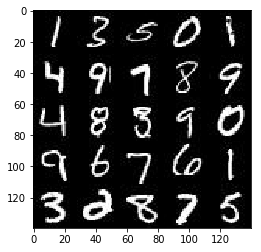

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join('./data', 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

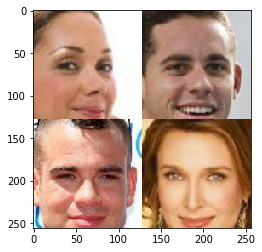

In [3]:
show_n_images = 4

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
celeb_images = helper.get_batch(glob(os.path.join(data_dir,'img_align_celeba/*.jpg'))[:show_n_images], 128, 128, 'RGB')
pyplot.imshow(helper.images_square_grid(celeb_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.3.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    input_real=tf.placeholder(tf.float32, (None, image_width, image_height, image_channels) , name='input_real')
    input_z =tf.placeholder(tf.float32, (None, z_dim) , name='input_z')
    lr = tf.placeholder(tf.float32,  name ='learning_rate')
    return input_real, input_z, lr


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

ERROR:tensorflow:==================================
Object was never used (type <class 'tensorflow.python.framework.ops.Operation'>):
<tf.Operation 'assert_rank_2/Assert/Assert' type=Assert>
If you want to mark it as used call its "mark_used()" method.
It was originally created here:
['File "/usr/lib/python3.5/runpy.py", line 184, in _run_module_as_main\n    "__main__", mod_spec)', 'File "/usr/lib/python3.5/runpy.py", line 85, in _run_code\n    exec(code, run_globals)', 'File "/usr/local/lib/python3.5/dist-packages/ipykernel_launcher.py", line 16, in <module>\n    app.launch_new_instance()', 'File "/usr/local/lib/python3.5/dist-packages/traitlets/config/application.py", line 658, in launch_instance\n    app.start()', 'File "/usr/local/lib/python3.5/dist-packages/ipykernel/kernelapp.py", line 477, in start\n    ioloop.IOLoop.instance().start()', 'File "/usr/local/lib/python3.5/dist-packages/zmq/eventloop/ioloop.py", line 177, in start\n    super(ZMQIOLoop, self).start()', 'File "/usr/lo

### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [6]:
alpha = 0.01
keep_prob = 0.7
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    kernel_size=4
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 
        x1 = tf.layers.conv2d(images, 64, kernel_size, strides=2, padding='same',
                             kernel_initializer=tf.contrib.layers.xavier_initializer_conv2d(
                                                   uniform=True, 
                                                   seed=3, 
                                                   dtype=tf.float32))
        x1 = tf.maximum(alpha*x1, x1)
        x1 = tf.nn.dropout(x1, keep_prob=keep_prob)
        #16*16*64
#         print(x1.shape)
        x2 = tf.layers.conv2d(x1, 128, kernel_size, strides=2, padding='same' ,
                             kernel_initializer=tf.contrib.layers.xavier_initializer_conv2d(
                                                   uniform=True, 
                                                   seed=3, 
                                                   dtype=tf.float32))
        x2 = tf.layers.batch_normalization(x2, training=True)
        x2 = tf.maximum(alpha*x2, x2)
        x2 = tf.nn.dropout(x2, keep_prob=keep_prob)
        #8*8*128
#         print(x2.shape)
        
        x3 = tf.layers.conv2d(x2, 256, kernel_size, strides=2, padding='same' ,
                             kernel_initializer=tf.contrib.layers.xavier_initializer_conv2d(
                                                   uniform=True, 
                                                   seed=3, 
                                                   dtype=tf.float32))
        x3 = tf.layers.batch_normalization(x3, training=True)
        x3 = tf.maximum(alpha*x3, x3)
        x3 = tf.nn.dropout(x3, keep_prob=keep_prob)
        #4*4*256
#         print(x3.shape)
        
        flats = tf.reshape(x3, [-1, 4*4*256])
        logits = tf.layers.dense( flats, 1,activation=None)
        out = tf.sigmoid(logits)
        
        return out, logits
    
"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [7]:
alpha=0.2
keep_prob=0.6
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    kernel_size=4
    with tf.variable_scope('generator', reuse= not is_train):
        # First fully connected layer
        x1=tf.layers.dense(z, 7*7*512)
        x1=tf.reshape(x1, [-1,7,7,512])
        x1=tf.maximum(alpha * x1, x1)
        x1 = tf.nn.dropout(x1, keep_prob=keep_prob)
        print("x1",x1.shape)
        x2=tf.layers.conv2d_transpose(x1, 128, kernel_size, strides=2, padding='same',
                             kernel_initializer=tf.contrib.layers.xavier_initializer_conv2d(
                                                   uniform=True, 
                                                   seed=3, 
                                                   dtype=tf.float32))
        x2=tf.layers.batch_normalization(x2, training=is_train)
        x2=tf.maximum(alpha * x2, x2)
        x1 = tf.nn.dropout(x1, keep_prob=keep_prob)
        print("x2",x2.shape)
        x3=tf.layers.conv2d_transpose(x2, 32, kernel_size, strides=2, padding='same',
                             kernel_initializer=tf.contrib.layers.xavier_initializer_conv2d(
                                                   uniform=True, 
                                                   seed=3, 
                                                   dtype=tf.float32))
        x3=tf.layers.batch_normalization(x3, training=is_train)
        x3=tf.maximum(alpha * x3, x3)
        x3 = tf.nn.dropout(x3, keep_prob=keep_prob)
        print("x3",x3.shape)
        
#         x4=tf.layers.conv2d_transpose(x3, 8, 5, strides=2, padding='same')
#         x4=tf.layers.batch_normalization(x4, training=is_train)
#         x4=tf.maximum(alpha * x4, x4)
#         print("x4",x4.shape)
        # Output layer, 28*28*3
        logits = tf.layers.conv2d_transpose(x3, out_channel_dim, kernel_size, strides=1, padding='same',
                             kernel_initializer=tf.contrib.layers.xavier_initializer_conv2d(
                                                   uniform=True, 
                                                   seed=3, 
                                                   dtype=tf.float32))
#         logits=tf.reshape(logits, [-1,28,28,out_channel_dim])
        print("logits",logits.shape)
        out = tf.tanh(logits)
        
        return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 5)
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 5)
Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    g_model =  generator(input_z, out_channel_dim, is_train=True)
    d_model_real, d_logits_real = discriminator(input_real, reuse=False)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)
    smooth = 0.1
    d_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits = d_logits_real, 
                                                                         labels = tf.ones_like(d_model_real)*(1-smooth)))
    d_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits = d_logits_fake, labels = tf.zeros_like(d_model_fake)))
    d_loss= d_loss_real+d_loss_fake
    g_loss =tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits = d_logits_fake, labels = tf.ones_like(d_model_fake)) )
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 4)
Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [11]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    n_samples, width, height, channels = data_shape
    input_real, input_z, learn_rate = model_inputs(width, height, channels, z_dim)
    d_loss, g_loss = model_loss(input_real, input_z, channels)
    d_opt, g_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    
    steps = 0
    show_every = 50
    print_every = 10
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
#                 print("batch_images", len(batch_images))
                # TODO: Train Model
                steps += 1
                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                batch_images=batch_images*2 #learned this trick from the Udacity forum!
                
                # Run optimizers
                _ = sess.run(d_opt, feed_dict={input_real: batch_images, input_z: batch_z, learn_rate: learning_rate})
                _ = sess.run(g_opt, feed_dict={input_real: batch_images, input_z: batch_z, learn_rate: learning_rate})

                if steps % show_every == 0:
                    n_images = 16
                    show_generator_output(sess, n_images, input_z, channels, data_image_mode)

                if steps % print_every == 0:
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})

                    print("Epoch {}/{}...".format(epoch_i, epoch_count),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
            


### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)
Epoch 0/3... Discriminator Loss: 0.6402... Generator Loss: 2.1522
Epoch 0/3... Discriminator Loss: 0.5626... Generator Loss: 2.8482
Epoch 0/3... Discriminator Loss: 0.6236... Generator Loss: 2.2718
Epoch 0/3... Discriminator Loss: 0.8495... Generator Loss: 2.1382
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


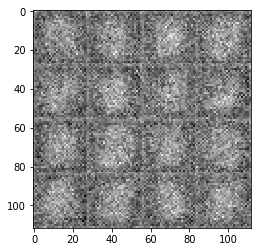

Epoch 0/3... Discriminator Loss: 0.8767... Generator Loss: 1.7802
Epoch 0/3... Discriminator Loss: 1.1199... Generator Loss: 1.6563
Epoch 0/3... Discriminator Loss: 0.9988... Generator Loss: 2.2566
Epoch 0/3... Discriminator Loss: 1.0552... Generator Loss: 1.7793
Epoch 0/3... Discriminator Loss: 0.9067... Generator Loss: 1.7290
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


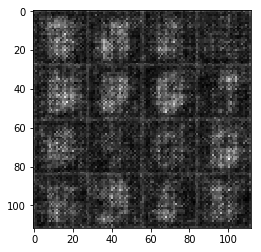

Epoch 0/3... Discriminator Loss: 0.7509... Generator Loss: 2.2059
Epoch 0/3... Discriminator Loss: 0.9304... Generator Loss: 3.5593
Epoch 0/3... Discriminator Loss: 1.0271... Generator Loss: 1.7870
Epoch 0/3... Discriminator Loss: 1.3010... Generator Loss: 1.8838
Epoch 0/3... Discriminator Loss: 0.8873... Generator Loss: 1.5026
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


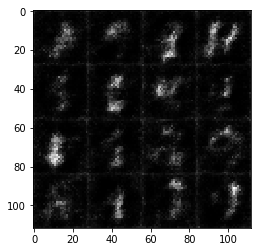

Epoch 0/3... Discriminator Loss: 1.3441... Generator Loss: 1.7544
Epoch 0/3... Discriminator Loss: 1.3287... Generator Loss: 1.6397
Epoch 0/3... Discriminator Loss: 0.9781... Generator Loss: 2.1757
Epoch 0/3... Discriminator Loss: 0.9047... Generator Loss: 2.2561
Epoch 0/3... Discriminator Loss: 1.2385... Generator Loss: 1.0442
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


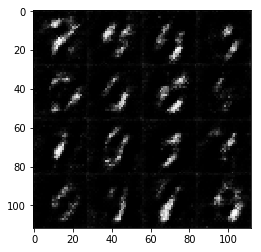

Epoch 0/3... Discriminator Loss: 1.3250... Generator Loss: 3.1094
Epoch 0/3... Discriminator Loss: 1.1392... Generator Loss: 1.8422
Epoch 0/3... Discriminator Loss: 1.1763... Generator Loss: 2.1777
Epoch 0/3... Discriminator Loss: 1.1726... Generator Loss: 1.7576
Epoch 0/3... Discriminator Loss: 0.9761... Generator Loss: 1.4817
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


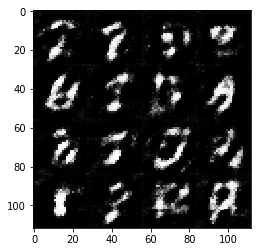

Epoch 0/3... Discriminator Loss: 1.1876... Generator Loss: 1.7283
Epoch 0/3... Discriminator Loss: 1.1147... Generator Loss: 2.5442
Epoch 0/3... Discriminator Loss: 1.2597... Generator Loss: 2.5535
Epoch 0/3... Discriminator Loss: 1.3423... Generator Loss: 1.4637
Epoch 0/3... Discriminator Loss: 1.3404... Generator Loss: 1.6579
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


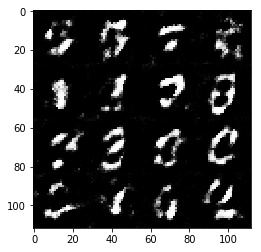

Epoch 0/3... Discriminator Loss: 1.1526... Generator Loss: 1.6904
Epoch 0/3... Discriminator Loss: 1.2899... Generator Loss: 1.3802
Epoch 0/3... Discriminator Loss: 1.3627... Generator Loss: 1.8868
Epoch 0/3... Discriminator Loss: 1.2121... Generator Loss: 2.0957
Epoch 0/3... Discriminator Loss: 1.3180... Generator Loss: 1.7930
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


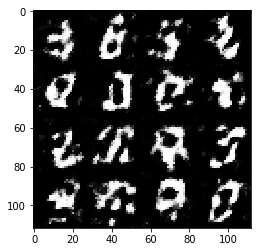

Epoch 0/3... Discriminator Loss: 1.4450... Generator Loss: 1.1772
Epoch 0/3... Discriminator Loss: 1.3219... Generator Loss: 1.7334
Epoch 0/3... Discriminator Loss: 1.1578... Generator Loss: 1.5867
Epoch 0/3... Discriminator Loss: 1.1108... Generator Loss: 1.7547
Epoch 0/3... Discriminator Loss: 1.2454... Generator Loss: 1.2818
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


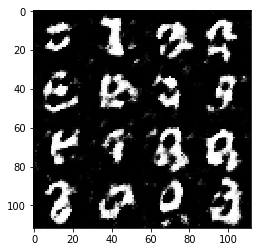

Epoch 0/3... Discriminator Loss: 1.1061... Generator Loss: 1.1625
Epoch 0/3... Discriminator Loss: 0.9970... Generator Loss: 1.3548
Epoch 0/3... Discriminator Loss: 0.9039... Generator Loss: 1.7653
Epoch 0/3... Discriminator Loss: 1.1814... Generator Loss: 1.3702
Epoch 0/3... Discriminator Loss: 1.0320... Generator Loss: 1.7607
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


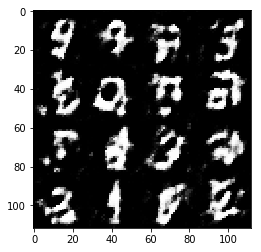

Epoch 0/3... Discriminator Loss: 1.2300... Generator Loss: 1.6225
Epoch 0/3... Discriminator Loss: 1.3039... Generator Loss: 1.0479
Epoch 0/3... Discriminator Loss: 1.0554... Generator Loss: 1.3811
Epoch 0/3... Discriminator Loss: 1.1793... Generator Loss: 1.3496
Epoch 0/3... Discriminator Loss: 1.0903... Generator Loss: 1.7018
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


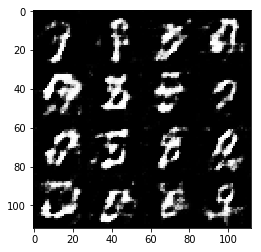

Epoch 0/3... Discriminator Loss: 1.0146... Generator Loss: 2.0662
Epoch 0/3... Discriminator Loss: 1.2845... Generator Loss: 0.8322
Epoch 0/3... Discriminator Loss: 1.1710... Generator Loss: 1.9237
Epoch 0/3... Discriminator Loss: 1.1889... Generator Loss: 1.1648
Epoch 0/3... Discriminator Loss: 0.8876... Generator Loss: 1.5631
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


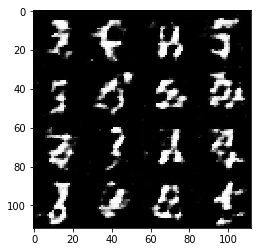

Epoch 0/3... Discriminator Loss: 1.1098... Generator Loss: 1.2199
Epoch 0/3... Discriminator Loss: 1.4241... Generator Loss: 1.6103
Epoch 0/3... Discriminator Loss: 1.1637... Generator Loss: 1.0163
Epoch 0/3... Discriminator Loss: 1.1716... Generator Loss: 1.3760
Epoch 0/3... Discriminator Loss: 1.0238... Generator Loss: 1.0041
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


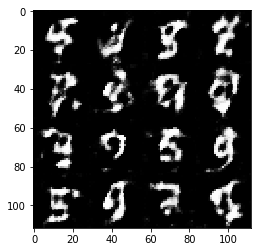

Epoch 0/3... Discriminator Loss: 1.4387... Generator Loss: 1.7935
Epoch 0/3... Discriminator Loss: 1.0820... Generator Loss: 2.1118
Epoch 0/3... Discriminator Loss: 1.6073... Generator Loss: 0.8614
Epoch 0/3... Discriminator Loss: 1.1664... Generator Loss: 1.2853
Epoch 0/3... Discriminator Loss: 0.8855... Generator Loss: 1.3695
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


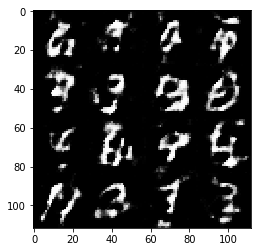

Epoch 0/3... Discriminator Loss: 1.0987... Generator Loss: 1.9437
Epoch 0/3... Discriminator Loss: 1.2596... Generator Loss: 1.1089
Epoch 0/3... Discriminator Loss: 0.9401... Generator Loss: 1.1911
Epoch 0/3... Discriminator Loss: 1.0327... Generator Loss: 2.1963
Epoch 0/3... Discriminator Loss: 1.0580... Generator Loss: 1.6335
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


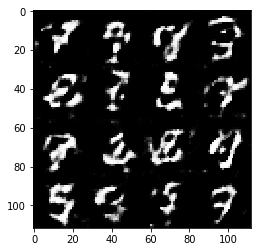

Epoch 0/3... Discriminator Loss: 1.1586... Generator Loss: 1.5385
Epoch 0/3... Discriminator Loss: 1.2140... Generator Loss: 1.4304
Epoch 0/3... Discriminator Loss: 1.0656... Generator Loss: 1.2354
Epoch 0/3... Discriminator Loss: 1.2397... Generator Loss: 2.2120
Epoch 0/3... Discriminator Loss: 1.0147... Generator Loss: 1.7210
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


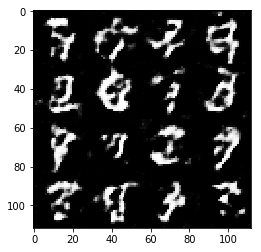

Epoch 0/3... Discriminator Loss: 1.0071... Generator Loss: 1.9312
Epoch 0/3... Discriminator Loss: 1.1739... Generator Loss: 1.0746
Epoch 0/3... Discriminator Loss: 1.1594... Generator Loss: 1.6484
Epoch 0/3... Discriminator Loss: 1.0430... Generator Loss: 1.2528
Epoch 0/3... Discriminator Loss: 1.2529... Generator Loss: 0.7652
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


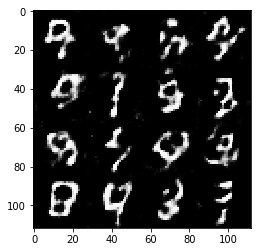

Epoch 0/3... Discriminator Loss: 1.0733... Generator Loss: 1.4355
Epoch 0/3... Discriminator Loss: 1.0042... Generator Loss: 0.8745
Epoch 0/3... Discriminator Loss: 1.0767... Generator Loss: 1.9473
Epoch 0/3... Discriminator Loss: 0.8941... Generator Loss: 1.4868
Epoch 0/3... Discriminator Loss: 0.9380... Generator Loss: 1.3214
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


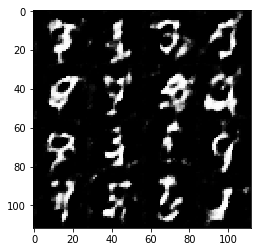

Epoch 0/3... Discriminator Loss: 1.1150... Generator Loss: 1.0902
Epoch 0/3... Discriminator Loss: 0.8590... Generator Loss: 1.8209
Epoch 0/3... Discriminator Loss: 1.0565... Generator Loss: 1.7828
Epoch 0/3... Discriminator Loss: 0.9150... Generator Loss: 1.5885
Epoch 0/3... Discriminator Loss: 1.1865... Generator Loss: 1.7847
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


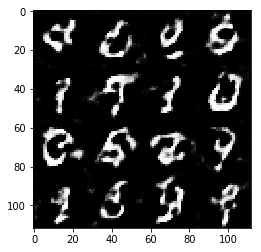

Epoch 0/3... Discriminator Loss: 0.8569... Generator Loss: 1.1217
Epoch 0/3... Discriminator Loss: 0.9059... Generator Loss: 1.7552
Epoch 0/3... Discriminator Loss: 1.1033... Generator Loss: 1.1618
Epoch 0/3... Discriminator Loss: 1.2882... Generator Loss: 1.1968
Epoch 0/3... Discriminator Loss: 1.2229... Generator Loss: 1.0103
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


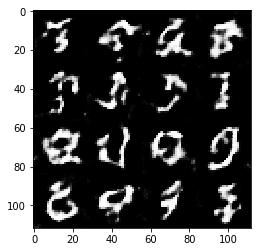

Epoch 0/3... Discriminator Loss: 1.2574... Generator Loss: 1.4318
Epoch 0/3... Discriminator Loss: 1.0298... Generator Loss: 1.7105
Epoch 0/3... Discriminator Loss: 1.0079... Generator Loss: 1.8003
Epoch 0/3... Discriminator Loss: 1.0587... Generator Loss: 1.5409
Epoch 0/3... Discriminator Loss: 1.2864... Generator Loss: 1.9916
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


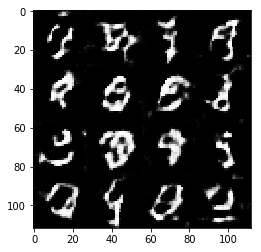

Epoch 0/3... Discriminator Loss: 0.9069... Generator Loss: 1.7414
Epoch 0/3... Discriminator Loss: 1.0549... Generator Loss: 1.2824
Epoch 0/3... Discriminator Loss: 1.1773... Generator Loss: 0.8714
Epoch 0/3... Discriminator Loss: 1.0074... Generator Loss: 1.2708
Epoch 0/3... Discriminator Loss: 1.0531... Generator Loss: 1.4390
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


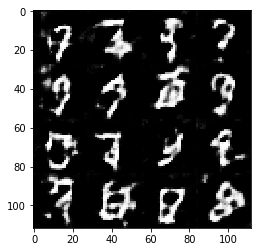

Epoch 0/3... Discriminator Loss: 0.9856... Generator Loss: 1.2064
Epoch 0/3... Discriminator Loss: 0.9912... Generator Loss: 1.5488
Epoch 0/3... Discriminator Loss: 1.0019... Generator Loss: 1.6188
Epoch 0/3... Discriminator Loss: 1.0584... Generator Loss: 1.4542
Epoch 0/3... Discriminator Loss: 0.9569... Generator Loss: 1.8199
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


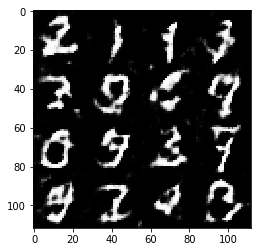

Epoch 0/3... Discriminator Loss: 1.1158... Generator Loss: 1.5138
Epoch 0/3... Discriminator Loss: 0.9478... Generator Loss: 2.3386
Epoch 0/3... Discriminator Loss: 1.1622... Generator Loss: 1.3378
Epoch 0/3... Discriminator Loss: 0.9982... Generator Loss: 1.5295
Epoch 0/3... Discriminator Loss: 1.2522... Generator Loss: 1.1579
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


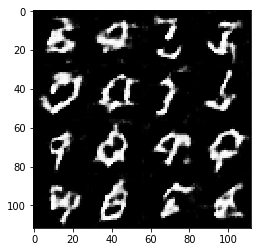

Epoch 0/3... Discriminator Loss: 1.0580... Generator Loss: 1.1998
Epoch 0/3... Discriminator Loss: 0.9315... Generator Loss: 1.8696
Epoch 0/3... Discriminator Loss: 1.1435... Generator Loss: 1.6455
Epoch 0/3... Discriminator Loss: 1.0934... Generator Loss: 1.3245
Epoch 0/3... Discriminator Loss: 1.0358... Generator Loss: 0.9229
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


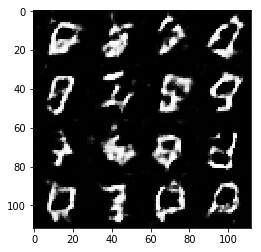

Epoch 0/3... Discriminator Loss: 1.1137... Generator Loss: 1.2062
Epoch 0/3... Discriminator Loss: 1.2922... Generator Loss: 1.8295
Epoch 0/3... Discriminator Loss: 1.2960... Generator Loss: 1.2635
Epoch 0/3... Discriminator Loss: 1.3883... Generator Loss: 0.9565
Epoch 0/3... Discriminator Loss: 0.9671... Generator Loss: 1.3346
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


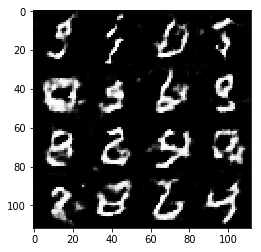

Epoch 0/3... Discriminator Loss: 1.2456... Generator Loss: 1.8215
Epoch 0/3... Discriminator Loss: 1.1866... Generator Loss: 1.2975
Epoch 0/3... Discriminator Loss: 0.9796... Generator Loss: 1.4715
Epoch 0/3... Discriminator Loss: 1.2149... Generator Loss: 1.1558
Epoch 0/3... Discriminator Loss: 1.2654... Generator Loss: 1.1478
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


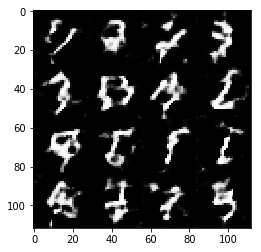

Epoch 0/3... Discriminator Loss: 1.0847... Generator Loss: 1.1791
Epoch 0/3... Discriminator Loss: 0.9597... Generator Loss: 1.0942
Epoch 0/3... Discriminator Loss: 1.3768... Generator Loss: 1.3752
Epoch 0/3... Discriminator Loss: 1.1054... Generator Loss: 1.8633
Epoch 0/3... Discriminator Loss: 1.0372... Generator Loss: 1.4253
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


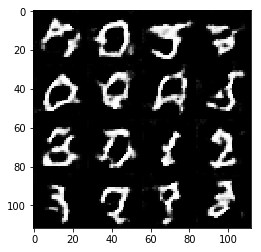

Epoch 0/3... Discriminator Loss: 1.2618... Generator Loss: 1.6748
Epoch 0/3... Discriminator Loss: 1.2941... Generator Loss: 1.8642
Epoch 0/3... Discriminator Loss: 1.2660... Generator Loss: 1.0448
Epoch 0/3... Discriminator Loss: 1.3464... Generator Loss: 1.1618
Epoch 0/3... Discriminator Loss: 1.1863... Generator Loss: 2.0815
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


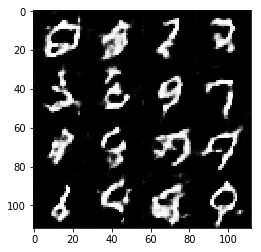

Epoch 0/3... Discriminator Loss: 1.0683... Generator Loss: 1.2841
Epoch 0/3... Discriminator Loss: 1.3547... Generator Loss: 1.4678
Epoch 0/3... Discriminator Loss: 1.1226... Generator Loss: 1.2554
Epoch 0/3... Discriminator Loss: 0.8638... Generator Loss: 1.6522
Epoch 0/3... Discriminator Loss: 1.1854... Generator Loss: 1.0421
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


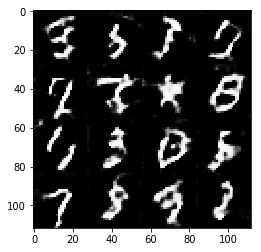

Epoch 0/3... Discriminator Loss: 1.2408... Generator Loss: 1.1691
Epoch 0/3... Discriminator Loss: 1.2826... Generator Loss: 1.6777
Epoch 0/3... Discriminator Loss: 1.2297... Generator Loss: 1.3780
Epoch 0/3... Discriminator Loss: 1.2004... Generator Loss: 0.9893
Epoch 0/3... Discriminator Loss: 1.1393... Generator Loss: 1.6467
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


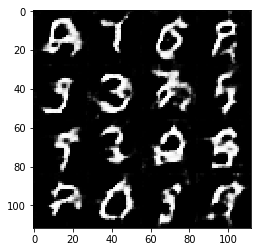

Epoch 0/3... Discriminator Loss: 1.4758... Generator Loss: 0.7330
Epoch 0/3... Discriminator Loss: 1.0903... Generator Loss: 1.5314
Epoch 0/3... Discriminator Loss: 1.1324... Generator Loss: 1.5793
Epoch 0/3... Discriminator Loss: 1.1324... Generator Loss: 1.5638
Epoch 0/3... Discriminator Loss: 1.1640... Generator Loss: 0.9341
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


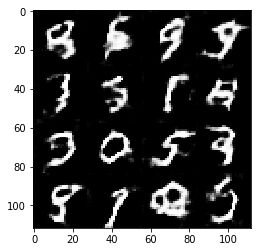

Epoch 0/3... Discriminator Loss: 1.0348... Generator Loss: 1.5346
Epoch 0/3... Discriminator Loss: 1.1376... Generator Loss: 1.2261
Epoch 0/3... Discriminator Loss: 1.1242... Generator Loss: 1.0068
Epoch 0/3... Discriminator Loss: 1.2381... Generator Loss: 1.2557
Epoch 0/3... Discriminator Loss: 1.1708... Generator Loss: 1.1809
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


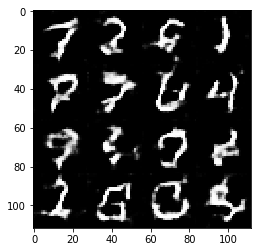

Epoch 0/3... Discriminator Loss: 1.1165... Generator Loss: 1.3896
Epoch 0/3... Discriminator Loss: 1.2438... Generator Loss: 1.0186
Epoch 0/3... Discriminator Loss: 1.3846... Generator Loss: 1.4881
Epoch 0/3... Discriminator Loss: 1.1691... Generator Loss: 1.1012
Epoch 0/3... Discriminator Loss: 1.3796... Generator Loss: 1.1707
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


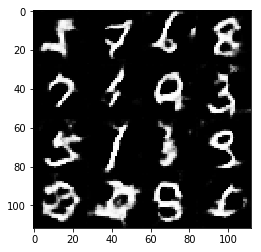

Epoch 0/3... Discriminator Loss: 1.1134... Generator Loss: 1.6648
Epoch 0/3... Discriminator Loss: 1.2780... Generator Loss: 1.2987
Epoch 0/3... Discriminator Loss: 1.2364... Generator Loss: 1.9410
Epoch 0/3... Discriminator Loss: 1.2803... Generator Loss: 1.5726
Epoch 0/3... Discriminator Loss: 1.4689... Generator Loss: 0.8494
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


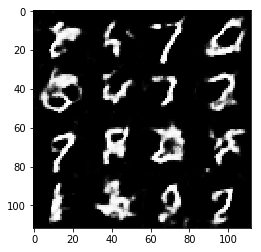

Epoch 0/3... Discriminator Loss: 1.3512... Generator Loss: 1.8204
Epoch 0/3... Discriminator Loss: 1.3735... Generator Loss: 1.2772
Epoch 0/3... Discriminator Loss: 1.3609... Generator Loss: 0.9106
Epoch 0/3... Discriminator Loss: 1.1421... Generator Loss: 1.4874
Epoch 0/3... Discriminator Loss: 1.1364... Generator Loss: 0.8893
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


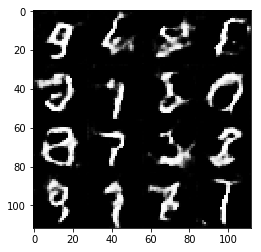

Epoch 0/3... Discriminator Loss: 1.1311... Generator Loss: 1.3926
Epoch 0/3... Discriminator Loss: 1.0085... Generator Loss: 1.1244
Epoch 0/3... Discriminator Loss: 1.3680... Generator Loss: 1.1014
Epoch 0/3... Discriminator Loss: 1.2152... Generator Loss: 1.1567
Epoch 0/3... Discriminator Loss: 1.1153... Generator Loss: 1.4884
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


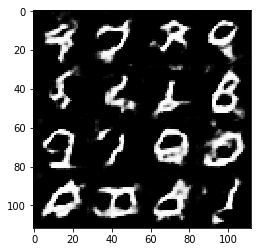

Epoch 0/3... Discriminator Loss: 1.2160... Generator Loss: 1.0947
Epoch 0/3... Discriminator Loss: 1.2104... Generator Loss: 1.0297
Epoch 0/3... Discriminator Loss: 1.1639... Generator Loss: 1.1862
Epoch 0/3... Discriminator Loss: 1.1838... Generator Loss: 1.1329
Epoch 0/3... Discriminator Loss: 1.4747... Generator Loss: 0.8942
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


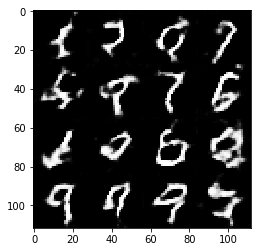

Epoch 0/3... Discriminator Loss: 0.9764... Generator Loss: 1.4743
Epoch 0/3... Discriminator Loss: 1.2157... Generator Loss: 1.7639
Epoch 0/3... Discriminator Loss: 1.0443... Generator Loss: 1.5929
Epoch 1/3... Discriminator Loss: 1.1045... Generator Loss: 0.9223
Epoch 1/3... Discriminator Loss: 1.1216... Generator Loss: 1.2497
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


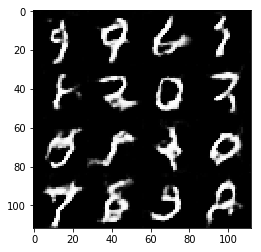

Epoch 1/3... Discriminator Loss: 1.1361... Generator Loss: 1.1008
Epoch 1/3... Discriminator Loss: 1.1859... Generator Loss: 1.2429
Epoch 1/3... Discriminator Loss: 1.2286... Generator Loss: 1.3944
Epoch 1/3... Discriminator Loss: 1.1767... Generator Loss: 0.5916
Epoch 1/3... Discriminator Loss: 1.0288... Generator Loss: 1.5199
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


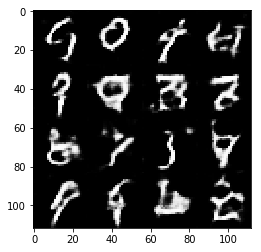

Epoch 1/3... Discriminator Loss: 1.1770... Generator Loss: 1.0793
Epoch 1/3... Discriminator Loss: 0.9654... Generator Loss: 1.3183
Epoch 1/3... Discriminator Loss: 1.2499... Generator Loss: 1.0414
Epoch 1/3... Discriminator Loss: 1.2445... Generator Loss: 1.1184
Epoch 1/3... Discriminator Loss: 1.3342... Generator Loss: 1.4751
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


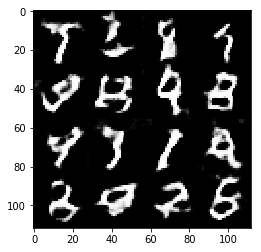

Epoch 1/3... Discriminator Loss: 1.3446... Generator Loss: 0.9327
Epoch 1/3... Discriminator Loss: 1.1885... Generator Loss: 1.4577
Epoch 1/3... Discriminator Loss: 1.0637... Generator Loss: 1.1677
Epoch 1/3... Discriminator Loss: 1.1022... Generator Loss: 1.3481
Epoch 1/3... Discriminator Loss: 1.1999... Generator Loss: 1.3004
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


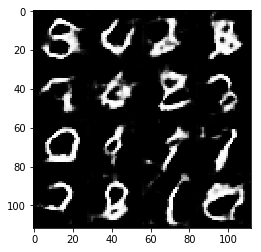

Epoch 1/3... Discriminator Loss: 1.0885... Generator Loss: 0.9515
Epoch 1/3... Discriminator Loss: 1.1145... Generator Loss: 1.3075
Epoch 1/3... Discriminator Loss: 1.1607... Generator Loss: 1.0904
Epoch 1/3... Discriminator Loss: 1.2819... Generator Loss: 1.0174
Epoch 1/3... Discriminator Loss: 1.1412... Generator Loss: 1.4615
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


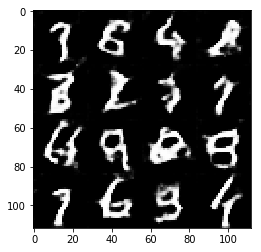

Epoch 1/3... Discriminator Loss: 1.2759... Generator Loss: 0.6577
Epoch 1/3... Discriminator Loss: 1.2584... Generator Loss: 0.9749
Epoch 1/3... Discriminator Loss: 1.2006... Generator Loss: 1.2066
Epoch 1/3... Discriminator Loss: 1.3990... Generator Loss: 1.0305
Epoch 1/3... Discriminator Loss: 1.3561... Generator Loss: 1.2988
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


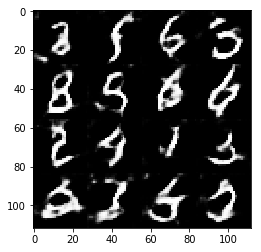

Epoch 1/3... Discriminator Loss: 1.1291... Generator Loss: 1.2480
Epoch 1/3... Discriminator Loss: 1.1393... Generator Loss: 1.2208
Epoch 1/3... Discriminator Loss: 1.1459... Generator Loss: 0.9098
Epoch 1/3... Discriminator Loss: 1.0938... Generator Loss: 1.7845
Epoch 1/3... Discriminator Loss: 1.0054... Generator Loss: 1.8228
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


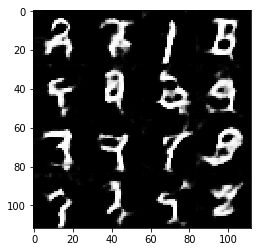

Epoch 1/3... Discriminator Loss: 1.3018... Generator Loss: 1.3028
Epoch 1/3... Discriminator Loss: 1.3611... Generator Loss: 0.8413
Epoch 1/3... Discriminator Loss: 1.3255... Generator Loss: 1.1360
Epoch 1/3... Discriminator Loss: 1.1837... Generator Loss: 1.3815
Epoch 1/3... Discriminator Loss: 1.2532... Generator Loss: 1.5712
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


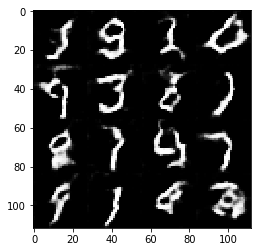

Epoch 1/3... Discriminator Loss: 1.3760... Generator Loss: 1.4794
Epoch 1/3... Discriminator Loss: 1.3224... Generator Loss: 1.5068
Epoch 1/3... Discriminator Loss: 1.2442... Generator Loss: 0.7286
Epoch 1/3... Discriminator Loss: 1.2948... Generator Loss: 0.9616
Epoch 1/3... Discriminator Loss: 1.0769... Generator Loss: 1.5816
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


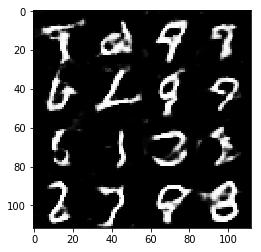

Epoch 1/3... Discriminator Loss: 1.0547... Generator Loss: 1.5889
Epoch 1/3... Discriminator Loss: 1.1745... Generator Loss: 1.4719
Epoch 1/3... Discriminator Loss: 0.8865... Generator Loss: 1.3597
Epoch 1/3... Discriminator Loss: 1.0263... Generator Loss: 1.4893
Epoch 1/3... Discriminator Loss: 1.1950... Generator Loss: 1.1594
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


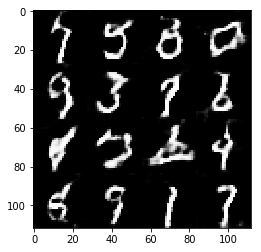

Epoch 1/3... Discriminator Loss: 0.8736... Generator Loss: 1.2991
Epoch 1/3... Discriminator Loss: 1.2294... Generator Loss: 1.5112
Epoch 1/3... Discriminator Loss: 1.0932... Generator Loss: 1.5758
Epoch 1/3... Discriminator Loss: 1.1569... Generator Loss: 1.7079
Epoch 1/3... Discriminator Loss: 1.1365... Generator Loss: 1.5755
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


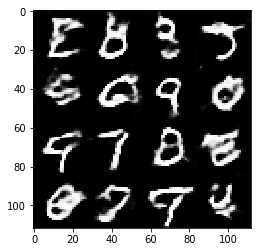

Epoch 1/3... Discriminator Loss: 1.1101... Generator Loss: 1.0222
Epoch 1/3... Discriminator Loss: 1.1203... Generator Loss: 1.3002
Epoch 1/3... Discriminator Loss: 1.0741... Generator Loss: 1.0870
Epoch 1/3... Discriminator Loss: 1.0631... Generator Loss: 1.6192
Epoch 1/3... Discriminator Loss: 1.0314... Generator Loss: 1.3491
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


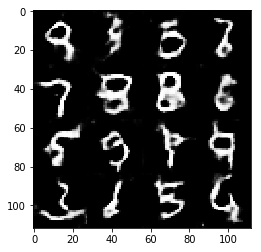

Epoch 1/3... Discriminator Loss: 1.0502... Generator Loss: 1.2578
Epoch 1/3... Discriminator Loss: 1.0099... Generator Loss: 1.2838
Epoch 1/3... Discriminator Loss: 1.1536... Generator Loss: 1.4996
Epoch 1/3... Discriminator Loss: 1.0460... Generator Loss: 1.0734
Epoch 1/3... Discriminator Loss: 1.2095... Generator Loss: 1.0909
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


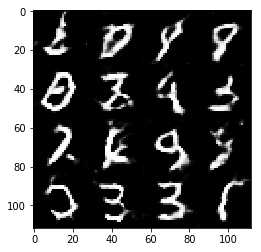

Epoch 1/3... Discriminator Loss: 0.9724... Generator Loss: 1.1682
Epoch 1/3... Discriminator Loss: 0.9653... Generator Loss: 1.2249
Epoch 1/3... Discriminator Loss: 1.1851... Generator Loss: 1.7180
Epoch 1/3... Discriminator Loss: 1.3509... Generator Loss: 0.9339
Epoch 1/3... Discriminator Loss: 1.1670... Generator Loss: 1.1822
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


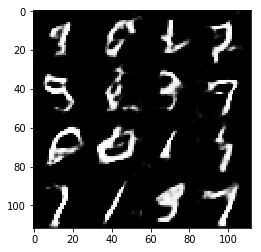

Epoch 1/3... Discriminator Loss: 1.2928... Generator Loss: 1.4092
Epoch 1/3... Discriminator Loss: 1.1846... Generator Loss: 1.2878
Epoch 1/3... Discriminator Loss: 0.9939... Generator Loss: 0.8085
Epoch 1/3... Discriminator Loss: 0.8480... Generator Loss: 1.0558
Epoch 1/3... Discriminator Loss: 1.1574... Generator Loss: 1.2899
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


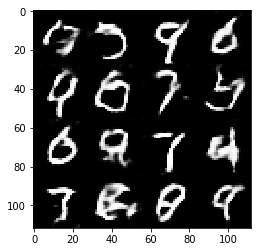

Epoch 1/3... Discriminator Loss: 1.0147... Generator Loss: 1.2652
Epoch 1/3... Discriminator Loss: 1.1684... Generator Loss: 1.0659
Epoch 1/3... Discriminator Loss: 1.0415... Generator Loss: 1.1207
Epoch 1/3... Discriminator Loss: 1.2083... Generator Loss: 1.7260
Epoch 1/3... Discriminator Loss: 1.1120... Generator Loss: 1.3450
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


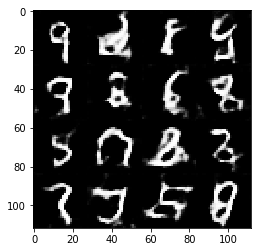

Epoch 1/3... Discriminator Loss: 1.3205... Generator Loss: 0.9844
Epoch 1/3... Discriminator Loss: 1.3212... Generator Loss: 1.3558
Epoch 1/3... Discriminator Loss: 1.1644... Generator Loss: 1.1495
Epoch 1/3... Discriminator Loss: 0.9420... Generator Loss: 1.7915
Epoch 1/3... Discriminator Loss: 0.9914... Generator Loss: 1.3365
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


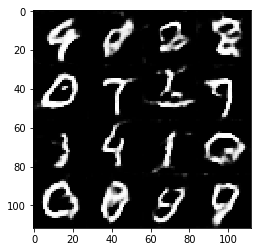

Epoch 1/3... Discriminator Loss: 1.1505... Generator Loss: 1.6257
Epoch 1/3... Discriminator Loss: 1.1797... Generator Loss: 1.4160
Epoch 1/3... Discriminator Loss: 1.3483... Generator Loss: 0.8547
Epoch 1/3... Discriminator Loss: 1.3456... Generator Loss: 0.8844
Epoch 1/3... Discriminator Loss: 1.1444... Generator Loss: 1.1063
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


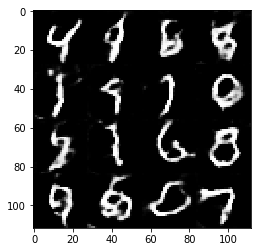

Epoch 1/3... Discriminator Loss: 1.0886... Generator Loss: 1.2971
Epoch 1/3... Discriminator Loss: 1.1031... Generator Loss: 1.4713
Epoch 1/3... Discriminator Loss: 1.1841... Generator Loss: 1.4321
Epoch 1/3... Discriminator Loss: 1.0858... Generator Loss: 1.5300
Epoch 1/3... Discriminator Loss: 1.4209... Generator Loss: 1.3210
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


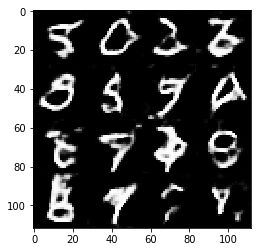

Epoch 1/3... Discriminator Loss: 1.3769... Generator Loss: 0.4853
Epoch 1/3... Discriminator Loss: 1.0455... Generator Loss: 1.3126
Epoch 1/3... Discriminator Loss: 1.0266... Generator Loss: 1.7142
Epoch 1/3... Discriminator Loss: 1.3087... Generator Loss: 1.1623
Epoch 1/3... Discriminator Loss: 1.1112... Generator Loss: 1.6218
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


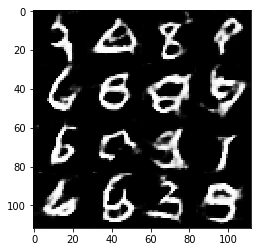

Epoch 1/3... Discriminator Loss: 1.2243... Generator Loss: 1.4091
Epoch 1/3... Discriminator Loss: 0.9557... Generator Loss: 1.5347
Epoch 1/3... Discriminator Loss: 1.1977... Generator Loss: 1.6971
Epoch 1/3... Discriminator Loss: 1.2561... Generator Loss: 0.7181
Epoch 1/3... Discriminator Loss: 1.1187... Generator Loss: 1.1216
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


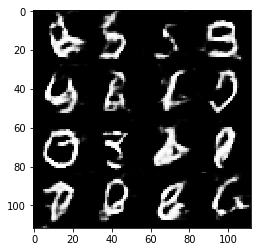

Epoch 1/3... Discriminator Loss: 0.9283... Generator Loss: 1.2478
Epoch 1/3... Discriminator Loss: 1.2538... Generator Loss: 1.5477
Epoch 1/3... Discriminator Loss: 0.8732... Generator Loss: 1.1657
Epoch 1/3... Discriminator Loss: 1.1530... Generator Loss: 0.9721
Epoch 1/3... Discriminator Loss: 1.4144... Generator Loss: 1.3364
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


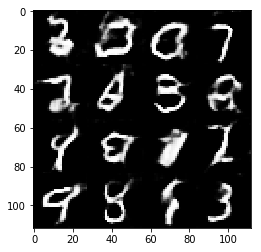

Epoch 1/3... Discriminator Loss: 1.0432... Generator Loss: 1.1863
Epoch 1/3... Discriminator Loss: 1.1466... Generator Loss: 0.9080
Epoch 1/3... Discriminator Loss: 1.0402... Generator Loss: 1.1633
Epoch 1/3... Discriminator Loss: 1.0455... Generator Loss: 1.4199
Epoch 1/3... Discriminator Loss: 1.1731... Generator Loss: 1.1769
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


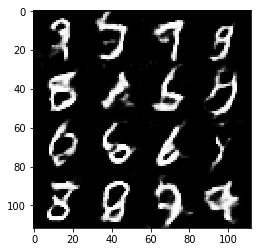

Epoch 1/3... Discriminator Loss: 1.1848... Generator Loss: 2.1489
Epoch 1/3... Discriminator Loss: 1.0032... Generator Loss: 1.4724
Epoch 1/3... Discriminator Loss: 1.2063... Generator Loss: 1.2731
Epoch 1/3... Discriminator Loss: 1.2307... Generator Loss: 1.0044
Epoch 1/3... Discriminator Loss: 1.1283... Generator Loss: 1.1725
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


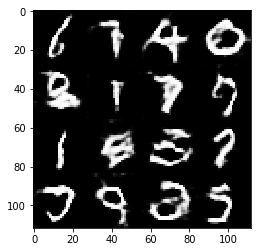

Epoch 1/3... Discriminator Loss: 1.1450... Generator Loss: 1.4393
Epoch 1/3... Discriminator Loss: 1.2273... Generator Loss: 1.2281
Epoch 1/3... Discriminator Loss: 1.2703... Generator Loss: 1.0433
Epoch 1/3... Discriminator Loss: 1.0391... Generator Loss: 0.9215
Epoch 1/3... Discriminator Loss: 1.1718... Generator Loss: 1.8715
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


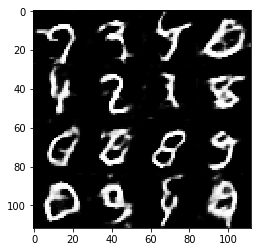

Epoch 1/3... Discriminator Loss: 1.4264... Generator Loss: 1.6454
Epoch 1/3... Discriminator Loss: 1.2538... Generator Loss: 1.1856
Epoch 1/3... Discriminator Loss: 0.8836... Generator Loss: 1.8990
Epoch 1/3... Discriminator Loss: 1.1122... Generator Loss: 1.0926
Epoch 1/3... Discriminator Loss: 1.3347... Generator Loss: 1.4197
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


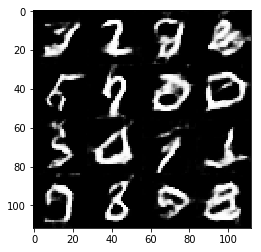

Epoch 1/3... Discriminator Loss: 1.1701... Generator Loss: 1.2835
Epoch 1/3... Discriminator Loss: 1.1789... Generator Loss: 1.2200
Epoch 1/3... Discriminator Loss: 1.2244... Generator Loss: 1.3313
Epoch 1/3... Discriminator Loss: 1.0696... Generator Loss: 1.4393
Epoch 1/3... Discriminator Loss: 1.4722... Generator Loss: 1.7689
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


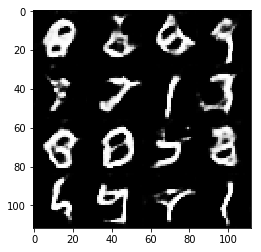

Epoch 1/3... Discriminator Loss: 1.3270... Generator Loss: 1.1866
Epoch 1/3... Discriminator Loss: 0.9796... Generator Loss: 1.8026
Epoch 1/3... Discriminator Loss: 1.1142... Generator Loss: 0.9577
Epoch 1/3... Discriminator Loss: 0.9764... Generator Loss: 1.5161
Epoch 1/3... Discriminator Loss: 1.1299... Generator Loss: 1.3050
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


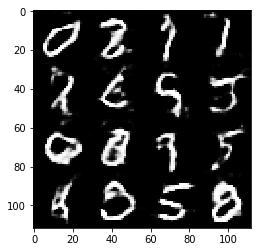

Epoch 1/3... Discriminator Loss: 1.2013... Generator Loss: 1.2546
Epoch 1/3... Discriminator Loss: 1.0412... Generator Loss: 1.2200
Epoch 1/3... Discriminator Loss: 0.8285... Generator Loss: 1.4239
Epoch 1/3... Discriminator Loss: 1.0353... Generator Loss: 1.3866
Epoch 1/3... Discriminator Loss: 1.0988... Generator Loss: 1.7936
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


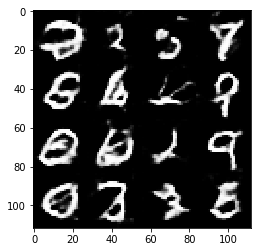

Epoch 1/3... Discriminator Loss: 1.0577... Generator Loss: 1.2628
Epoch 1/3... Discriminator Loss: 1.3148... Generator Loss: 1.2424
Epoch 1/3... Discriminator Loss: 1.0208... Generator Loss: 1.0748
Epoch 1/3... Discriminator Loss: 0.9714... Generator Loss: 1.9617
Epoch 1/3... Discriminator Loss: 0.9275... Generator Loss: 1.0594
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


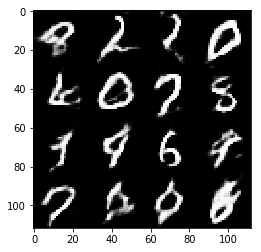

Epoch 1/3... Discriminator Loss: 1.3086... Generator Loss: 1.3394
Epoch 1/3... Discriminator Loss: 0.8640... Generator Loss: 1.0831
Epoch 1/3... Discriminator Loss: 1.0671... Generator Loss: 1.2853
Epoch 1/3... Discriminator Loss: 1.2114... Generator Loss: 0.6969
Epoch 1/3... Discriminator Loss: 1.2281... Generator Loss: 0.9561
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


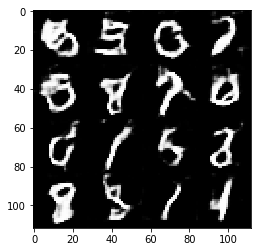

Epoch 1/3... Discriminator Loss: 1.1142... Generator Loss: 1.4480
Epoch 1/3... Discriminator Loss: 0.9770... Generator Loss: 1.4811
Epoch 1/3... Discriminator Loss: 1.2500... Generator Loss: 1.2094
Epoch 1/3... Discriminator Loss: 0.9912... Generator Loss: 0.8798
Epoch 1/3... Discriminator Loss: 1.1533... Generator Loss: 1.1077
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


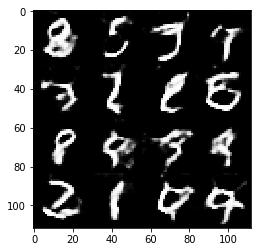

Epoch 1/3... Discriminator Loss: 1.1973... Generator Loss: 1.0595
Epoch 1/3... Discriminator Loss: 1.0454... Generator Loss: 1.1632
Epoch 1/3... Discriminator Loss: 1.0490... Generator Loss: 1.4161
Epoch 1/3... Discriminator Loss: 1.2135... Generator Loss: 1.2620
Epoch 1/3... Discriminator Loss: 1.0875... Generator Loss: 1.7269
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


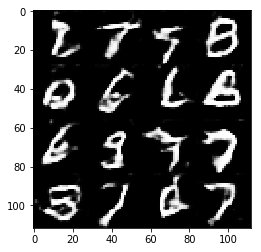

Epoch 1/3... Discriminator Loss: 1.1673... Generator Loss: 1.3874
Epoch 1/3... Discriminator Loss: 1.1055... Generator Loss: 1.8459
Epoch 1/3... Discriminator Loss: 1.3711... Generator Loss: 1.2963
Epoch 1/3... Discriminator Loss: 1.1733... Generator Loss: 0.8651
Epoch 1/3... Discriminator Loss: 0.9203... Generator Loss: 1.0301
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


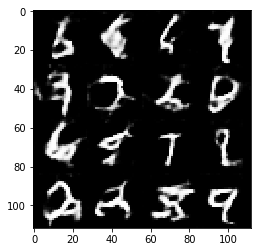

Epoch 1/3... Discriminator Loss: 0.8621... Generator Loss: 1.4174
Epoch 1/3... Discriminator Loss: 1.1365... Generator Loss: 1.1155
Epoch 1/3... Discriminator Loss: 1.0948... Generator Loss: 0.8009
Epoch 1/3... Discriminator Loss: 1.0664... Generator Loss: 2.1090
Epoch 1/3... Discriminator Loss: 1.1654... Generator Loss: 1.3791
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


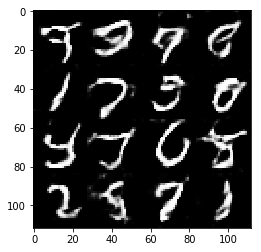

Epoch 1/3... Discriminator Loss: 0.8790... Generator Loss: 1.3041
Epoch 1/3... Discriminator Loss: 1.0741... Generator Loss: 0.8541
Epoch 1/3... Discriminator Loss: 0.9609... Generator Loss: 1.3369
Epoch 1/3... Discriminator Loss: 1.2310... Generator Loss: 1.0766
Epoch 1/3... Discriminator Loss: 1.0194... Generator Loss: 1.1617
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


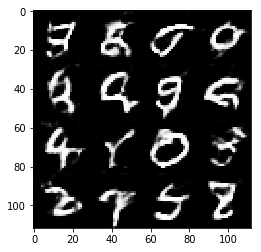

Epoch 1/3... Discriminator Loss: 1.0110... Generator Loss: 0.9746
Epoch 1/3... Discriminator Loss: 1.2642... Generator Loss: 1.1891
Epoch 1/3... Discriminator Loss: 1.1321... Generator Loss: 1.1456
Epoch 1/3... Discriminator Loss: 1.2038... Generator Loss: 1.1295
Epoch 1/3... Discriminator Loss: 1.0797... Generator Loss: 1.1150
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


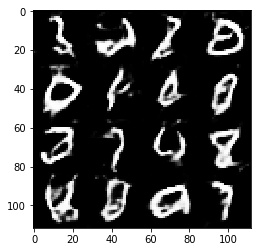

Epoch 1/3... Discriminator Loss: 0.9896... Generator Loss: 1.5906
Epoch 1/3... Discriminator Loss: 1.0278... Generator Loss: 0.7473
Epoch 1/3... Discriminator Loss: 1.0811... Generator Loss: 1.2083
Epoch 1/3... Discriminator Loss: 1.2513... Generator Loss: 1.0226
Epoch 1/3... Discriminator Loss: 0.8490... Generator Loss: 1.9017
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


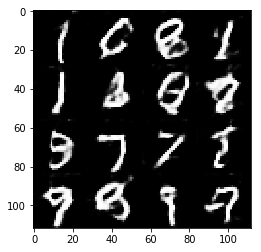

Epoch 1/3... Discriminator Loss: 1.0825... Generator Loss: 1.1963
Epoch 2/3... Discriminator Loss: 1.2797... Generator Loss: 1.8614
Epoch 2/3... Discriminator Loss: 0.9807... Generator Loss: 1.8192
Epoch 2/3... Discriminator Loss: 1.0736... Generator Loss: 1.1093
Epoch 2/3... Discriminator Loss: 1.1247... Generator Loss: 1.7268
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


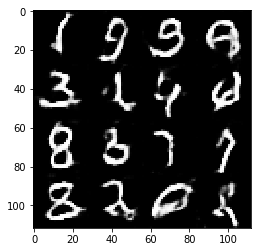

Epoch 2/3... Discriminator Loss: 0.9996... Generator Loss: 1.4785
Epoch 2/3... Discriminator Loss: 0.9623... Generator Loss: 0.8927
Epoch 2/3... Discriminator Loss: 0.9934... Generator Loss: 1.5633
Epoch 2/3... Discriminator Loss: 0.9917... Generator Loss: 1.3436
Epoch 2/3... Discriminator Loss: 1.1787... Generator Loss: 1.7034
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


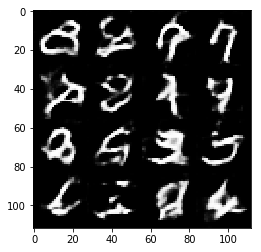

Epoch 2/3... Discriminator Loss: 1.0881... Generator Loss: 1.4082
Epoch 2/3... Discriminator Loss: 1.1198... Generator Loss: 0.7188
Epoch 2/3... Discriminator Loss: 1.1683... Generator Loss: 1.1409
Epoch 2/3... Discriminator Loss: 1.1644... Generator Loss: 1.2003
Epoch 2/3... Discriminator Loss: 1.0300... Generator Loss: 1.8848
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


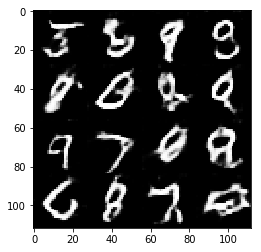

Epoch 2/3... Discriminator Loss: 0.8409... Generator Loss: 1.6908
Epoch 2/3... Discriminator Loss: 1.2778... Generator Loss: 1.0491
Epoch 2/3... Discriminator Loss: 0.9289... Generator Loss: 1.4555
Epoch 2/3... Discriminator Loss: 1.2333... Generator Loss: 0.8200
Epoch 2/3... Discriminator Loss: 0.8653... Generator Loss: 1.1470
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


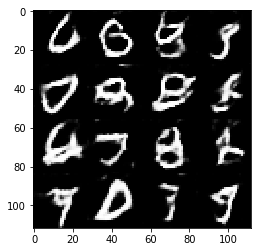

Epoch 2/3... Discriminator Loss: 1.1702... Generator Loss: 1.2754
Epoch 2/3... Discriminator Loss: 1.2496... Generator Loss: 1.2104
Epoch 2/3... Discriminator Loss: 1.0872... Generator Loss: 1.1285
Epoch 2/3... Discriminator Loss: 1.0506... Generator Loss: 2.0157
Epoch 2/3... Discriminator Loss: 0.9394... Generator Loss: 0.7574
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


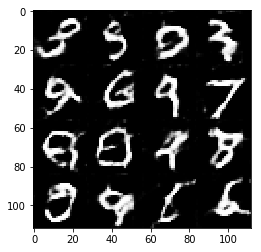

Epoch 2/3... Discriminator Loss: 1.1080... Generator Loss: 2.3127
Epoch 2/3... Discriminator Loss: 1.4298... Generator Loss: 1.0597
Epoch 2/3... Discriminator Loss: 0.8253... Generator Loss: 1.5751
Epoch 2/3... Discriminator Loss: 0.9545... Generator Loss: 1.3023
Epoch 2/3... Discriminator Loss: 1.1560... Generator Loss: 1.0044
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


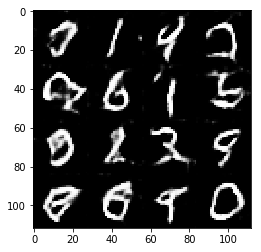

Epoch 2/3... Discriminator Loss: 0.8549... Generator Loss: 1.2740
Epoch 2/3... Discriminator Loss: 0.8952... Generator Loss: 1.7928
Epoch 2/3... Discriminator Loss: 1.1415... Generator Loss: 1.0378
Epoch 2/3... Discriminator Loss: 0.8801... Generator Loss: 1.7699
Epoch 2/3... Discriminator Loss: 1.2507... Generator Loss: 1.2773
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


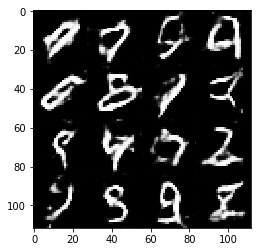

Epoch 2/3... Discriminator Loss: 0.8824... Generator Loss: 1.3213
Epoch 2/3... Discriminator Loss: 0.8994... Generator Loss: 1.9715
Epoch 2/3... Discriminator Loss: 1.1116... Generator Loss: 1.3622
Epoch 2/3... Discriminator Loss: 0.8860... Generator Loss: 1.1152
Epoch 2/3... Discriminator Loss: 1.0368... Generator Loss: 1.3965
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


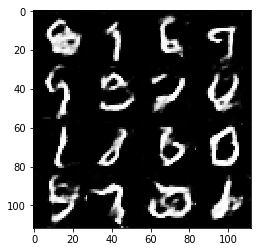

Epoch 2/3... Discriminator Loss: 0.9106... Generator Loss: 1.2714
Epoch 2/3... Discriminator Loss: 0.8131... Generator Loss: 1.4567
Epoch 2/3... Discriminator Loss: 1.2566... Generator Loss: 1.6912
Epoch 2/3... Discriminator Loss: 1.1130... Generator Loss: 0.8541
Epoch 2/3... Discriminator Loss: 0.9724... Generator Loss: 1.6145
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


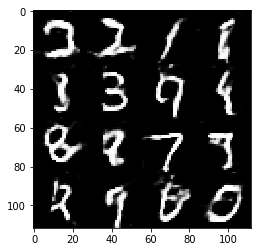

Epoch 2/3... Discriminator Loss: 1.0981... Generator Loss: 0.9419
Epoch 2/3... Discriminator Loss: 0.9294... Generator Loss: 1.8838
Epoch 2/3... Discriminator Loss: 1.0219... Generator Loss: 1.1950
Epoch 2/3... Discriminator Loss: 0.8720... Generator Loss: 1.2071
Epoch 2/3... Discriminator Loss: 1.3147... Generator Loss: 1.1456
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


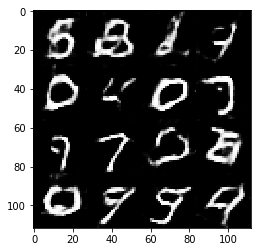

Epoch 2/3... Discriminator Loss: 1.0887... Generator Loss: 1.2356
Epoch 2/3... Discriminator Loss: 1.0623... Generator Loss: 1.1907
Epoch 2/3... Discriminator Loss: 0.9900... Generator Loss: 1.3956
Epoch 2/3... Discriminator Loss: 0.9953... Generator Loss: 1.5678
Epoch 2/3... Discriminator Loss: 1.2865... Generator Loss: 2.3898
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


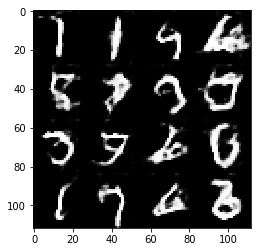

Epoch 2/3... Discriminator Loss: 0.9285... Generator Loss: 1.5543
Epoch 2/3... Discriminator Loss: 0.9681... Generator Loss: 1.0988
Epoch 2/3... Discriminator Loss: 1.0227... Generator Loss: 0.9584
Epoch 2/3... Discriminator Loss: 1.2004... Generator Loss: 1.5827
Epoch 2/3... Discriminator Loss: 1.0861... Generator Loss: 0.8769
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


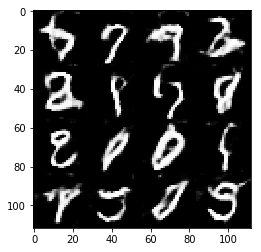

Epoch 2/3... Discriminator Loss: 0.9571... Generator Loss: 2.3375
Epoch 2/3... Discriminator Loss: 0.9462... Generator Loss: 1.4308
Epoch 2/3... Discriminator Loss: 1.2638... Generator Loss: 0.8581
Epoch 2/3... Discriminator Loss: 0.9859... Generator Loss: 1.2936
Epoch 2/3... Discriminator Loss: 0.9839... Generator Loss: 1.2912
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


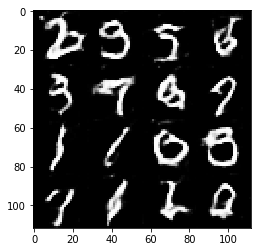

Epoch 2/3... Discriminator Loss: 0.9094... Generator Loss: 1.4185
Epoch 2/3... Discriminator Loss: 1.0413... Generator Loss: 0.9128
Epoch 2/3... Discriminator Loss: 1.0703... Generator Loss: 0.6584
Epoch 2/3... Discriminator Loss: 0.7559... Generator Loss: 1.3076
Epoch 2/3... Discriminator Loss: 1.0842... Generator Loss: 1.0850
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


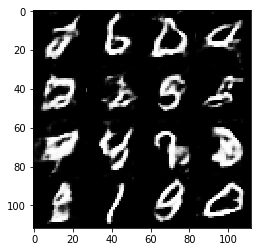

Epoch 2/3... Discriminator Loss: 1.5553... Generator Loss: 0.8212
Epoch 2/3... Discriminator Loss: 0.8965... Generator Loss: 1.0494
Epoch 2/3... Discriminator Loss: 1.0462... Generator Loss: 1.1862
Epoch 2/3... Discriminator Loss: 1.0402... Generator Loss: 1.2160
Epoch 2/3... Discriminator Loss: 1.1039... Generator Loss: 1.6587
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


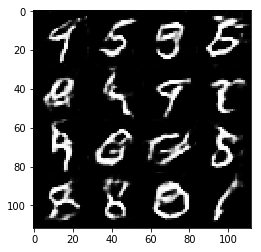

Epoch 2/3... Discriminator Loss: 0.7605... Generator Loss: 1.2412
Epoch 2/3... Discriminator Loss: 1.1633... Generator Loss: 1.3159
Epoch 2/3... Discriminator Loss: 1.0083... Generator Loss: 1.2596
Epoch 2/3... Discriminator Loss: 0.9029... Generator Loss: 1.7704
Epoch 2/3... Discriminator Loss: 1.1440... Generator Loss: 1.0429
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


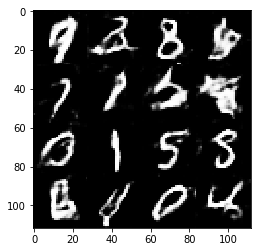

Epoch 2/3... Discriminator Loss: 0.8828... Generator Loss: 1.1979
Epoch 2/3... Discriminator Loss: 0.8698... Generator Loss: 1.2083
Epoch 2/3... Discriminator Loss: 0.9889... Generator Loss: 1.5315
Epoch 2/3... Discriminator Loss: 1.1254... Generator Loss: 1.4744
Epoch 2/3... Discriminator Loss: 1.6682... Generator Loss: 0.3463
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


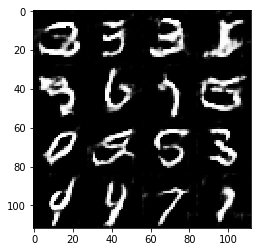

Epoch 2/3... Discriminator Loss: 0.9458... Generator Loss: 1.6094
Epoch 2/3... Discriminator Loss: 1.0931... Generator Loss: 1.5554
Epoch 2/3... Discriminator Loss: 1.0167... Generator Loss: 0.9883
Epoch 2/3... Discriminator Loss: 1.0209... Generator Loss: 2.7207
Epoch 2/3... Discriminator Loss: 1.0414... Generator Loss: 1.1571
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


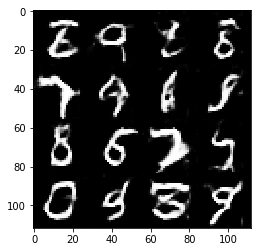

Epoch 2/3... Discriminator Loss: 0.9284... Generator Loss: 1.5531
Epoch 2/3... Discriminator Loss: 0.9621... Generator Loss: 1.3510
Epoch 2/3... Discriminator Loss: 1.5491... Generator Loss: 0.9412
Epoch 2/3... Discriminator Loss: 0.9815... Generator Loss: 1.4730
Epoch 2/3... Discriminator Loss: 1.1095... Generator Loss: 1.4977
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


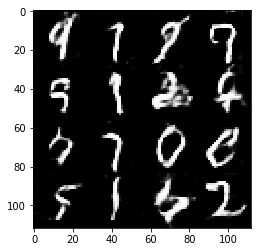

Epoch 2/3... Discriminator Loss: 0.9612... Generator Loss: 1.2187
Epoch 2/3... Discriminator Loss: 0.9975... Generator Loss: 2.2188
Epoch 2/3... Discriminator Loss: 0.9768... Generator Loss: 1.5600
Epoch 2/3... Discriminator Loss: 1.1249... Generator Loss: 0.9649
Epoch 2/3... Discriminator Loss: 1.0881... Generator Loss: 1.3488
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


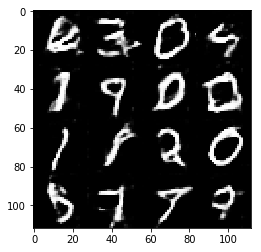

Epoch 2/3... Discriminator Loss: 0.9632... Generator Loss: 1.3911
Epoch 2/3... Discriminator Loss: 1.1302... Generator Loss: 1.1871
Epoch 2/3... Discriminator Loss: 1.0391... Generator Loss: 1.7104
Epoch 2/3... Discriminator Loss: 0.9451... Generator Loss: 1.4950
Epoch 2/3... Discriminator Loss: 0.9069... Generator Loss: 1.5958
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


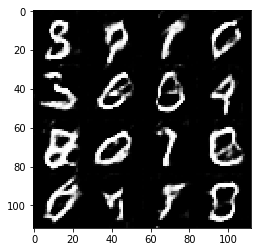

Epoch 2/3... Discriminator Loss: 0.9034... Generator Loss: 1.3680
Epoch 2/3... Discriminator Loss: 1.0162... Generator Loss: 1.2236
Epoch 2/3... Discriminator Loss: 0.9594... Generator Loss: 1.5467
Epoch 2/3... Discriminator Loss: 1.1214... Generator Loss: 1.4280
Epoch 2/3... Discriminator Loss: 0.9724... Generator Loss: 2.1155
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


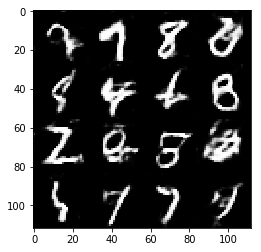

Epoch 2/3... Discriminator Loss: 1.1356... Generator Loss: 1.3793
Epoch 2/3... Discriminator Loss: 0.9897... Generator Loss: 1.3317
Epoch 2/3... Discriminator Loss: 1.1911... Generator Loss: 1.2274
Epoch 2/3... Discriminator Loss: 0.9406... Generator Loss: 1.2973
Epoch 2/3... Discriminator Loss: 1.3607... Generator Loss: 1.3048
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


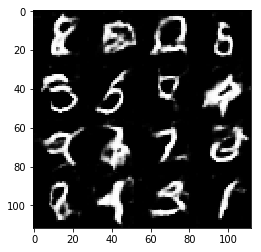

Epoch 2/3... Discriminator Loss: 0.8528... Generator Loss: 1.6556
Epoch 2/3... Discriminator Loss: 0.9305... Generator Loss: 1.5948
Epoch 2/3... Discriminator Loss: 1.3681... Generator Loss: 1.0626
Epoch 2/3... Discriminator Loss: 0.8617... Generator Loss: 1.5953
Epoch 2/3... Discriminator Loss: 0.8950... Generator Loss: 1.5082
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


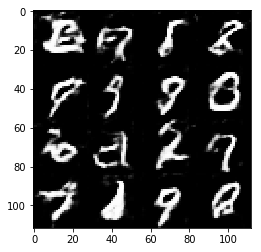

Epoch 2/3... Discriminator Loss: 1.0058... Generator Loss: 0.8612
Epoch 2/3... Discriminator Loss: 0.7924... Generator Loss: 1.0566
Epoch 2/3... Discriminator Loss: 1.1610... Generator Loss: 0.9302
Epoch 2/3... Discriminator Loss: 1.1929... Generator Loss: 1.5484
Epoch 2/3... Discriminator Loss: 0.9868... Generator Loss: 1.6404
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


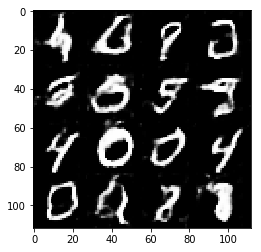

Epoch 2/3... Discriminator Loss: 1.1161... Generator Loss: 0.8664
Epoch 2/3... Discriminator Loss: 1.0449... Generator Loss: 1.1558
Epoch 2/3... Discriminator Loss: 1.0815... Generator Loss: 1.5584
Epoch 2/3... Discriminator Loss: 1.1694... Generator Loss: 1.0458
Epoch 2/3... Discriminator Loss: 0.8701... Generator Loss: 1.1175
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


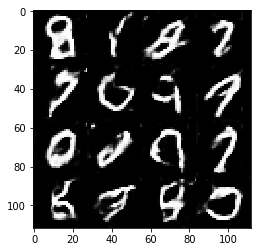

Epoch 2/3... Discriminator Loss: 1.0218... Generator Loss: 1.4939
Epoch 2/3... Discriminator Loss: 1.0606... Generator Loss: 1.0386
Epoch 2/3... Discriminator Loss: 1.3014... Generator Loss: 0.4771
Epoch 2/3... Discriminator Loss: 1.1709... Generator Loss: 0.8480
Epoch 2/3... Discriminator Loss: 1.1271... Generator Loss: 1.2390
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


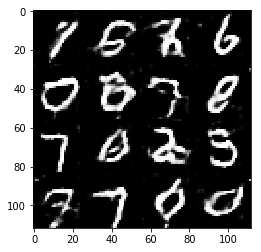

Epoch 2/3... Discriminator Loss: 1.0130... Generator Loss: 1.6573
Epoch 2/3... Discriminator Loss: 0.9290... Generator Loss: 1.0097
Epoch 2/3... Discriminator Loss: 0.8369... Generator Loss: 1.1349
Epoch 2/3... Discriminator Loss: 0.9240... Generator Loss: 1.3996
Epoch 2/3... Discriminator Loss: 0.9791... Generator Loss: 1.4840
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


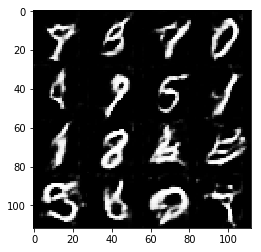

Epoch 2/3... Discriminator Loss: 0.8816... Generator Loss: 1.8840
Epoch 2/3... Discriminator Loss: 0.9804... Generator Loss: 1.5659
Epoch 2/3... Discriminator Loss: 0.9937... Generator Loss: 0.9613
Epoch 2/3... Discriminator Loss: 0.9461... Generator Loss: 1.3282
Epoch 2/3... Discriminator Loss: 1.1215... Generator Loss: 1.6993
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


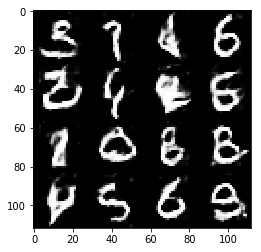

Epoch 2/3... Discriminator Loss: 1.2037... Generator Loss: 1.1349
Epoch 2/3... Discriminator Loss: 1.1292... Generator Loss: 2.1853
Epoch 2/3... Discriminator Loss: 1.1985... Generator Loss: 1.2702
Epoch 2/3... Discriminator Loss: 1.0298... Generator Loss: 0.8155
Epoch 2/3... Discriminator Loss: 1.0874... Generator Loss: 1.9066
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


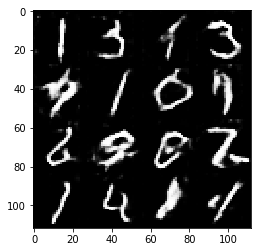

Epoch 2/3... Discriminator Loss: 1.1544... Generator Loss: 1.1170
Epoch 2/3... Discriminator Loss: 0.9761... Generator Loss: 1.9370
Epoch 2/3... Discriminator Loss: 0.8052... Generator Loss: 1.6766
Epoch 2/3... Discriminator Loss: 0.8149... Generator Loss: 1.6086
Epoch 2/3... Discriminator Loss: 1.2920... Generator Loss: 0.7545
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


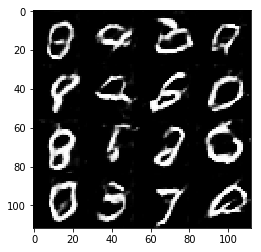

Epoch 2/3... Discriminator Loss: 0.9537... Generator Loss: 1.6343
Epoch 2/3... Discriminator Loss: 1.2600... Generator Loss: 1.8228
Epoch 2/3... Discriminator Loss: 1.0586... Generator Loss: 1.1532
Epoch 2/3... Discriminator Loss: 0.9385... Generator Loss: 1.3471
Epoch 2/3... Discriminator Loss: 0.8649... Generator Loss: 1.4887
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


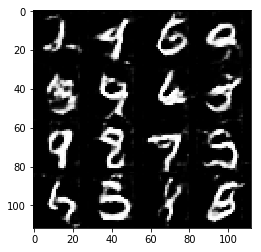

Epoch 2/3... Discriminator Loss: 0.9814... Generator Loss: 0.6682
Epoch 2/3... Discriminator Loss: 1.0961... Generator Loss: 1.2178
Epoch 2/3... Discriminator Loss: 0.9498... Generator Loss: 1.0494
Epoch 2/3... Discriminator Loss: 1.1472... Generator Loss: 0.6999
Epoch 2/3... Discriminator Loss: 1.1285... Generator Loss: 1.4431
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


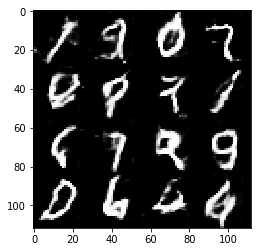

Epoch 2/3... Discriminator Loss: 0.9909... Generator Loss: 1.3022
Epoch 2/3... Discriminator Loss: 1.0108... Generator Loss: 1.5242
Epoch 2/3... Discriminator Loss: 1.2092... Generator Loss: 1.3774
Epoch 2/3... Discriminator Loss: 0.9368... Generator Loss: 0.7216
Epoch 2/3... Discriminator Loss: 0.9399... Generator Loss: 1.6458
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


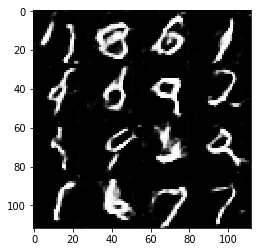

Epoch 2/3... Discriminator Loss: 1.2191... Generator Loss: 0.8973
Epoch 2/3... Discriminator Loss: 1.0320... Generator Loss: 1.8186
Epoch 2/3... Discriminator Loss: 1.0404... Generator Loss: 1.4769
Epoch 2/3... Discriminator Loss: 1.1072... Generator Loss: 1.1864
Epoch 2/3... Discriminator Loss: 1.0284... Generator Loss: 1.2390
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


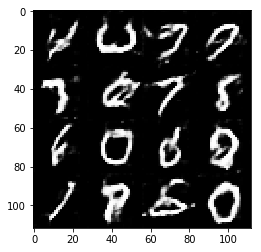

Epoch 2/3... Discriminator Loss: 1.1782... Generator Loss: 0.8580
Epoch 2/3... Discriminator Loss: 1.2201... Generator Loss: 1.2549
Epoch 2/3... Discriminator Loss: 1.1504... Generator Loss: 1.1427
Epoch 2/3... Discriminator Loss: 0.9881... Generator Loss: 0.8632
Epoch 2/3... Discriminator Loss: 1.1295... Generator Loss: 1.4734
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


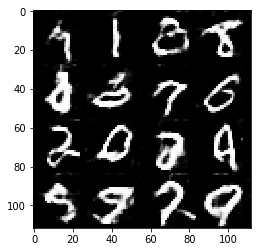

Epoch 2/3... Discriminator Loss: 1.1424... Generator Loss: 1.0377
Epoch 2/3... Discriminator Loss: 0.8737... Generator Loss: 1.4288
Epoch 2/3... Discriminator Loss: 1.4031... Generator Loss: 1.4238
Epoch 2/3... Discriminator Loss: 0.9855... Generator Loss: 1.6344
Epoch 2/3... Discriminator Loss: 0.9442... Generator Loss: 1.1833
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 1)


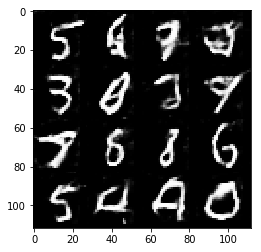

Epoch 2/3... Discriminator Loss: 1.1992... Generator Loss: 0.8808
Epoch 2/3... Discriminator Loss: 1.0211... Generator Loss: 1.9919
Epoch 2/3... Discriminator Loss: 0.8442... Generator Loss: 1.8451
CPU times: user 5min 45s, sys: 2min 25s, total: 8min 11s
Wall time: 7min 18s


In [14]:
%%time
batch_size = 32
z_dim = 128
learning_rate = 0.0002
beta1 = 0.4
alpha=0.2

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 3
# tf.reset_default_graph()
        
mnist_dataset = helper.Dataset('mnist', glob(os.path.join('./data', 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

finished loading images.
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)
Epoch 0/1... Discriminator Loss: 0.6815... Generator Loss: 2.0085
Epoch 0/1... Discriminator Loss: 0.5890... Generator Loss: 2.8472
Epoch 0/1... Discriminator Loss: 0.7106... Generator Loss: 2.3266
Epoch 0/1... Discriminator Loss: 0.5459... Generator Loss: 3.0766
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


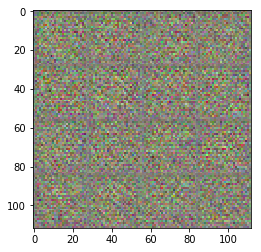

Epoch 0/1... Discriminator Loss: 0.6852... Generator Loss: 2.8499
Epoch 0/1... Discriminator Loss: 0.7265... Generator Loss: 2.1179
Epoch 0/1... Discriminator Loss: 0.6115... Generator Loss: 2.1283
Epoch 0/1... Discriminator Loss: 0.8771... Generator Loss: 3.5268
Epoch 0/1... Discriminator Loss: 0.6850... Generator Loss: 1.5931
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


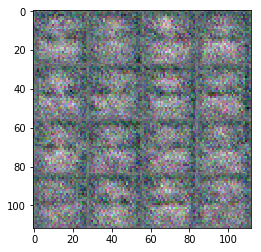

Epoch 0/1... Discriminator Loss: 0.7278... Generator Loss: 2.9666
Epoch 0/1... Discriminator Loss: 0.6735... Generator Loss: 3.4033
Epoch 0/1... Discriminator Loss: 0.6752... Generator Loss: 2.5705
Epoch 0/1... Discriminator Loss: 0.7527... Generator Loss: 2.5734
Epoch 0/1... Discriminator Loss: 0.6316... Generator Loss: 2.2422
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


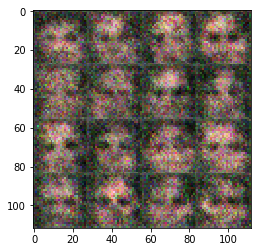

Epoch 0/1... Discriminator Loss: 0.5378... Generator Loss: 3.4033
Epoch 0/1... Discriminator Loss: 0.5234... Generator Loss: 2.7822
Epoch 0/1... Discriminator Loss: 0.5635... Generator Loss: 2.9090
Epoch 0/1... Discriminator Loss: 0.4551... Generator Loss: 3.3535
Epoch 0/1... Discriminator Loss: 0.4311... Generator Loss: 3.0577
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


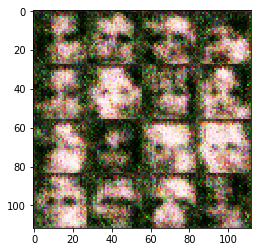

Epoch 0/1... Discriminator Loss: 0.5712... Generator Loss: 3.9950
Epoch 0/1... Discriminator Loss: 0.5266... Generator Loss: 3.5511
Epoch 0/1... Discriminator Loss: 0.5727... Generator Loss: 3.1165
Epoch 0/1... Discriminator Loss: 0.4977... Generator Loss: 4.1905
Epoch 0/1... Discriminator Loss: 0.4664... Generator Loss: 3.4841
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


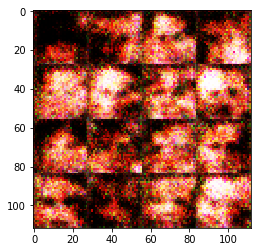

Epoch 0/1... Discriminator Loss: 0.5567... Generator Loss: 3.1001
Epoch 0/1... Discriminator Loss: 0.5894... Generator Loss: 2.7850
Epoch 0/1... Discriminator Loss: 0.5071... Generator Loss: 3.5093
Epoch 0/1... Discriminator Loss: 0.6145... Generator Loss: 2.6347
Epoch 0/1... Discriminator Loss: 0.4700... Generator Loss: 3.6695
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


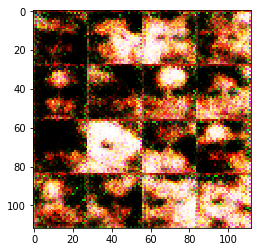

Epoch 0/1... Discriminator Loss: 0.4907... Generator Loss: 3.3985
Epoch 0/1... Discriminator Loss: 0.4649... Generator Loss: 4.0556
Epoch 0/1... Discriminator Loss: 0.4458... Generator Loss: 3.0670
Epoch 0/1... Discriminator Loss: 0.5297... Generator Loss: 3.9714
Epoch 0/1... Discriminator Loss: 0.5463... Generator Loss: 2.7495
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


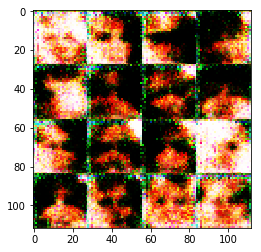

Epoch 0/1... Discriminator Loss: 0.4538... Generator Loss: 4.3200
Epoch 0/1... Discriminator Loss: 0.4673... Generator Loss: 4.0491
Epoch 0/1... Discriminator Loss: 0.4324... Generator Loss: 3.6173
Epoch 0/1... Discriminator Loss: 0.5381... Generator Loss: 3.5247
Epoch 0/1... Discriminator Loss: 0.4217... Generator Loss: 4.2010
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


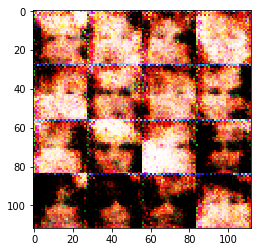

Epoch 0/1... Discriminator Loss: 0.4317... Generator Loss: 3.7193
Epoch 0/1... Discriminator Loss: 0.4298... Generator Loss: 3.1615
Epoch 0/1... Discriminator Loss: 0.4789... Generator Loss: 4.0861
Epoch 0/1... Discriminator Loss: 0.4078... Generator Loss: 3.3524
Epoch 0/1... Discriminator Loss: 0.5057... Generator Loss: 4.1496
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


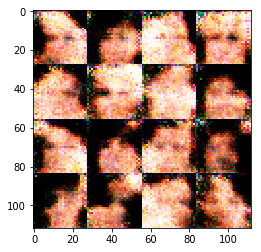

Epoch 0/1... Discriminator Loss: 0.5312... Generator Loss: 2.9171
Epoch 0/1... Discriminator Loss: 0.4432... Generator Loss: 4.2919
Epoch 0/1... Discriminator Loss: 0.6020... Generator Loss: 2.9127
Epoch 0/1... Discriminator Loss: 0.6087... Generator Loss: 3.2178
Epoch 0/1... Discriminator Loss: 0.5406... Generator Loss: 2.1657
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


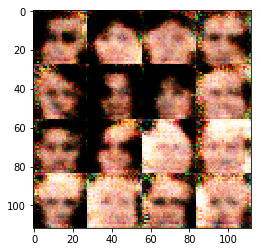

Epoch 0/1... Discriminator Loss: 0.4323... Generator Loss: 4.7882
Epoch 0/1... Discriminator Loss: 0.4550... Generator Loss: 3.5056
Epoch 0/1... Discriminator Loss: 0.5357... Generator Loss: 3.3538
Epoch 0/1... Discriminator Loss: 0.6662... Generator Loss: 2.6204
Epoch 0/1... Discriminator Loss: 0.4576... Generator Loss: 4.4487
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


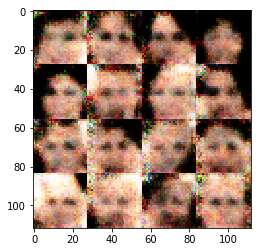

Epoch 0/1... Discriminator Loss: 0.4638... Generator Loss: 4.1656
Epoch 0/1... Discriminator Loss: 0.4392... Generator Loss: 4.8592
Epoch 0/1... Discriminator Loss: 0.4823... Generator Loss: 3.3887
Epoch 0/1... Discriminator Loss: 0.8700... Generator Loss: 6.2383
Epoch 0/1... Discriminator Loss: 0.6270... Generator Loss: 2.9059
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


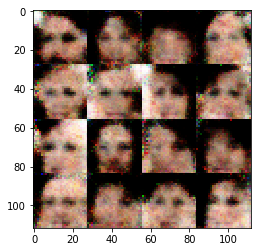

Epoch 0/1... Discriminator Loss: 0.8716... Generator Loss: 1.6804
Epoch 0/1... Discriminator Loss: 0.6874... Generator Loss: 3.3099
Epoch 0/1... Discriminator Loss: 0.5785... Generator Loss: 3.0133
Epoch 0/1... Discriminator Loss: 0.6373... Generator Loss: 2.0115
Epoch 0/1... Discriminator Loss: 0.5229... Generator Loss: 2.6926
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


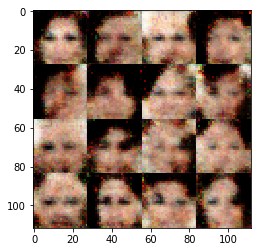

Epoch 0/1... Discriminator Loss: 0.5760... Generator Loss: 2.2434
Epoch 0/1... Discriminator Loss: 1.1213... Generator Loss: 0.8432
Epoch 0/1... Discriminator Loss: 0.6340... Generator Loss: 2.3066
Epoch 0/1... Discriminator Loss: 0.7840... Generator Loss: 3.9510
Epoch 0/1... Discriminator Loss: 0.4908... Generator Loss: 2.2978
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


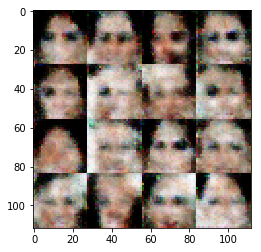

Epoch 0/1... Discriminator Loss: 0.7576... Generator Loss: 2.2431
Epoch 0/1... Discriminator Loss: 0.9314... Generator Loss: 1.2995
Epoch 0/1... Discriminator Loss: 0.7000... Generator Loss: 2.3172
Epoch 0/1... Discriminator Loss: 0.8032... Generator Loss: 3.3176
Epoch 0/1... Discriminator Loss: 0.8152... Generator Loss: 2.6015
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


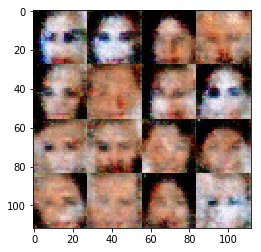

Epoch 0/1... Discriminator Loss: 0.7056... Generator Loss: 2.5287
Epoch 0/1... Discriminator Loss: 0.9475... Generator Loss: 3.5163
Epoch 0/1... Discriminator Loss: 0.6100... Generator Loss: 2.9063
Epoch 0/1... Discriminator Loss: 0.9132... Generator Loss: 2.5095
Epoch 0/1... Discriminator Loss: 0.9228... Generator Loss: 4.0440
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


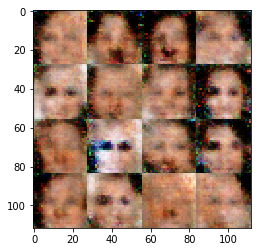

Epoch 0/1... Discriminator Loss: 0.8940... Generator Loss: 3.0313
Epoch 0/1... Discriminator Loss: 2.5714... Generator Loss: 0.7455
Epoch 0/1... Discriminator Loss: 0.8184... Generator Loss: 2.1633
Epoch 0/1... Discriminator Loss: 0.7638... Generator Loss: 1.3401
Epoch 0/1... Discriminator Loss: 0.9197... Generator Loss: 2.1797
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


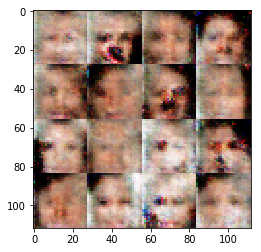

Epoch 0/1... Discriminator Loss: 0.5639... Generator Loss: 2.8208
Epoch 0/1... Discriminator Loss: 0.8700... Generator Loss: 2.6070
Epoch 0/1... Discriminator Loss: 0.9224... Generator Loss: 1.8864
Epoch 0/1... Discriminator Loss: 0.9951... Generator Loss: 1.3101
Epoch 0/1... Discriminator Loss: 0.7390... Generator Loss: 2.7337
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


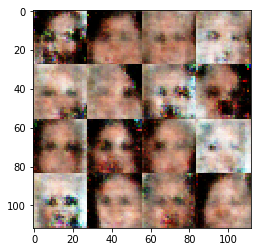

Epoch 0/1... Discriminator Loss: 0.8160... Generator Loss: 1.7757
Epoch 0/1... Discriminator Loss: 1.0029... Generator Loss: 1.4152
Epoch 0/1... Discriminator Loss: 0.8490... Generator Loss: 1.5575
Epoch 0/1... Discriminator Loss: 1.2017... Generator Loss: 2.5817
Epoch 0/1... Discriminator Loss: 0.8496... Generator Loss: 1.2013
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


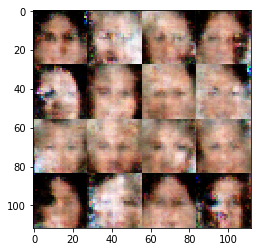

Epoch 0/1... Discriminator Loss: 1.0442... Generator Loss: 1.6388
Epoch 0/1... Discriminator Loss: 1.0923... Generator Loss: 1.0858
Epoch 0/1... Discriminator Loss: 0.7561... Generator Loss: 2.0707
Epoch 0/1... Discriminator Loss: 0.8055... Generator Loss: 2.0096
Epoch 0/1... Discriminator Loss: 0.9650... Generator Loss: 1.7541
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


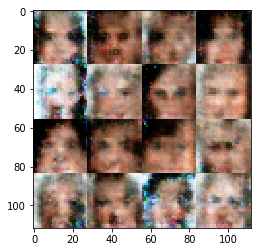

Epoch 0/1... Discriminator Loss: 1.3827... Generator Loss: 0.9030
Epoch 0/1... Discriminator Loss: 1.3127... Generator Loss: 1.4525
Epoch 0/1... Discriminator Loss: 0.7500... Generator Loss: 1.8135
Epoch 0/1... Discriminator Loss: 0.8241... Generator Loss: 1.6128
Epoch 0/1... Discriminator Loss: 0.8897... Generator Loss: 1.4824
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


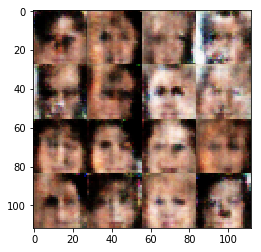

Epoch 0/1... Discriminator Loss: 0.9417... Generator Loss: 1.5893
Epoch 0/1... Discriminator Loss: 0.9308... Generator Loss: 1.1757
Epoch 0/1... Discriminator Loss: 0.7903... Generator Loss: 2.0519
Epoch 0/1... Discriminator Loss: 0.7247... Generator Loss: 1.7578
Epoch 0/1... Discriminator Loss: 1.0099... Generator Loss: 0.9190
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


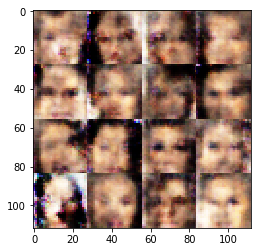

Epoch 0/1... Discriminator Loss: 1.0690... Generator Loss: 2.0155
Epoch 0/1... Discriminator Loss: 1.0424... Generator Loss: 1.2978
Epoch 0/1... Discriminator Loss: 1.2040... Generator Loss: 1.4926
Epoch 0/1... Discriminator Loss: 1.0206... Generator Loss: 2.0991
Epoch 0/1... Discriminator Loss: 1.2040... Generator Loss: 1.7076
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


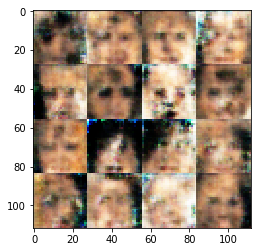

Epoch 0/1... Discriminator Loss: 0.7595... Generator Loss: 2.4403
Epoch 0/1... Discriminator Loss: 1.1823... Generator Loss: 1.3894
Epoch 0/1... Discriminator Loss: 0.9340... Generator Loss: 1.8937
Epoch 0/1... Discriminator Loss: 1.2910... Generator Loss: 1.8269
Epoch 0/1... Discriminator Loss: 1.1299... Generator Loss: 1.2417
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


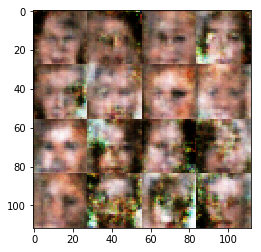

Epoch 0/1... Discriminator Loss: 1.3740... Generator Loss: 1.0829
Epoch 0/1... Discriminator Loss: 1.0354... Generator Loss: 1.3080
Epoch 0/1... Discriminator Loss: 1.1596... Generator Loss: 1.4963
Epoch 0/1... Discriminator Loss: 1.1451... Generator Loss: 1.2115
Epoch 0/1... Discriminator Loss: 1.0729... Generator Loss: 1.8691
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


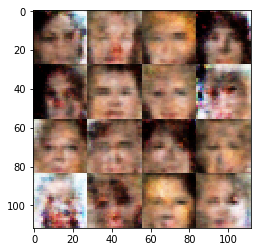

Epoch 0/1... Discriminator Loss: 1.0202... Generator Loss: 1.4916
Epoch 0/1... Discriminator Loss: 0.7677... Generator Loss: 1.3631
Epoch 0/1... Discriminator Loss: 1.0962... Generator Loss: 1.4310
Epoch 0/1... Discriminator Loss: 1.0945... Generator Loss: 0.8477
Epoch 0/1... Discriminator Loss: 1.3115... Generator Loss: 0.8771
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


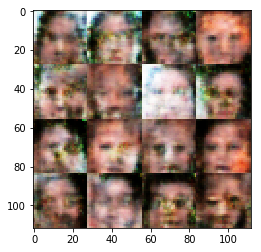

Epoch 0/1... Discriminator Loss: 0.9608... Generator Loss: 1.6526
Epoch 0/1... Discriminator Loss: 1.0748... Generator Loss: 1.3793
Epoch 0/1... Discriminator Loss: 1.1946... Generator Loss: 1.1435
Epoch 0/1... Discriminator Loss: 1.0178... Generator Loss: 1.8523
Epoch 0/1... Discriminator Loss: 0.9756... Generator Loss: 1.2773
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


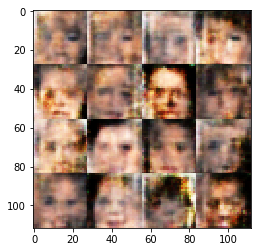

Epoch 0/1... Discriminator Loss: 1.2943... Generator Loss: 0.9057
Epoch 0/1... Discriminator Loss: 1.2573... Generator Loss: 1.5166
Epoch 0/1... Discriminator Loss: 1.0331... Generator Loss: 1.4902
Epoch 0/1... Discriminator Loss: 1.1005... Generator Loss: 1.6020
Epoch 0/1... Discriminator Loss: 1.0467... Generator Loss: 1.8657
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


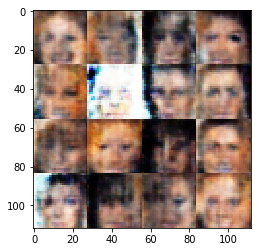

Epoch 0/1... Discriminator Loss: 1.3579... Generator Loss: 1.8567
Epoch 0/1... Discriminator Loss: 1.2803... Generator Loss: 1.4399
Epoch 0/1... Discriminator Loss: 1.4979... Generator Loss: 1.3736
Epoch 0/1... Discriminator Loss: 1.0816... Generator Loss: 0.9238
Epoch 0/1... Discriminator Loss: 0.8466... Generator Loss: 1.4775
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


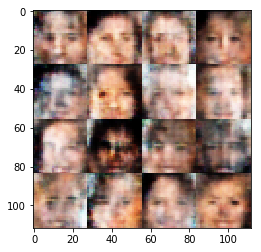

Epoch 0/1... Discriminator Loss: 1.2589... Generator Loss: 1.3688
Epoch 0/1... Discriminator Loss: 1.1863... Generator Loss: 1.3045
Epoch 0/1... Discriminator Loss: 1.2415... Generator Loss: 1.4892
Epoch 0/1... Discriminator Loss: 1.3347... Generator Loss: 1.2887
Epoch 0/1... Discriminator Loss: 1.1874... Generator Loss: 1.6794
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


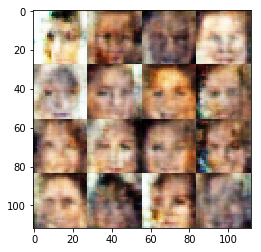

Epoch 0/1... Discriminator Loss: 1.0050... Generator Loss: 1.5110
Epoch 0/1... Discriminator Loss: 1.3611... Generator Loss: 1.0469
Epoch 0/1... Discriminator Loss: 0.9167... Generator Loss: 1.7347
Epoch 0/1... Discriminator Loss: 1.3519... Generator Loss: 0.9388
Epoch 0/1... Discriminator Loss: 1.3667... Generator Loss: 0.9109
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


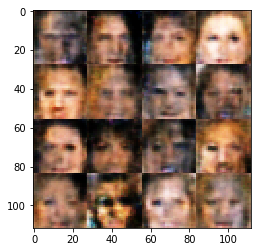

Epoch 0/1... Discriminator Loss: 1.3042... Generator Loss: 1.2643
Epoch 0/1... Discriminator Loss: 1.3915... Generator Loss: 1.3750
Epoch 0/1... Discriminator Loss: 1.1454... Generator Loss: 1.2358
Epoch 0/1... Discriminator Loss: 1.4355... Generator Loss: 1.2337
Epoch 0/1... Discriminator Loss: 1.1792... Generator Loss: 1.1288
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


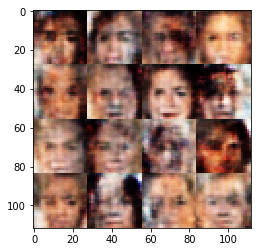

Epoch 0/1... Discriminator Loss: 0.9791... Generator Loss: 1.4844
Epoch 0/1... Discriminator Loss: 1.4442... Generator Loss: 1.3547
Epoch 0/1... Discriminator Loss: 1.0689... Generator Loss: 1.4212
Epoch 0/1... Discriminator Loss: 1.0185... Generator Loss: 1.1881
Epoch 0/1... Discriminator Loss: 1.2238... Generator Loss: 0.9069
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


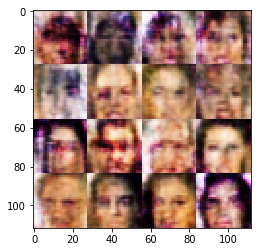

Epoch 0/1... Discriminator Loss: 1.3891... Generator Loss: 1.3412
Epoch 0/1... Discriminator Loss: 1.4148... Generator Loss: 1.3644
Epoch 0/1... Discriminator Loss: 1.1002... Generator Loss: 1.5311
Epoch 0/1... Discriminator Loss: 1.3081... Generator Loss: 1.1528
Epoch 0/1... Discriminator Loss: 1.1246... Generator Loss: 1.3066
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


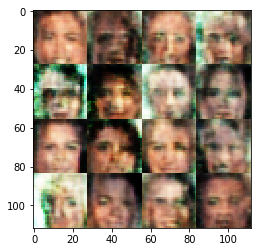

Epoch 0/1... Discriminator Loss: 1.0933... Generator Loss: 1.2521
Epoch 0/1... Discriminator Loss: 1.0601... Generator Loss: 0.9844
Epoch 0/1... Discriminator Loss: 1.3923... Generator Loss: 1.0546
Epoch 0/1... Discriminator Loss: 1.1267... Generator Loss: 1.6055
Epoch 0/1... Discriminator Loss: 1.2066... Generator Loss: 1.2825
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


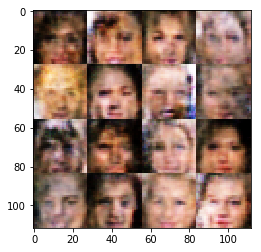

Epoch 0/1... Discriminator Loss: 1.2124... Generator Loss: 1.1216
Epoch 0/1... Discriminator Loss: 1.1897... Generator Loss: 1.4227
Epoch 0/1... Discriminator Loss: 1.1962... Generator Loss: 0.8271
Epoch 0/1... Discriminator Loss: 1.2090... Generator Loss: 1.0142
Epoch 0/1... Discriminator Loss: 1.2569... Generator Loss: 0.9863
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


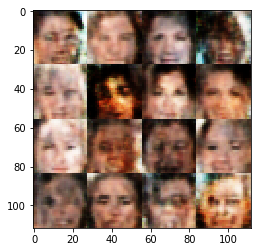

Epoch 0/1... Discriminator Loss: 1.3923... Generator Loss: 1.0023
Epoch 0/1... Discriminator Loss: 1.0277... Generator Loss: 1.4655
Epoch 0/1... Discriminator Loss: 1.3518... Generator Loss: 1.0653
Epoch 0/1... Discriminator Loss: 1.3102... Generator Loss: 1.4399
Epoch 0/1... Discriminator Loss: 1.2759... Generator Loss: 0.8856
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


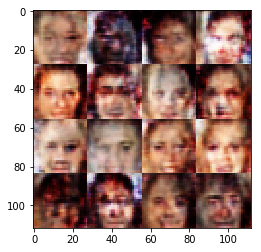

Epoch 0/1... Discriminator Loss: 1.0155... Generator Loss: 1.5659
Epoch 0/1... Discriminator Loss: 1.3139... Generator Loss: 0.9910
Epoch 0/1... Discriminator Loss: 1.2301... Generator Loss: 1.0209
Epoch 0/1... Discriminator Loss: 1.4094... Generator Loss: 0.8940
Epoch 0/1... Discriminator Loss: 1.4975... Generator Loss: 2.2925
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


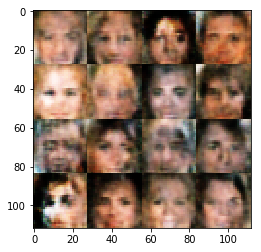

Epoch 0/1... Discriminator Loss: 1.2108... Generator Loss: 0.6713
Epoch 0/1... Discriminator Loss: 1.2900... Generator Loss: 1.2408
Epoch 0/1... Discriminator Loss: 1.3226... Generator Loss: 1.1547
Epoch 0/1... Discriminator Loss: 0.9605... Generator Loss: 1.3412
Epoch 0/1... Discriminator Loss: 1.4834... Generator Loss: 1.2198
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


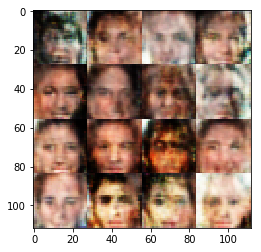

Epoch 0/1... Discriminator Loss: 1.3037... Generator Loss: 1.5717
Epoch 0/1... Discriminator Loss: 1.4645... Generator Loss: 1.5149
Epoch 0/1... Discriminator Loss: 1.6049... Generator Loss: 0.8047
Epoch 0/1... Discriminator Loss: 1.2026... Generator Loss: 1.3250
Epoch 0/1... Discriminator Loss: 1.2616... Generator Loss: 0.9974
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


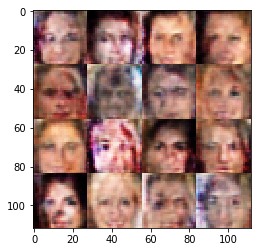

Epoch 0/1... Discriminator Loss: 1.2096... Generator Loss: 0.8067
Epoch 0/1... Discriminator Loss: 1.3702... Generator Loss: 0.7629
Epoch 0/1... Discriminator Loss: 1.0749... Generator Loss: 0.7571
Epoch 0/1... Discriminator Loss: 1.2804... Generator Loss: 1.2737
Epoch 0/1... Discriminator Loss: 1.2201... Generator Loss: 0.9605
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


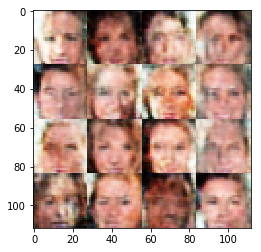

Epoch 0/1... Discriminator Loss: 1.2753... Generator Loss: 1.2055
Epoch 0/1... Discriminator Loss: 1.1355... Generator Loss: 1.0202
Epoch 0/1... Discriminator Loss: 1.4519... Generator Loss: 1.1035
Epoch 0/1... Discriminator Loss: 1.0981... Generator Loss: 1.1969
Epoch 0/1... Discriminator Loss: 0.9626... Generator Loss: 1.2607
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


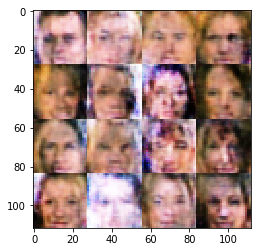

Epoch 0/1... Discriminator Loss: 1.0624... Generator Loss: 1.3040
Epoch 0/1... Discriminator Loss: 1.4473... Generator Loss: 1.0143
Epoch 0/1... Discriminator Loss: 1.0494... Generator Loss: 1.5150
Epoch 0/1... Discriminator Loss: 1.1778... Generator Loss: 0.8696
Epoch 0/1... Discriminator Loss: 1.2152... Generator Loss: 1.2632
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


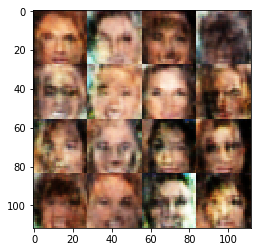

Epoch 0/1... Discriminator Loss: 1.1761... Generator Loss: 1.2073
Epoch 0/1... Discriminator Loss: 1.1339... Generator Loss: 1.0331
Epoch 0/1... Discriminator Loss: 1.3660... Generator Loss: 0.9924
Epoch 0/1... Discriminator Loss: 1.3334... Generator Loss: 0.9487
Epoch 0/1... Discriminator Loss: 1.2844... Generator Loss: 0.9667
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


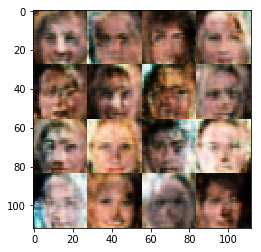

Epoch 0/1... Discriminator Loss: 1.2409... Generator Loss: 0.9609
Epoch 0/1... Discriminator Loss: 1.0636... Generator Loss: 1.4905
Epoch 0/1... Discriminator Loss: 1.2288... Generator Loss: 1.3778
Epoch 0/1... Discriminator Loss: 1.2349... Generator Loss: 1.2406
Epoch 0/1... Discriminator Loss: 1.3724... Generator Loss: 1.0071
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


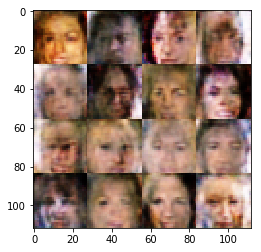

Epoch 0/1... Discriminator Loss: 1.5068... Generator Loss: 0.8289
Epoch 0/1... Discriminator Loss: 1.1151... Generator Loss: 1.1738
Epoch 0/1... Discriminator Loss: 1.4991... Generator Loss: 1.1067
Epoch 0/1... Discriminator Loss: 1.1800... Generator Loss: 0.9034
Epoch 0/1... Discriminator Loss: 1.1085... Generator Loss: 1.2614
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


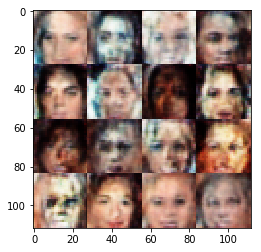

Epoch 0/1... Discriminator Loss: 1.1899... Generator Loss: 1.5397
Epoch 0/1... Discriminator Loss: 1.3404... Generator Loss: 1.0063
Epoch 0/1... Discriminator Loss: 1.2255... Generator Loss: 0.9829
Epoch 0/1... Discriminator Loss: 1.8388... Generator Loss: 1.0168
Epoch 0/1... Discriminator Loss: 0.9874... Generator Loss: 1.1370
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


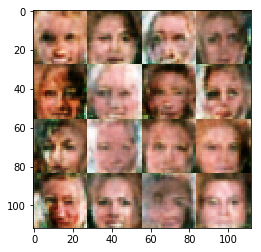

Epoch 0/1... Discriminator Loss: 1.3275... Generator Loss: 1.0872
Epoch 0/1... Discriminator Loss: 1.3144... Generator Loss: 0.9840
Epoch 0/1... Discriminator Loss: 1.2576... Generator Loss: 1.1045
Epoch 0/1... Discriminator Loss: 1.1126... Generator Loss: 1.0426
Epoch 0/1... Discriminator Loss: 0.9951... Generator Loss: 1.0233
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


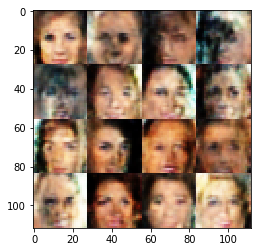

Epoch 0/1... Discriminator Loss: 0.9440... Generator Loss: 1.1151
Epoch 0/1... Discriminator Loss: 1.2240... Generator Loss: 1.1490
Epoch 0/1... Discriminator Loss: 1.4150... Generator Loss: 0.9642
Epoch 0/1... Discriminator Loss: 1.5955... Generator Loss: 1.3250
Epoch 0/1... Discriminator Loss: 1.2221... Generator Loss: 0.7754
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


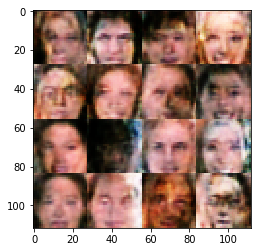

Epoch 0/1... Discriminator Loss: 1.5298... Generator Loss: 0.7422
Epoch 0/1... Discriminator Loss: 1.1464... Generator Loss: 1.3632
Epoch 0/1... Discriminator Loss: 1.3586... Generator Loss: 0.9551
Epoch 0/1... Discriminator Loss: 1.1930... Generator Loss: 1.0040
Epoch 0/1... Discriminator Loss: 1.2769... Generator Loss: 0.9592
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


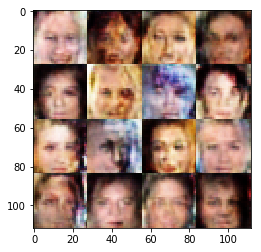

Epoch 0/1... Discriminator Loss: 1.3683... Generator Loss: 0.8174
Epoch 0/1... Discriminator Loss: 1.2499... Generator Loss: 0.7460
Epoch 0/1... Discriminator Loss: 1.1405... Generator Loss: 1.1667
Epoch 0/1... Discriminator Loss: 1.0821... Generator Loss: 1.1995
Epoch 0/1... Discriminator Loss: 1.4727... Generator Loss: 1.0353
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


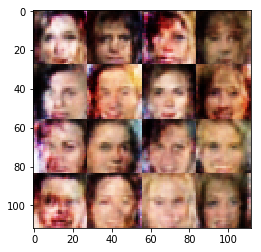

Epoch 0/1... Discriminator Loss: 1.3528... Generator Loss: 1.1715
Epoch 0/1... Discriminator Loss: 1.4067... Generator Loss: 0.9432
Epoch 0/1... Discriminator Loss: 1.3011... Generator Loss: 1.1110
Epoch 0/1... Discriminator Loss: 1.1029... Generator Loss: 1.1462
Epoch 0/1... Discriminator Loss: 1.4268... Generator Loss: 1.1208
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


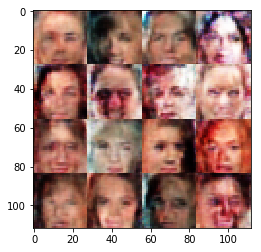

Epoch 0/1... Discriminator Loss: 1.2302... Generator Loss: 1.1730
Epoch 0/1... Discriminator Loss: 1.4195... Generator Loss: 0.7922
Epoch 0/1... Discriminator Loss: 1.4332... Generator Loss: 1.0205
Epoch 0/1... Discriminator Loss: 1.3832... Generator Loss: 1.4346
Epoch 0/1... Discriminator Loss: 1.1778... Generator Loss: 1.2927
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


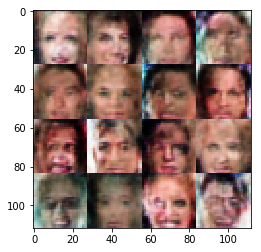

Epoch 0/1... Discriminator Loss: 1.3548... Generator Loss: 0.9182
Epoch 0/1... Discriminator Loss: 1.3104... Generator Loss: 1.2747
Epoch 0/1... Discriminator Loss: 1.2211... Generator Loss: 1.0448
Epoch 0/1... Discriminator Loss: 1.1344... Generator Loss: 1.0126
Epoch 0/1... Discriminator Loss: 1.4597... Generator Loss: 1.1006
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


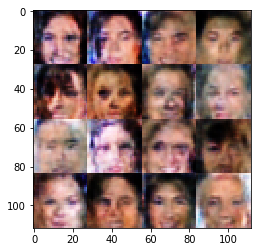

Epoch 0/1... Discriminator Loss: 1.6858... Generator Loss: 1.2610
Epoch 0/1... Discriminator Loss: 1.2443... Generator Loss: 1.3298
Epoch 0/1... Discriminator Loss: 1.1967... Generator Loss: 0.8883
Epoch 0/1... Discriminator Loss: 1.1866... Generator Loss: 0.9016
Epoch 0/1... Discriminator Loss: 1.2617... Generator Loss: 1.1316
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


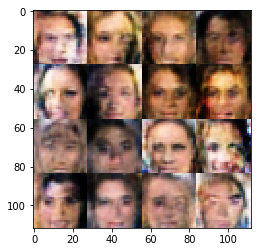

Epoch 0/1... Discriminator Loss: 1.0909... Generator Loss: 0.9679
Epoch 0/1... Discriminator Loss: 1.1485... Generator Loss: 1.0830
Epoch 0/1... Discriminator Loss: 1.4455... Generator Loss: 0.8574
Epoch 0/1... Discriminator Loss: 1.1783... Generator Loss: 1.0869
Epoch 0/1... Discriminator Loss: 1.1502... Generator Loss: 0.8150
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


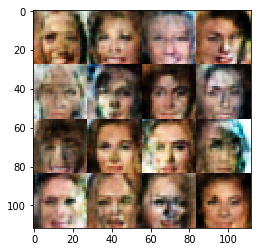

Epoch 0/1... Discriminator Loss: 1.1789... Generator Loss: 0.8425
Epoch 0/1... Discriminator Loss: 1.1337... Generator Loss: 1.0324
Epoch 0/1... Discriminator Loss: 1.2701... Generator Loss: 1.0823
Epoch 0/1... Discriminator Loss: 1.0128... Generator Loss: 1.0650
Epoch 0/1... Discriminator Loss: 1.1826... Generator Loss: 1.0725
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


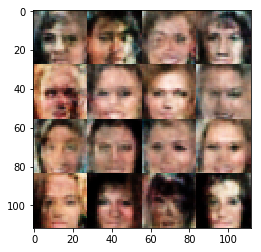

Epoch 0/1... Discriminator Loss: 1.1778... Generator Loss: 1.3480
Epoch 0/1... Discriminator Loss: 1.0737... Generator Loss: 1.1121
Epoch 0/1... Discriminator Loss: 1.1892... Generator Loss: 1.0785
Epoch 0/1... Discriminator Loss: 1.2937... Generator Loss: 1.1338
Epoch 0/1... Discriminator Loss: 1.4284... Generator Loss: 1.0411
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


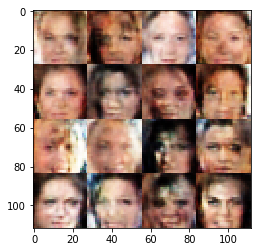

Epoch 0/1... Discriminator Loss: 1.0626... Generator Loss: 1.0608
Epoch 0/1... Discriminator Loss: 1.1637... Generator Loss: 1.1921
Epoch 0/1... Discriminator Loss: 1.4441... Generator Loss: 1.0761
Epoch 0/1... Discriminator Loss: 1.4211... Generator Loss: 1.0489
Epoch 0/1... Discriminator Loss: 1.3763... Generator Loss: 0.7995
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


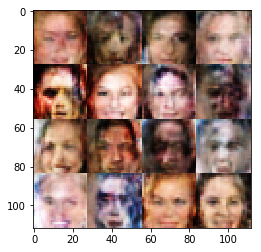

Epoch 0/1... Discriminator Loss: 1.3099... Generator Loss: 0.9448
Epoch 0/1... Discriminator Loss: 1.3953... Generator Loss: 1.1553
Epoch 0/1... Discriminator Loss: 1.4298... Generator Loss: 1.0414
Epoch 0/1... Discriminator Loss: 1.3400... Generator Loss: 1.0374
Epoch 0/1... Discriminator Loss: 1.3842... Generator Loss: 0.9695
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


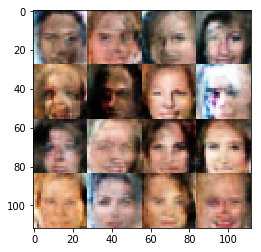

Epoch 0/1... Discriminator Loss: 1.1771... Generator Loss: 1.2074
Epoch 0/1... Discriminator Loss: 1.2486... Generator Loss: 0.8615
Epoch 0/1... Discriminator Loss: 1.2586... Generator Loss: 1.3611
Epoch 0/1... Discriminator Loss: 1.3740... Generator Loss: 1.0615
Epoch 0/1... Discriminator Loss: 1.4432... Generator Loss: 0.7972
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


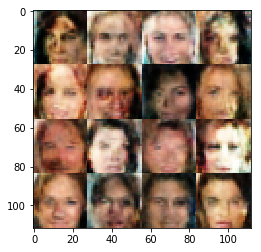

Epoch 0/1... Discriminator Loss: 1.3307... Generator Loss: 1.1126
Epoch 0/1... Discriminator Loss: 1.2001... Generator Loss: 1.0970
Epoch 0/1... Discriminator Loss: 1.1284... Generator Loss: 1.4981
Epoch 0/1... Discriminator Loss: 1.2776... Generator Loss: 1.0181
Epoch 0/1... Discriminator Loss: 1.1654... Generator Loss: 1.1370
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


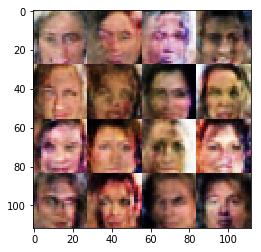

Epoch 0/1... Discriminator Loss: 1.3404... Generator Loss: 0.9094
Epoch 0/1... Discriminator Loss: 1.0339... Generator Loss: 1.1897
Epoch 0/1... Discriminator Loss: 1.3422... Generator Loss: 1.0976
Epoch 0/1... Discriminator Loss: 1.1760... Generator Loss: 0.9981
Epoch 0/1... Discriminator Loss: 1.2583... Generator Loss: 0.8079
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


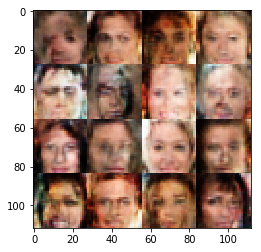

Epoch 0/1... Discriminator Loss: 1.5146... Generator Loss: 1.1559
Epoch 0/1... Discriminator Loss: 1.1880... Generator Loss: 0.7946
Epoch 0/1... Discriminator Loss: 1.0592... Generator Loss: 1.0095
Epoch 0/1... Discriminator Loss: 1.2563... Generator Loss: 1.1381
Epoch 0/1... Discriminator Loss: 1.1915... Generator Loss: 0.9813
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


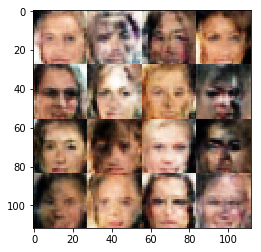

Epoch 0/1... Discriminator Loss: 1.2367... Generator Loss: 1.3745
Epoch 0/1... Discriminator Loss: 1.2081... Generator Loss: 0.8815
Epoch 0/1... Discriminator Loss: 1.1674... Generator Loss: 0.9364
Epoch 0/1... Discriminator Loss: 1.3411... Generator Loss: 1.2276
Epoch 0/1... Discriminator Loss: 1.2657... Generator Loss: 1.0186
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


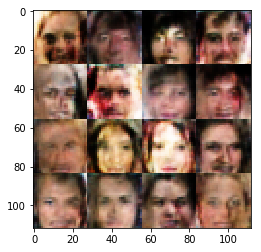

Epoch 0/1... Discriminator Loss: 1.3228... Generator Loss: 0.9766
Epoch 0/1... Discriminator Loss: 1.1325... Generator Loss: 0.9837
Epoch 0/1... Discriminator Loss: 1.0879... Generator Loss: 1.2968
Epoch 0/1... Discriminator Loss: 1.3458... Generator Loss: 1.5023
Epoch 0/1... Discriminator Loss: 1.5907... Generator Loss: 0.9923
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


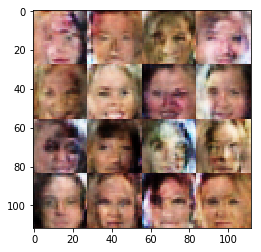

Epoch 0/1... Discriminator Loss: 1.2374... Generator Loss: 1.1196
Epoch 0/1... Discriminator Loss: 1.1567... Generator Loss: 0.9239
Epoch 0/1... Discriminator Loss: 1.4721... Generator Loss: 1.2339
Epoch 0/1... Discriminator Loss: 1.2305... Generator Loss: 0.8873
Epoch 0/1... Discriminator Loss: 1.2047... Generator Loss: 0.8994
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


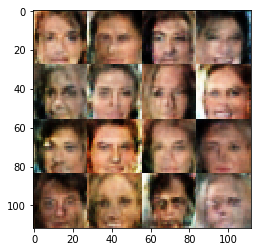

Epoch 0/1... Discriminator Loss: 1.2307... Generator Loss: 1.1225
Epoch 0/1... Discriminator Loss: 1.0986... Generator Loss: 0.9273
Epoch 0/1... Discriminator Loss: 1.3005... Generator Loss: 1.0640
Epoch 0/1... Discriminator Loss: 1.1140... Generator Loss: 1.1245
Epoch 0/1... Discriminator Loss: 1.2342... Generator Loss: 1.0801
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


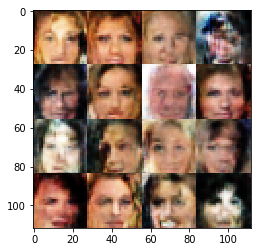

Epoch 0/1... Discriminator Loss: 1.1800... Generator Loss: 0.6653
Epoch 0/1... Discriminator Loss: 1.4889... Generator Loss: 0.8162
Epoch 0/1... Discriminator Loss: 1.1738... Generator Loss: 1.0534
Epoch 0/1... Discriminator Loss: 1.2353... Generator Loss: 0.9864
Epoch 0/1... Discriminator Loss: 1.3218... Generator Loss: 0.9553
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


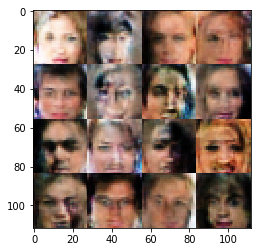

Epoch 0/1... Discriminator Loss: 1.0351... Generator Loss: 1.1106
Epoch 0/1... Discriminator Loss: 1.2265... Generator Loss: 1.2426
Epoch 0/1... Discriminator Loss: 1.3038... Generator Loss: 1.0484
Epoch 0/1... Discriminator Loss: 1.1980... Generator Loss: 0.8625
Epoch 0/1... Discriminator Loss: 1.1759... Generator Loss: 1.1843
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


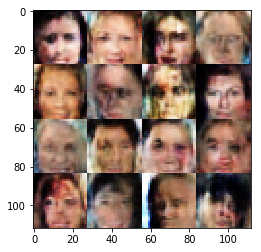

Epoch 0/1... Discriminator Loss: 1.2955... Generator Loss: 1.1884
Epoch 0/1... Discriminator Loss: 1.2827... Generator Loss: 1.1693
Epoch 0/1... Discriminator Loss: 1.2834... Generator Loss: 0.8031
Epoch 0/1... Discriminator Loss: 1.1987... Generator Loss: 1.0429
Epoch 0/1... Discriminator Loss: 1.0469... Generator Loss: 1.1397
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


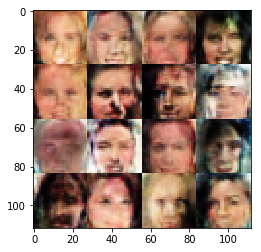

Epoch 0/1... Discriminator Loss: 1.1668... Generator Loss: 1.2557
Epoch 0/1... Discriminator Loss: 1.3952... Generator Loss: 0.6664
Epoch 0/1... Discriminator Loss: 1.3432... Generator Loss: 0.9204
Epoch 0/1... Discriminator Loss: 1.3772... Generator Loss: 0.8005
Epoch 0/1... Discriminator Loss: 1.0634... Generator Loss: 0.8732
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


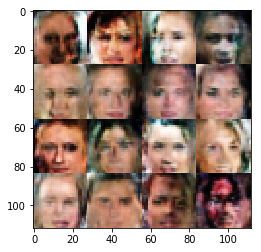

Epoch 0/1... Discriminator Loss: 1.0317... Generator Loss: 0.9285
Epoch 0/1... Discriminator Loss: 1.0773... Generator Loss: 1.1012
Epoch 0/1... Discriminator Loss: 1.1476... Generator Loss: 1.0113
Epoch 0/1... Discriminator Loss: 1.1302... Generator Loss: 0.9321
Epoch 0/1... Discriminator Loss: 1.1877... Generator Loss: 0.8976
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


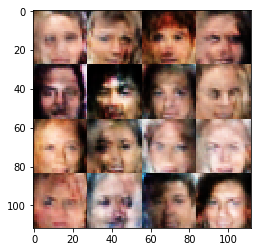

Epoch 0/1... Discriminator Loss: 1.2917... Generator Loss: 1.2263
Epoch 0/1... Discriminator Loss: 1.1894... Generator Loss: 1.4710
Epoch 0/1... Discriminator Loss: 1.1466... Generator Loss: 0.9205
Epoch 0/1... Discriminator Loss: 1.2751... Generator Loss: 0.9959
Epoch 0/1... Discriminator Loss: 1.3963... Generator Loss: 0.9276
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


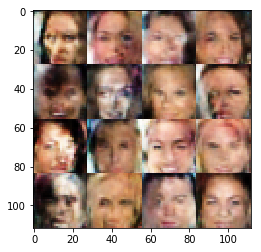

Epoch 0/1... Discriminator Loss: 1.3265... Generator Loss: 1.1127
Epoch 0/1... Discriminator Loss: 1.2073... Generator Loss: 0.9336
Epoch 0/1... Discriminator Loss: 1.1512... Generator Loss: 0.9472
Epoch 0/1... Discriminator Loss: 1.2928... Generator Loss: 0.6226
Epoch 0/1... Discriminator Loss: 1.4833... Generator Loss: 1.0627
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


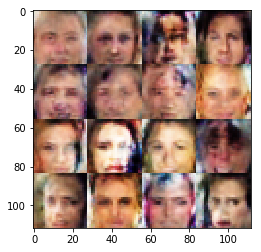

Epoch 0/1... Discriminator Loss: 1.3478... Generator Loss: 1.1318
Epoch 0/1... Discriminator Loss: 1.2261... Generator Loss: 0.9690
Epoch 0/1... Discriminator Loss: 1.2052... Generator Loss: 0.9238
Epoch 0/1... Discriminator Loss: 1.3818... Generator Loss: 0.8705
Epoch 0/1... Discriminator Loss: 1.2803... Generator Loss: 0.8750
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


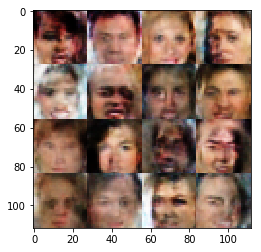

Epoch 0/1... Discriminator Loss: 1.1363... Generator Loss: 1.1444
Epoch 0/1... Discriminator Loss: 0.9293... Generator Loss: 1.1318
Epoch 0/1... Discriminator Loss: 1.2554... Generator Loss: 1.2088
Epoch 0/1... Discriminator Loss: 1.1307... Generator Loss: 1.1882
Epoch 0/1... Discriminator Loss: 1.6248... Generator Loss: 0.9211
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


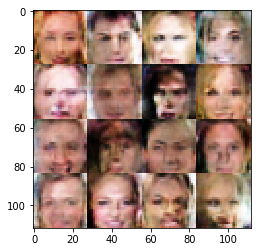

Epoch 0/1... Discriminator Loss: 1.6607... Generator Loss: 0.9353
Epoch 0/1... Discriminator Loss: 1.2384... Generator Loss: 1.0037
Epoch 0/1... Discriminator Loss: 1.3253... Generator Loss: 0.8822
Epoch 0/1... Discriminator Loss: 1.1386... Generator Loss: 1.1063
Epoch 0/1... Discriminator Loss: 1.2968... Generator Loss: 0.8885
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


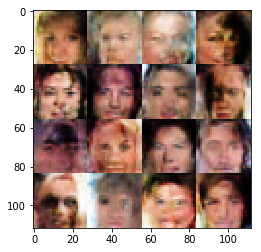

Epoch 0/1... Discriminator Loss: 1.0396... Generator Loss: 1.1486
Epoch 0/1... Discriminator Loss: 1.1491... Generator Loss: 0.8922
Epoch 0/1... Discriminator Loss: 1.2489... Generator Loss: 0.9279
Epoch 0/1... Discriminator Loss: 1.0332... Generator Loss: 1.2019
Epoch 0/1... Discriminator Loss: 1.2121... Generator Loss: 0.9843
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


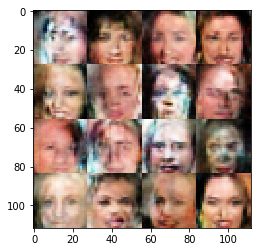

Epoch 0/1... Discriminator Loss: 1.3365... Generator Loss: 0.7358
Epoch 0/1... Discriminator Loss: 1.2545... Generator Loss: 1.1887
Epoch 0/1... Discriminator Loss: 1.0862... Generator Loss: 1.0041
Epoch 0/1... Discriminator Loss: 1.1520... Generator Loss: 1.1345
Epoch 0/1... Discriminator Loss: 1.2541... Generator Loss: 0.8602
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


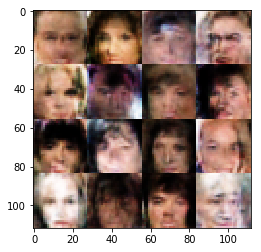

Epoch 0/1... Discriminator Loss: 1.3638... Generator Loss: 0.9944
Epoch 0/1... Discriminator Loss: 1.2953... Generator Loss: 1.0925
Epoch 0/1... Discriminator Loss: 1.4734... Generator Loss: 1.2425
Epoch 0/1... Discriminator Loss: 1.3106... Generator Loss: 1.1081
Epoch 0/1... Discriminator Loss: 0.9249... Generator Loss: 1.3153
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


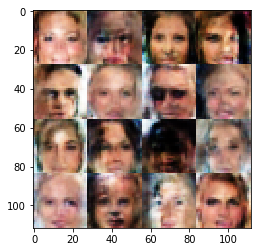

Epoch 0/1... Discriminator Loss: 0.9478... Generator Loss: 1.0092
Epoch 0/1... Discriminator Loss: 1.2807... Generator Loss: 1.0817
Epoch 0/1... Discriminator Loss: 1.2357... Generator Loss: 0.7356
Epoch 0/1... Discriminator Loss: 1.1494... Generator Loss: 1.3418
Epoch 0/1... Discriminator Loss: 1.1932... Generator Loss: 0.7732
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


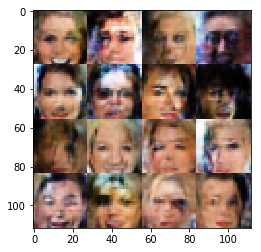

Epoch 0/1... Discriminator Loss: 1.0489... Generator Loss: 0.7925
Epoch 0/1... Discriminator Loss: 1.1477... Generator Loss: 1.1028
Epoch 0/1... Discriminator Loss: 1.1735... Generator Loss: 1.0889
Epoch 0/1... Discriminator Loss: 1.3324... Generator Loss: 1.1400
Epoch 0/1... Discriminator Loss: 1.3645... Generator Loss: 0.9093
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


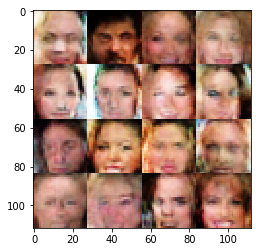

Epoch 0/1... Discriminator Loss: 1.2114... Generator Loss: 1.0435
Epoch 0/1... Discriminator Loss: 1.3090... Generator Loss: 1.1513
Epoch 0/1... Discriminator Loss: 1.3546... Generator Loss: 1.0934
Epoch 0/1... Discriminator Loss: 1.0351... Generator Loss: 1.1412
Epoch 0/1... Discriminator Loss: 1.2034... Generator Loss: 1.0935
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


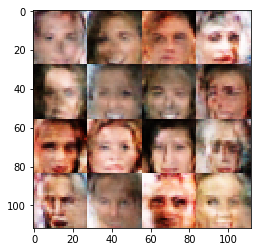

Epoch 0/1... Discriminator Loss: 1.2140... Generator Loss: 1.0513
Epoch 0/1... Discriminator Loss: 1.3597... Generator Loss: 1.0446
Epoch 0/1... Discriminator Loss: 1.0108... Generator Loss: 1.1475
Epoch 0/1... Discriminator Loss: 1.0628... Generator Loss: 1.2642
Epoch 0/1... Discriminator Loss: 1.2876... Generator Loss: 0.7119
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


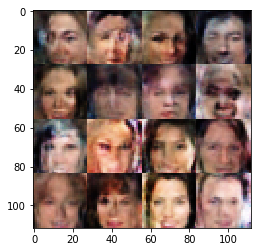

Epoch 0/1... Discriminator Loss: 1.4620... Generator Loss: 1.0902
Epoch 0/1... Discriminator Loss: 1.2413... Generator Loss: 0.8497
Epoch 0/1... Discriminator Loss: 1.2123... Generator Loss: 1.1989
Epoch 0/1... Discriminator Loss: 1.3730... Generator Loss: 1.2663
Epoch 0/1... Discriminator Loss: 1.0867... Generator Loss: 1.1675
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


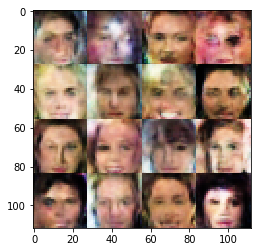

Epoch 0/1... Discriminator Loss: 1.4613... Generator Loss: 1.1405
Epoch 0/1... Discriminator Loss: 1.0914... Generator Loss: 0.8870
Epoch 0/1... Discriminator Loss: 1.1488... Generator Loss: 0.9207
Epoch 0/1... Discriminator Loss: 1.2952... Generator Loss: 0.8516
Epoch 0/1... Discriminator Loss: 1.4078... Generator Loss: 0.9839
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


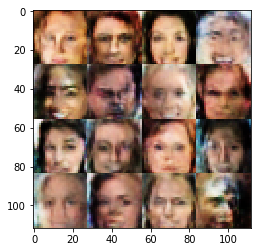

Epoch 0/1... Discriminator Loss: 1.2948... Generator Loss: 0.9554
Epoch 0/1... Discriminator Loss: 1.3743... Generator Loss: 0.9577
Epoch 0/1... Discriminator Loss: 1.1159... Generator Loss: 1.0555
Epoch 0/1... Discriminator Loss: 1.2010... Generator Loss: 0.6801
Epoch 0/1... Discriminator Loss: 1.4295... Generator Loss: 1.0401
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


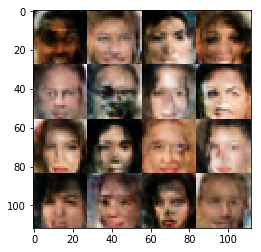

Epoch 0/1... Discriminator Loss: 1.2453... Generator Loss: 1.2277
Epoch 0/1... Discriminator Loss: 1.1050... Generator Loss: 0.6443
Epoch 0/1... Discriminator Loss: 1.0478... Generator Loss: 1.3874
Epoch 0/1... Discriminator Loss: 1.3510... Generator Loss: 0.8748
Epoch 0/1... Discriminator Loss: 1.2804... Generator Loss: 1.2892
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


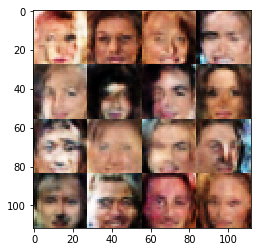

Epoch 0/1... Discriminator Loss: 1.1744... Generator Loss: 1.1114
Epoch 0/1... Discriminator Loss: 1.1009... Generator Loss: 0.8929
Epoch 0/1... Discriminator Loss: 1.3080... Generator Loss: 0.7796
Epoch 0/1... Discriminator Loss: 1.3038... Generator Loss: 0.9157
Epoch 0/1... Discriminator Loss: 1.0504... Generator Loss: 0.9157
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


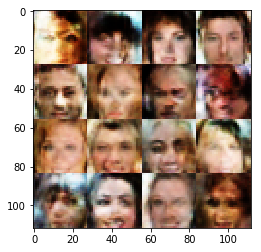

Epoch 0/1... Discriminator Loss: 0.9932... Generator Loss: 1.2232
Epoch 0/1... Discriminator Loss: 1.2236... Generator Loss: 1.1072
Epoch 0/1... Discriminator Loss: 1.1857... Generator Loss: 1.0507
Epoch 0/1... Discriminator Loss: 1.0551... Generator Loss: 1.4007
Epoch 0/1... Discriminator Loss: 1.1704... Generator Loss: 1.2245
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


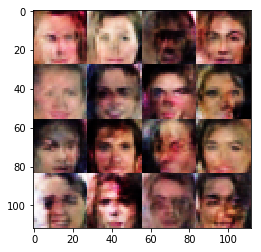

Epoch 0/1... Discriminator Loss: 1.1472... Generator Loss: 1.0674
Epoch 0/1... Discriminator Loss: 1.2355... Generator Loss: 0.9081
Epoch 0/1... Discriminator Loss: 1.4769... Generator Loss: 0.9673
Epoch 0/1... Discriminator Loss: 1.2532... Generator Loss: 1.0019
Epoch 0/1... Discriminator Loss: 1.2348... Generator Loss: 1.1144
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


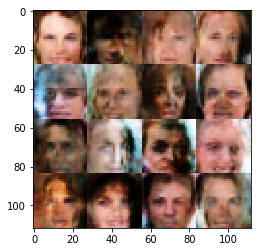

Epoch 0/1... Discriminator Loss: 1.1601... Generator Loss: 1.1739
Epoch 0/1... Discriminator Loss: 1.1757... Generator Loss: 0.9555
Epoch 0/1... Discriminator Loss: 1.5526... Generator Loss: 0.8611
Epoch 0/1... Discriminator Loss: 1.5344... Generator Loss: 0.8155
Epoch 0/1... Discriminator Loss: 1.1216... Generator Loss: 0.7920
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


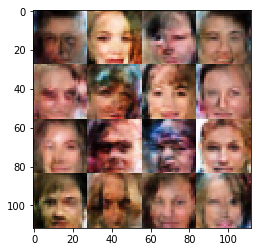

Epoch 0/1... Discriminator Loss: 1.2092... Generator Loss: 1.0608
Epoch 0/1... Discriminator Loss: 1.1712... Generator Loss: 0.9056
Epoch 0/1... Discriminator Loss: 1.0835... Generator Loss: 1.3682
Epoch 0/1... Discriminator Loss: 1.2444... Generator Loss: 1.1198
Epoch 0/1... Discriminator Loss: 1.3389... Generator Loss: 0.9970
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


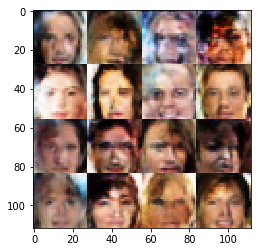

Epoch 0/1... Discriminator Loss: 1.2328... Generator Loss: 1.0489
Epoch 0/1... Discriminator Loss: 1.0395... Generator Loss: 0.9175
Epoch 0/1... Discriminator Loss: 1.5017... Generator Loss: 0.9073
Epoch 0/1... Discriminator Loss: 1.0988... Generator Loss: 0.9613
Epoch 0/1... Discriminator Loss: 1.1097... Generator Loss: 1.1245
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


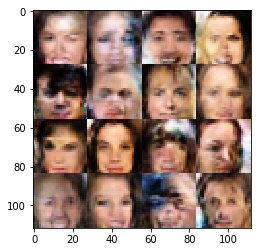

Epoch 0/1... Discriminator Loss: 1.1508... Generator Loss: 1.0955
Epoch 0/1... Discriminator Loss: 1.5198... Generator Loss: 1.0303
Epoch 0/1... Discriminator Loss: 1.1536... Generator Loss: 1.0106
Epoch 0/1... Discriminator Loss: 1.1752... Generator Loss: 1.2147
Epoch 0/1... Discriminator Loss: 1.4107... Generator Loss: 0.9640
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


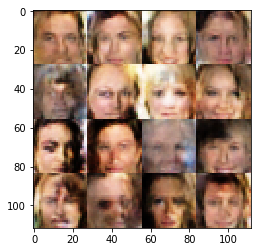

Epoch 0/1... Discriminator Loss: 1.2773... Generator Loss: 1.0362
Epoch 0/1... Discriminator Loss: 1.2135... Generator Loss: 1.0353
Epoch 0/1... Discriminator Loss: 1.1715... Generator Loss: 1.2100
Epoch 0/1... Discriminator Loss: 1.0864... Generator Loss: 0.8982
Epoch 0/1... Discriminator Loss: 1.3942... Generator Loss: 0.9516
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


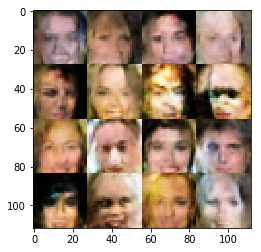

Epoch 0/1... Discriminator Loss: 1.3539... Generator Loss: 0.8389
Epoch 0/1... Discriminator Loss: 1.4648... Generator Loss: 0.7813
Epoch 0/1... Discriminator Loss: 1.0854... Generator Loss: 1.0945
Epoch 0/1... Discriminator Loss: 1.3776... Generator Loss: 1.0007
Epoch 0/1... Discriminator Loss: 1.1594... Generator Loss: 0.9421
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


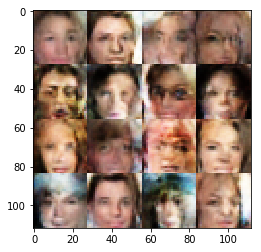

Epoch 0/1... Discriminator Loss: 1.1121... Generator Loss: 0.8878
Epoch 0/1... Discriminator Loss: 1.1017... Generator Loss: 0.8498
Epoch 0/1... Discriminator Loss: 1.2233... Generator Loss: 1.2011
Epoch 0/1... Discriminator Loss: 1.5781... Generator Loss: 0.8535
Epoch 0/1... Discriminator Loss: 1.1985... Generator Loss: 1.0180
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


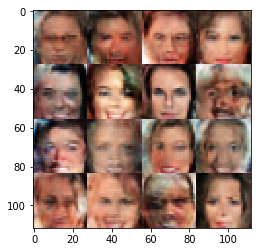

Epoch 0/1... Discriminator Loss: 1.1221... Generator Loss: 1.2555
Epoch 0/1... Discriminator Loss: 1.4014... Generator Loss: 0.9147
Epoch 0/1... Discriminator Loss: 1.2908... Generator Loss: 0.8795
Epoch 0/1... Discriminator Loss: 1.4095... Generator Loss: 0.4876
Epoch 0/1... Discriminator Loss: 1.0786... Generator Loss: 0.9582
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


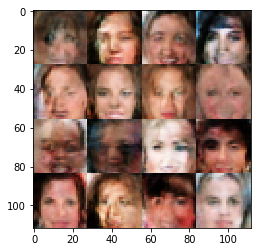

Epoch 0/1... Discriminator Loss: 1.1797... Generator Loss: 0.8803
Epoch 0/1... Discriminator Loss: 1.3170... Generator Loss: 0.9728
Epoch 0/1... Discriminator Loss: 1.5921... Generator Loss: 0.5931
Epoch 0/1... Discriminator Loss: 1.3243... Generator Loss: 0.9773
Epoch 0/1... Discriminator Loss: 1.3644... Generator Loss: 0.7951
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


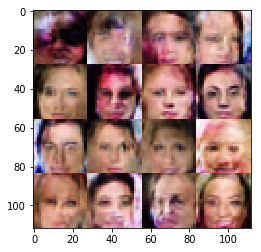

Epoch 0/1... Discriminator Loss: 1.0718... Generator Loss: 1.0708
Epoch 0/1... Discriminator Loss: 1.3444... Generator Loss: 1.1300
Epoch 0/1... Discriminator Loss: 1.3779... Generator Loss: 1.0987
Epoch 0/1... Discriminator Loss: 1.2383... Generator Loss: 1.0205
Epoch 0/1... Discriminator Loss: 1.1615... Generator Loss: 1.0104
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


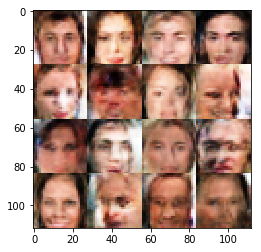

Epoch 0/1... Discriminator Loss: 1.3042... Generator Loss: 0.9364
Epoch 0/1... Discriminator Loss: 1.2915... Generator Loss: 0.9735
Epoch 0/1... Discriminator Loss: 1.4350... Generator Loss: 0.8338
Epoch 0/1... Discriminator Loss: 1.3601... Generator Loss: 0.9275
Epoch 0/1... Discriminator Loss: 1.1886... Generator Loss: 1.1702
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


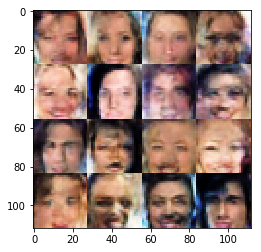

Epoch 0/1... Discriminator Loss: 1.1836... Generator Loss: 0.6604
Epoch 0/1... Discriminator Loss: 1.1932... Generator Loss: 0.9583
Epoch 0/1... Discriminator Loss: 1.3176... Generator Loss: 0.8892
Epoch 0/1... Discriminator Loss: 1.1544... Generator Loss: 1.1634
Epoch 0/1... Discriminator Loss: 1.4808... Generator Loss: 0.8915
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


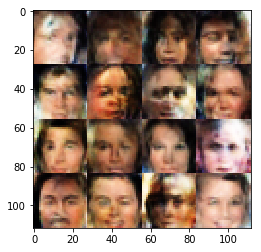

Epoch 0/1... Discriminator Loss: 1.2258... Generator Loss: 1.1765
Epoch 0/1... Discriminator Loss: 1.3533... Generator Loss: 1.1040
Epoch 0/1... Discriminator Loss: 1.3828... Generator Loss: 1.1384
Epoch 0/1... Discriminator Loss: 1.3800... Generator Loss: 0.8604
Epoch 0/1... Discriminator Loss: 1.1641... Generator Loss: 1.0243
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


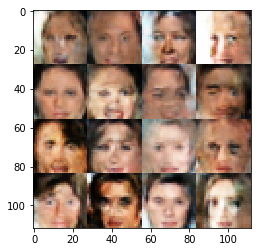

Epoch 0/1... Discriminator Loss: 1.5626... Generator Loss: 0.7644
Epoch 0/1... Discriminator Loss: 1.3030... Generator Loss: 0.9834
Epoch 0/1... Discriminator Loss: 1.4479... Generator Loss: 1.1272
Epoch 0/1... Discriminator Loss: 1.3233... Generator Loss: 0.7745
Epoch 0/1... Discriminator Loss: 1.2572... Generator Loss: 0.9083
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


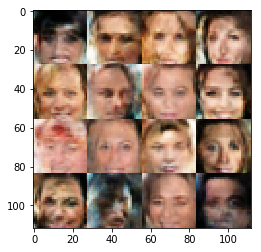

Epoch 0/1... Discriminator Loss: 1.4411... Generator Loss: 0.8180
Epoch 0/1... Discriminator Loss: 1.2478... Generator Loss: 1.0009
Epoch 0/1... Discriminator Loss: 1.5005... Generator Loss: 0.9391
Epoch 0/1... Discriminator Loss: 1.5974... Generator Loss: 0.9170
Epoch 0/1... Discriminator Loss: 1.0180... Generator Loss: 1.0522
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


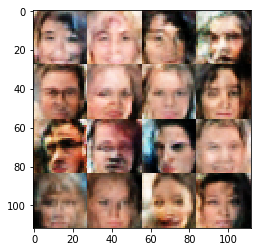

Epoch 0/1... Discriminator Loss: 1.1828... Generator Loss: 1.1822
Epoch 0/1... Discriminator Loss: 1.3966... Generator Loss: 0.9258
Epoch 0/1... Discriminator Loss: 1.1856... Generator Loss: 1.0851
Epoch 0/1... Discriminator Loss: 1.2514... Generator Loss: 1.0313
Epoch 0/1... Discriminator Loss: 1.1376... Generator Loss: 1.0828
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


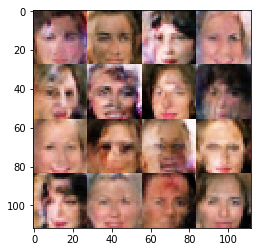

Epoch 0/1... Discriminator Loss: 1.2981... Generator Loss: 0.9287
Epoch 0/1... Discriminator Loss: 1.3929... Generator Loss: 0.8474
Epoch 0/1... Discriminator Loss: 1.0969... Generator Loss: 1.1452
Epoch 0/1... Discriminator Loss: 1.1768... Generator Loss: 1.2873
Epoch 0/1... Discriminator Loss: 1.2274... Generator Loss: 0.9620
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


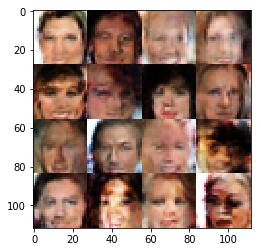

Epoch 0/1... Discriminator Loss: 1.2770... Generator Loss: 1.0481
Epoch 0/1... Discriminator Loss: 1.2720... Generator Loss: 1.1205
Epoch 0/1... Discriminator Loss: 1.3171... Generator Loss: 1.0705
Epoch 0/1... Discriminator Loss: 1.2945... Generator Loss: 0.9852
Epoch 0/1... Discriminator Loss: 1.1239... Generator Loss: 0.9128
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


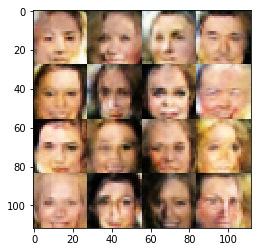

Epoch 0/1... Discriminator Loss: 1.4902... Generator Loss: 0.5903
Epoch 0/1... Discriminator Loss: 1.0417... Generator Loss: 1.2705
Epoch 0/1... Discriminator Loss: 1.4695... Generator Loss: 0.6754
Epoch 0/1... Discriminator Loss: 1.1715... Generator Loss: 0.9947
Epoch 0/1... Discriminator Loss: 1.1005... Generator Loss: 1.0820
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


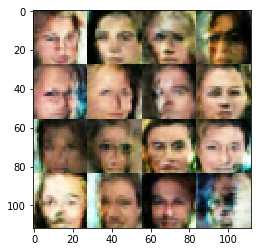

Epoch 0/1... Discriminator Loss: 1.2671... Generator Loss: 1.2267
Epoch 0/1... Discriminator Loss: 1.0471... Generator Loss: 1.0628
Epoch 0/1... Discriminator Loss: 1.4075... Generator Loss: 0.8481
Epoch 0/1... Discriminator Loss: 1.0896... Generator Loss: 0.9133
Epoch 0/1... Discriminator Loss: 1.2709... Generator Loss: 1.0487
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


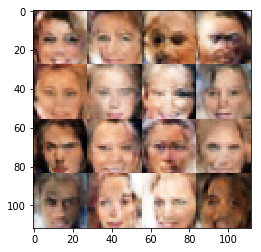

Epoch 0/1... Discriminator Loss: 1.2764... Generator Loss: 0.9184
Epoch 0/1... Discriminator Loss: 1.2870... Generator Loss: 1.0252
Epoch 0/1... Discriminator Loss: 1.3163... Generator Loss: 1.0496
Epoch 0/1... Discriminator Loss: 1.0780... Generator Loss: 1.1129
Epoch 0/1... Discriminator Loss: 1.1712... Generator Loss: 0.9427
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


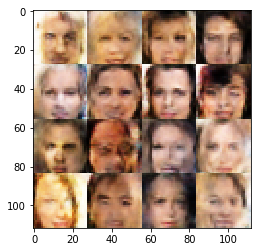

Epoch 0/1... Discriminator Loss: 1.2185... Generator Loss: 1.1373
Epoch 0/1... Discriminator Loss: 1.2212... Generator Loss: 0.8536
Epoch 0/1... Discriminator Loss: 1.1178... Generator Loss: 0.9472
Epoch 0/1... Discriminator Loss: 1.2288... Generator Loss: 0.8653
Epoch 0/1... Discriminator Loss: 1.3242... Generator Loss: 0.9361
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


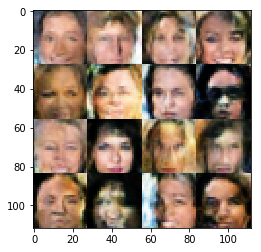

Epoch 0/1... Discriminator Loss: 1.2717... Generator Loss: 1.2351
Epoch 0/1... Discriminator Loss: 1.1566... Generator Loss: 0.7955
Epoch 0/1... Discriminator Loss: 1.4185... Generator Loss: 1.0484
Epoch 0/1... Discriminator Loss: 1.4106... Generator Loss: 0.9216
Epoch 0/1... Discriminator Loss: 1.1602... Generator Loss: 1.0685
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


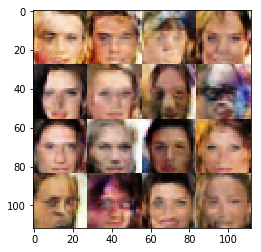

Epoch 0/1... Discriminator Loss: 1.1172... Generator Loss: 0.8104
Epoch 0/1... Discriminator Loss: 1.0435... Generator Loss: 1.1810
Epoch 0/1... Discriminator Loss: 1.1858... Generator Loss: 1.0886
Epoch 0/1... Discriminator Loss: 1.1596... Generator Loss: 1.0794
Epoch 0/1... Discriminator Loss: 1.3260... Generator Loss: 0.8657
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


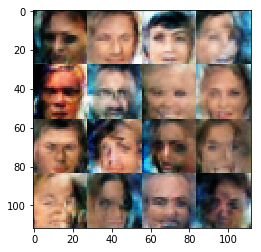

Epoch 0/1... Discriminator Loss: 1.3783... Generator Loss: 0.8081
Epoch 0/1... Discriminator Loss: 1.1177... Generator Loss: 1.0381
Epoch 0/1... Discriminator Loss: 1.2146... Generator Loss: 0.8603
Epoch 0/1... Discriminator Loss: 1.3617... Generator Loss: 1.0810
Epoch 0/1... Discriminator Loss: 1.1678... Generator Loss: 0.9884
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


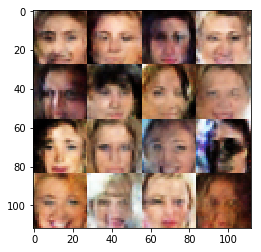

Epoch 0/1... Discriminator Loss: 1.2367... Generator Loss: 1.2235
Epoch 0/1... Discriminator Loss: 1.1805... Generator Loss: 1.1660
Epoch 0/1... Discriminator Loss: 1.0994... Generator Loss: 0.9253
Epoch 0/1... Discriminator Loss: 1.3216... Generator Loss: 0.7477
Epoch 0/1... Discriminator Loss: 1.1850... Generator Loss: 1.2153
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


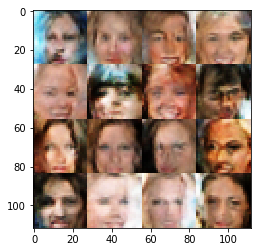

Epoch 0/1... Discriminator Loss: 1.2663... Generator Loss: 0.7339
Epoch 0/1... Discriminator Loss: 1.3666... Generator Loss: 0.9119
Epoch 0/1... Discriminator Loss: 1.3868... Generator Loss: 0.8917
Epoch 0/1... Discriminator Loss: 1.2323... Generator Loss: 0.9031
Epoch 0/1... Discriminator Loss: 1.2335... Generator Loss: 1.2247
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


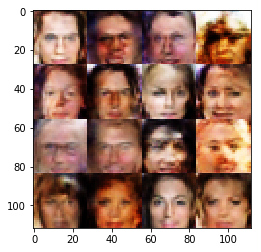

Epoch 0/1... Discriminator Loss: 1.3635... Generator Loss: 0.9530
Epoch 0/1... Discriminator Loss: 1.1905... Generator Loss: 1.0484
Epoch 0/1... Discriminator Loss: 1.3347... Generator Loss: 1.1421
Epoch 0/1... Discriminator Loss: 1.3257... Generator Loss: 0.7606
Epoch 0/1... Discriminator Loss: 1.4967... Generator Loss: 0.8520
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


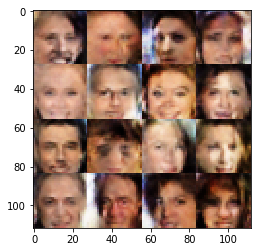

Epoch 0/1... Discriminator Loss: 1.3047... Generator Loss: 1.2808
Epoch 0/1... Discriminator Loss: 1.2993... Generator Loss: 1.1617
Epoch 0/1... Discriminator Loss: 1.1374... Generator Loss: 0.9538
Epoch 0/1... Discriminator Loss: 1.1240... Generator Loss: 1.0863
Epoch 0/1... Discriminator Loss: 1.3410... Generator Loss: 0.8233
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


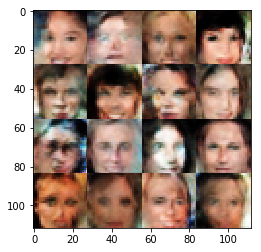

Epoch 0/1... Discriminator Loss: 1.3547... Generator Loss: 1.0063
Epoch 0/1... Discriminator Loss: 1.3352... Generator Loss: 0.8570
Epoch 0/1... Discriminator Loss: 1.0644... Generator Loss: 1.0261
Epoch 0/1... Discriminator Loss: 1.2323... Generator Loss: 1.0330
Epoch 0/1... Discriminator Loss: 1.4110... Generator Loss: 0.9583
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


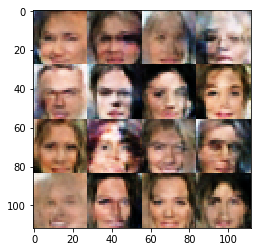

Epoch 0/1... Discriminator Loss: 1.1657... Generator Loss: 0.9065
Epoch 0/1... Discriminator Loss: 1.0257... Generator Loss: 1.0338
Epoch 0/1... Discriminator Loss: 1.4222... Generator Loss: 0.7361
Epoch 0/1... Discriminator Loss: 1.0970... Generator Loss: 0.9125
Epoch 0/1... Discriminator Loss: 1.2142... Generator Loss: 1.2244
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


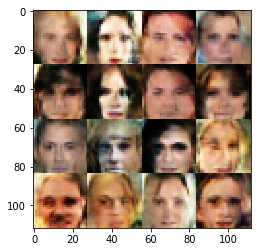

Epoch 0/1... Discriminator Loss: 1.0623... Generator Loss: 1.0052
Epoch 0/1... Discriminator Loss: 1.2175... Generator Loss: 1.2052
Epoch 0/1... Discriminator Loss: 0.9969... Generator Loss: 0.9504
Epoch 0/1... Discriminator Loss: 1.0569... Generator Loss: 0.9220
Epoch 0/1... Discriminator Loss: 1.0696... Generator Loss: 1.1601
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


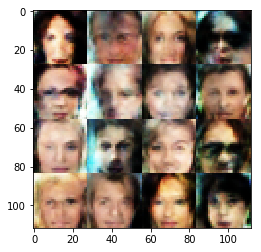

Epoch 0/1... Discriminator Loss: 1.0785... Generator Loss: 0.9517
Epoch 0/1... Discriminator Loss: 1.0188... Generator Loss: 1.0049
Epoch 0/1... Discriminator Loss: 1.2025... Generator Loss: 1.2044
Epoch 0/1... Discriminator Loss: 1.2568... Generator Loss: 0.6695
Epoch 0/1... Discriminator Loss: 1.0438... Generator Loss: 1.2734
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


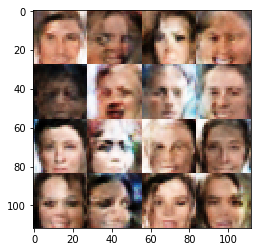

Epoch 0/1... Discriminator Loss: 1.1807... Generator Loss: 0.9041
Epoch 0/1... Discriminator Loss: 1.1319... Generator Loss: 0.6901
Epoch 0/1... Discriminator Loss: 1.4885... Generator Loss: 1.0131
Epoch 0/1... Discriminator Loss: 1.1239... Generator Loss: 1.1197
Epoch 0/1... Discriminator Loss: 1.4296... Generator Loss: 0.9560
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


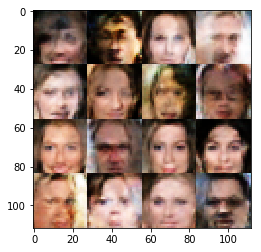

Epoch 0/1... Discriminator Loss: 1.1842... Generator Loss: 0.9128
Epoch 0/1... Discriminator Loss: 1.4031... Generator Loss: 0.8193
Epoch 0/1... Discriminator Loss: 1.2232... Generator Loss: 0.9010
Epoch 0/1... Discriminator Loss: 1.2879... Generator Loss: 0.9583
Epoch 0/1... Discriminator Loss: 1.1539... Generator Loss: 0.9569
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


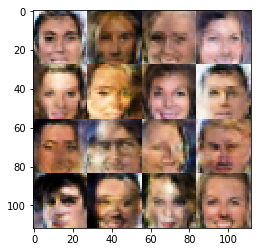

Epoch 0/1... Discriminator Loss: 1.3677... Generator Loss: 1.1138
Epoch 0/1... Discriminator Loss: 1.3111... Generator Loss: 0.7978
Epoch 0/1... Discriminator Loss: 1.3506... Generator Loss: 0.9732
Epoch 0/1... Discriminator Loss: 1.1790... Generator Loss: 0.9328
Epoch 0/1... Discriminator Loss: 1.1615... Generator Loss: 1.0194
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


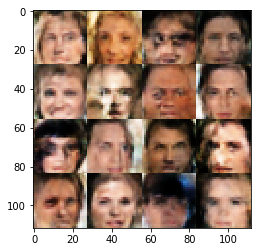

Epoch 0/1... Discriminator Loss: 1.2207... Generator Loss: 0.8381
Epoch 0/1... Discriminator Loss: 1.1209... Generator Loss: 1.2358
Epoch 0/1... Discriminator Loss: 1.0409... Generator Loss: 1.1122
Epoch 0/1... Discriminator Loss: 1.4054... Generator Loss: 0.8953
Epoch 0/1... Discriminator Loss: 1.2843... Generator Loss: 0.9965
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


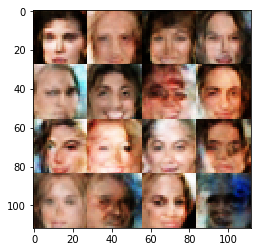

Epoch 0/1... Discriminator Loss: 1.1961... Generator Loss: 1.2141
Epoch 0/1... Discriminator Loss: 1.5744... Generator Loss: 0.6966
Epoch 0/1... Discriminator Loss: 1.1278... Generator Loss: 0.8445
Epoch 0/1... Discriminator Loss: 1.1562... Generator Loss: 1.0614
Epoch 0/1... Discriminator Loss: 1.2712... Generator Loss: 0.8846
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


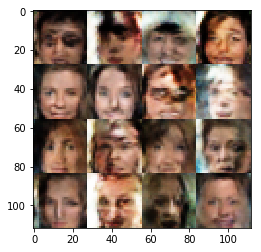

Epoch 0/1... Discriminator Loss: 1.3545... Generator Loss: 0.7963
Epoch 0/1... Discriminator Loss: 0.9926... Generator Loss: 1.3153
Epoch 0/1... Discriminator Loss: 1.3280... Generator Loss: 0.9967
Epoch 0/1... Discriminator Loss: 1.2036... Generator Loss: 0.9983
Epoch 0/1... Discriminator Loss: 1.2377... Generator Loss: 1.4484
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


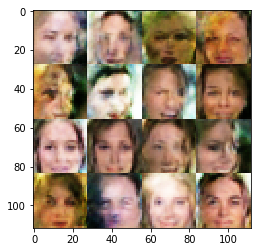

Epoch 0/1... Discriminator Loss: 1.0469... Generator Loss: 0.9339
Epoch 0/1... Discriminator Loss: 1.3835... Generator Loss: 0.8508
Epoch 0/1... Discriminator Loss: 1.3963... Generator Loss: 1.1474
Epoch 0/1... Discriminator Loss: 1.2605... Generator Loss: 0.9316
Epoch 0/1... Discriminator Loss: 1.1640... Generator Loss: 0.9458
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


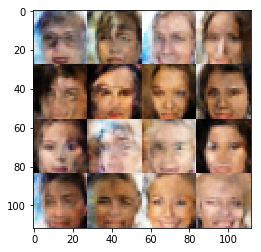

Epoch 0/1... Discriminator Loss: 1.2459... Generator Loss: 0.9913
Epoch 0/1... Discriminator Loss: 1.2075... Generator Loss: 1.0173
Epoch 0/1... Discriminator Loss: 1.1536... Generator Loss: 1.1859
Epoch 0/1... Discriminator Loss: 1.3505... Generator Loss: 1.0005
Epoch 0/1... Discriminator Loss: 1.0171... Generator Loss: 1.1783
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


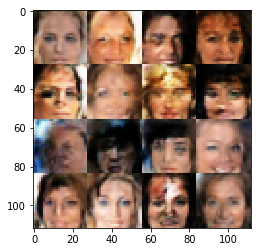

Epoch 0/1... Discriminator Loss: 1.3190... Generator Loss: 0.8931
Epoch 0/1... Discriminator Loss: 1.3392... Generator Loss: 1.2204
Epoch 0/1... Discriminator Loss: 1.4126... Generator Loss: 0.8917
Epoch 0/1... Discriminator Loss: 1.3490... Generator Loss: 0.9052
Epoch 0/1... Discriminator Loss: 1.3501... Generator Loss: 1.2264
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


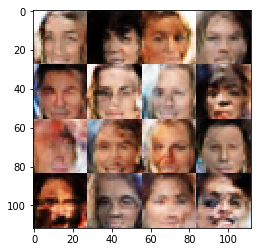

Epoch 0/1... Discriminator Loss: 1.2443... Generator Loss: 1.1721
Epoch 0/1... Discriminator Loss: 1.0491... Generator Loss: 1.0514
Epoch 0/1... Discriminator Loss: 1.4443... Generator Loss: 0.7767
Epoch 0/1... Discriminator Loss: 0.9710... Generator Loss: 1.3797
Epoch 0/1... Discriminator Loss: 1.0041... Generator Loss: 1.3746
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


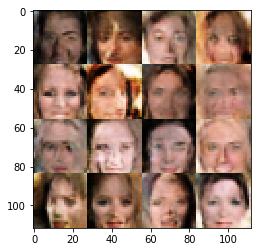

Epoch 0/1... Discriminator Loss: 1.2505... Generator Loss: 0.9550
Epoch 0/1... Discriminator Loss: 1.2030... Generator Loss: 0.8563
Epoch 0/1... Discriminator Loss: 1.2600... Generator Loss: 0.7498
Epoch 0/1... Discriminator Loss: 1.1912... Generator Loss: 1.2263
Epoch 0/1... Discriminator Loss: 1.1151... Generator Loss: 0.7846
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


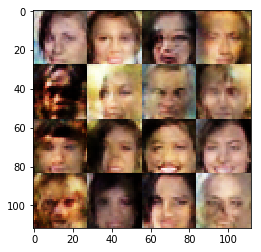

Epoch 0/1... Discriminator Loss: 1.3044... Generator Loss: 0.8179
Epoch 0/1... Discriminator Loss: 1.3061... Generator Loss: 1.3019
Epoch 0/1... Discriminator Loss: 1.1848... Generator Loss: 0.8614
Epoch 0/1... Discriminator Loss: 1.2344... Generator Loss: 0.7627
Epoch 0/1... Discriminator Loss: 1.3597... Generator Loss: 1.0144
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


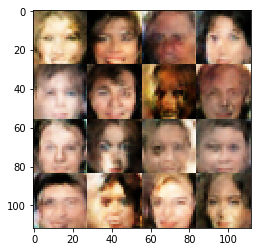

Epoch 0/1... Discriminator Loss: 1.4129... Generator Loss: 0.9578
Epoch 0/1... Discriminator Loss: 1.3242... Generator Loss: 0.8248
Epoch 0/1... Discriminator Loss: 1.1174... Generator Loss: 1.1831
Epoch 0/1... Discriminator Loss: 1.2968... Generator Loss: 0.8853
Epoch 0/1... Discriminator Loss: 1.0560... Generator Loss: 1.3363
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


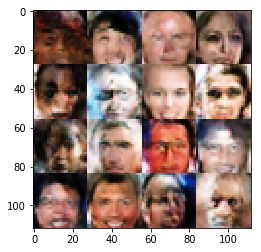

Epoch 0/1... Discriminator Loss: 1.2472... Generator Loss: 1.0424
Epoch 0/1... Discriminator Loss: 1.4235... Generator Loss: 0.8851
Epoch 0/1... Discriminator Loss: 1.0739... Generator Loss: 1.0518
Epoch 0/1... Discriminator Loss: 1.6516... Generator Loss: 0.7893
Epoch 0/1... Discriminator Loss: 1.3527... Generator Loss: 0.9855
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


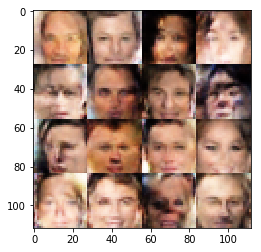

Epoch 0/1... Discriminator Loss: 1.3371... Generator Loss: 0.8917
Epoch 0/1... Discriminator Loss: 1.4488... Generator Loss: 0.7115
Epoch 0/1... Discriminator Loss: 1.6614... Generator Loss: 1.0911
Epoch 0/1... Discriminator Loss: 1.3614... Generator Loss: 1.0089
Epoch 0/1... Discriminator Loss: 1.0054... Generator Loss: 1.0822
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


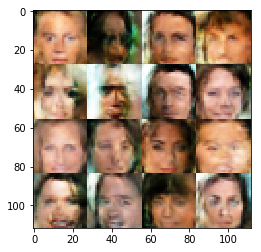

Epoch 0/1... Discriminator Loss: 1.1474... Generator Loss: 1.0975
Epoch 0/1... Discriminator Loss: 1.1524... Generator Loss: 1.5943
Epoch 0/1... Discriminator Loss: 1.2520... Generator Loss: 1.0437
Epoch 0/1... Discriminator Loss: 1.0586... Generator Loss: 0.9342
Epoch 0/1... Discriminator Loss: 1.5948... Generator Loss: 0.9897
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


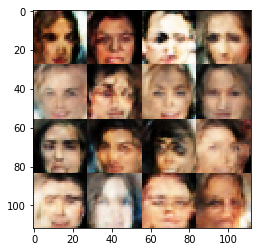

Epoch 0/1... Discriminator Loss: 1.1927... Generator Loss: 0.9233
Epoch 0/1... Discriminator Loss: 1.2281... Generator Loss: 0.7721
Epoch 0/1... Discriminator Loss: 1.1863... Generator Loss: 1.0822
Epoch 0/1... Discriminator Loss: 1.1728... Generator Loss: 1.1204
Epoch 0/1... Discriminator Loss: 1.1789... Generator Loss: 0.9677
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


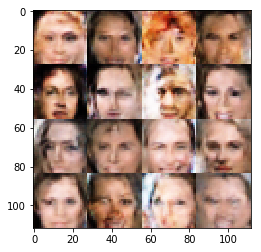

Epoch 0/1... Discriminator Loss: 1.4572... Generator Loss: 0.9421
Epoch 0/1... Discriminator Loss: 1.3837... Generator Loss: 0.9647
Epoch 0/1... Discriminator Loss: 1.2564... Generator Loss: 0.8929
Epoch 0/1... Discriminator Loss: 1.4644... Generator Loss: 0.8773
Epoch 0/1... Discriminator Loss: 1.2232... Generator Loss: 0.9260
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


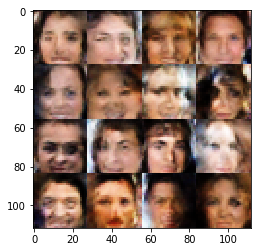

Epoch 0/1... Discriminator Loss: 1.0565... Generator Loss: 1.2630
Epoch 0/1... Discriminator Loss: 1.1378... Generator Loss: 1.1530
Epoch 0/1... Discriminator Loss: 1.3604... Generator Loss: 1.0156
Epoch 0/1... Discriminator Loss: 1.2166... Generator Loss: 0.8541
Epoch 0/1... Discriminator Loss: 1.1172... Generator Loss: 0.9739
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


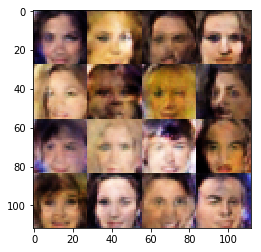

Epoch 0/1... Discriminator Loss: 1.2506... Generator Loss: 0.9842
Epoch 0/1... Discriminator Loss: 1.1707... Generator Loss: 1.0362
Epoch 0/1... Discriminator Loss: 1.1615... Generator Loss: 0.8491
Epoch 0/1... Discriminator Loss: 1.3738... Generator Loss: 0.9548
Epoch 0/1... Discriminator Loss: 1.4920... Generator Loss: 1.2451
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


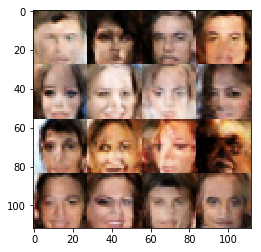

Epoch 0/1... Discriminator Loss: 1.2339... Generator Loss: 0.9716
Epoch 0/1... Discriminator Loss: 1.0946... Generator Loss: 1.0402
Epoch 0/1... Discriminator Loss: 1.3758... Generator Loss: 0.8280
Epoch 0/1... Discriminator Loss: 1.2922... Generator Loss: 0.9349
Epoch 0/1... Discriminator Loss: 1.2337... Generator Loss: 0.7360
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


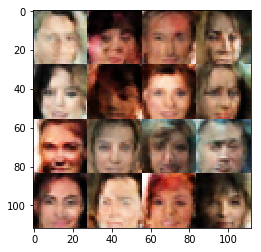

Epoch 0/1... Discriminator Loss: 1.0792... Generator Loss: 1.2970
Epoch 0/1... Discriminator Loss: 1.2517... Generator Loss: 0.7947
Epoch 0/1... Discriminator Loss: 1.2767... Generator Loss: 0.8147
Epoch 0/1... Discriminator Loss: 1.1460... Generator Loss: 0.7584
Epoch 0/1... Discriminator Loss: 1.2282... Generator Loss: 0.9753
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


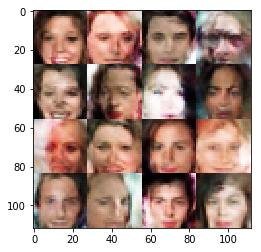

Epoch 0/1... Discriminator Loss: 1.1293... Generator Loss: 0.9902
Epoch 0/1... Discriminator Loss: 1.1261... Generator Loss: 1.0179
Epoch 0/1... Discriminator Loss: 1.1894... Generator Loss: 1.1840
Epoch 0/1... Discriminator Loss: 1.3020... Generator Loss: 0.8752
Epoch 0/1... Discriminator Loss: 1.3403... Generator Loss: 0.8477
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


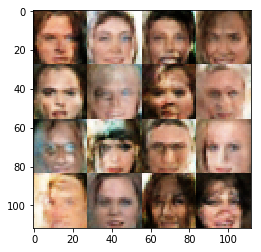

Epoch 0/1... Discriminator Loss: 0.9898... Generator Loss: 1.2193
Epoch 0/1... Discriminator Loss: 1.0640... Generator Loss: 1.0274
Epoch 0/1... Discriminator Loss: 1.0418... Generator Loss: 1.1369
Epoch 0/1... Discriminator Loss: 1.4538... Generator Loss: 0.8625
Epoch 0/1... Discriminator Loss: 1.0658... Generator Loss: 0.7949
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


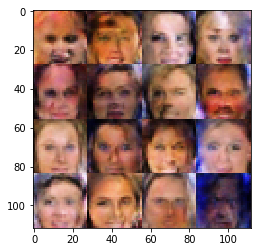

Epoch 0/1... Discriminator Loss: 1.3436... Generator Loss: 0.7744
Epoch 0/1... Discriminator Loss: 1.0078... Generator Loss: 1.0448
Epoch 0/1... Discriminator Loss: 1.2089... Generator Loss: 1.1614
Epoch 0/1... Discriminator Loss: 1.2167... Generator Loss: 0.9295
Epoch 0/1... Discriminator Loss: 1.3324... Generator Loss: 0.9427
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


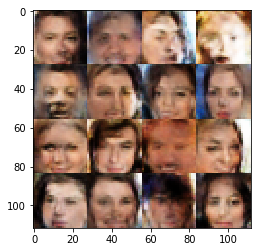

Epoch 0/1... Discriminator Loss: 1.1210... Generator Loss: 1.0367
Epoch 0/1... Discriminator Loss: 1.4864... Generator Loss: 1.0084
Epoch 0/1... Discriminator Loss: 1.3294... Generator Loss: 0.9790
Epoch 0/1... Discriminator Loss: 1.1946... Generator Loss: 1.0502
Epoch 0/1... Discriminator Loss: 1.4724... Generator Loss: 1.0227
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


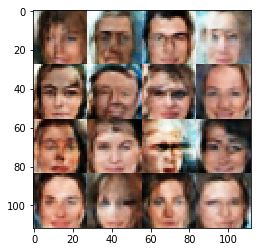

Epoch 0/1... Discriminator Loss: 1.1954... Generator Loss: 0.8556
Epoch 0/1... Discriminator Loss: 1.3165... Generator Loss: 0.8172
Epoch 0/1... Discriminator Loss: 1.3204... Generator Loss: 0.9410
Epoch 0/1... Discriminator Loss: 1.1177... Generator Loss: 1.1491
Epoch 0/1... Discriminator Loss: 1.5069... Generator Loss: 0.6353
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


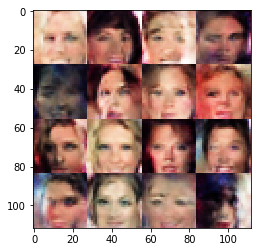

Epoch 0/1... Discriminator Loss: 1.3121... Generator Loss: 1.1265
Epoch 0/1... Discriminator Loss: 1.2703... Generator Loss: 0.8946
Epoch 0/1... Discriminator Loss: 1.0092... Generator Loss: 1.3549
Epoch 0/1... Discriminator Loss: 1.1990... Generator Loss: 1.0856
Epoch 0/1... Discriminator Loss: 1.1038... Generator Loss: 1.0146
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


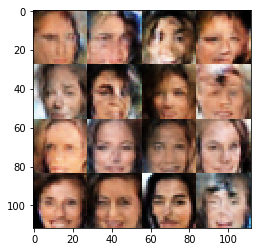

Epoch 0/1... Discriminator Loss: 1.1222... Generator Loss: 1.1849
Epoch 0/1... Discriminator Loss: 1.3063... Generator Loss: 0.8909
Epoch 0/1... Discriminator Loss: 0.9727... Generator Loss: 1.0658
Epoch 0/1... Discriminator Loss: 1.1201... Generator Loss: 1.2017
Epoch 0/1... Discriminator Loss: 1.1844... Generator Loss: 1.2080
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


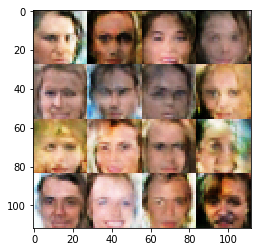

Epoch 0/1... Discriminator Loss: 1.0747... Generator Loss: 1.0304
Epoch 0/1... Discriminator Loss: 1.1515... Generator Loss: 0.9370
Epoch 0/1... Discriminator Loss: 1.0789... Generator Loss: 1.0647
Epoch 0/1... Discriminator Loss: 1.1531... Generator Loss: 0.9116
Epoch 0/1... Discriminator Loss: 1.5733... Generator Loss: 0.9751
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


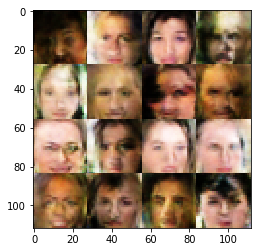

Epoch 0/1... Discriminator Loss: 1.0618... Generator Loss: 1.4884
Epoch 0/1... Discriminator Loss: 1.0366... Generator Loss: 0.8654
Epoch 0/1... Discriminator Loss: 1.2094... Generator Loss: 1.3428
Epoch 0/1... Discriminator Loss: 1.0235... Generator Loss: 0.8134
Epoch 0/1... Discriminator Loss: 1.2888... Generator Loss: 1.0211
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


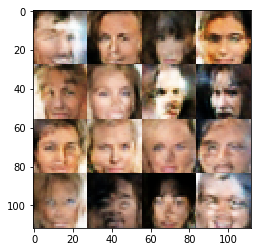

Epoch 0/1... Discriminator Loss: 1.2374... Generator Loss: 0.9680
Epoch 0/1... Discriminator Loss: 1.4001... Generator Loss: 0.7774
Epoch 0/1... Discriminator Loss: 1.3678... Generator Loss: 0.8125
Epoch 0/1... Discriminator Loss: 1.0995... Generator Loss: 1.1936
Epoch 0/1... Discriminator Loss: 1.2511... Generator Loss: 0.9029
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


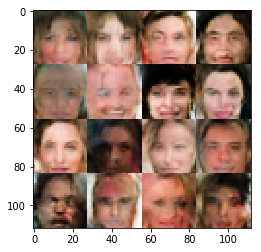

Epoch 0/1... Discriminator Loss: 1.0771... Generator Loss: 0.8822
Epoch 0/1... Discriminator Loss: 1.4545... Generator Loss: 0.8036
Epoch 0/1... Discriminator Loss: 1.2202... Generator Loss: 1.2307
Epoch 0/1... Discriminator Loss: 1.3775... Generator Loss: 0.9591
Epoch 0/1... Discriminator Loss: 1.1761... Generator Loss: 0.9967
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


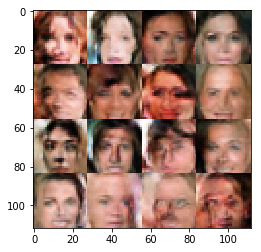

Epoch 0/1... Discriminator Loss: 0.9158... Generator Loss: 1.2777
Epoch 0/1... Discriminator Loss: 1.0804... Generator Loss: 1.3828
Epoch 0/1... Discriminator Loss: 1.1023... Generator Loss: 0.9222
Epoch 0/1... Discriminator Loss: 1.2782... Generator Loss: 0.8895
Epoch 0/1... Discriminator Loss: 1.3415... Generator Loss: 1.1307
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


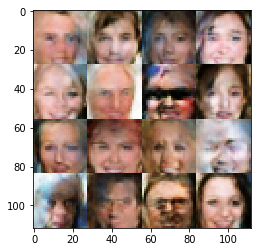

Epoch 0/1... Discriminator Loss: 1.0993... Generator Loss: 0.8952
Epoch 0/1... Discriminator Loss: 1.3526... Generator Loss: 1.0852
Epoch 0/1... Discriminator Loss: 1.2172... Generator Loss: 0.8808
Epoch 0/1... Discriminator Loss: 1.2390... Generator Loss: 0.7692
Epoch 0/1... Discriminator Loss: 1.1350... Generator Loss: 0.6483
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


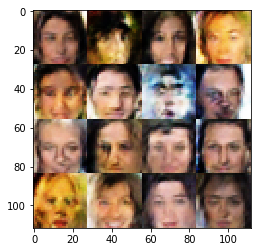

Epoch 0/1... Discriminator Loss: 1.2765... Generator Loss: 1.1999
Epoch 0/1... Discriminator Loss: 1.2984... Generator Loss: 1.0354
Epoch 0/1... Discriminator Loss: 1.2118... Generator Loss: 0.8470
Epoch 0/1... Discriminator Loss: 1.2174... Generator Loss: 1.0327
Epoch 0/1... Discriminator Loss: 1.2204... Generator Loss: 1.1697
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


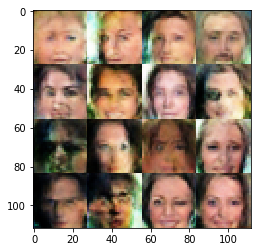

Epoch 0/1... Discriminator Loss: 0.8341... Generator Loss: 1.2046
Epoch 0/1... Discriminator Loss: 0.9875... Generator Loss: 1.3247
Epoch 0/1... Discriminator Loss: 1.3458... Generator Loss: 0.9368
Epoch 0/1... Discriminator Loss: 1.0813... Generator Loss: 1.1368
Epoch 0/1... Discriminator Loss: 1.2055... Generator Loss: 0.6847
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


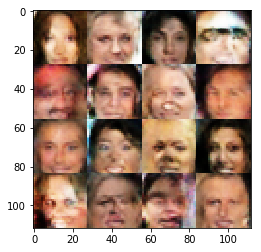

Epoch 0/1... Discriminator Loss: 0.9850... Generator Loss: 1.1370
Epoch 0/1... Discriminator Loss: 1.3623... Generator Loss: 0.9988
Epoch 0/1... Discriminator Loss: 1.2232... Generator Loss: 0.8413
Epoch 0/1... Discriminator Loss: 1.0287... Generator Loss: 1.2615
Epoch 0/1... Discriminator Loss: 1.1707... Generator Loss: 1.2020
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


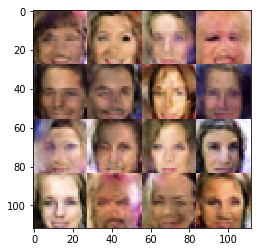

Epoch 0/1... Discriminator Loss: 1.2719... Generator Loss: 0.7182
Epoch 0/1... Discriminator Loss: 1.2154... Generator Loss: 1.1294
Epoch 0/1... Discriminator Loss: 1.0738... Generator Loss: 1.1729
Epoch 0/1... Discriminator Loss: 1.2055... Generator Loss: 1.1573
Epoch 0/1... Discriminator Loss: 1.0589... Generator Loss: 1.0531
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


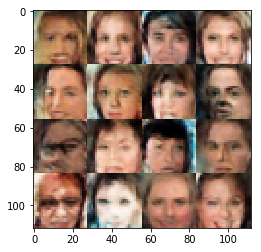

Epoch 0/1... Discriminator Loss: 1.0650... Generator Loss: 1.1313
Epoch 0/1... Discriminator Loss: 1.1551... Generator Loss: 0.9677
Epoch 0/1... Discriminator Loss: 1.3535... Generator Loss: 0.7201
Epoch 0/1... Discriminator Loss: 1.0892... Generator Loss: 1.4097
Epoch 0/1... Discriminator Loss: 1.1697... Generator Loss: 1.1927
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


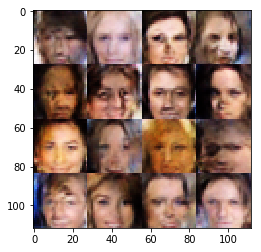

Epoch 0/1... Discriminator Loss: 1.0809... Generator Loss: 1.2738
Epoch 0/1... Discriminator Loss: 1.1138... Generator Loss: 1.0364
Epoch 0/1... Discriminator Loss: 1.1790... Generator Loss: 0.9384
Epoch 0/1... Discriminator Loss: 1.4960... Generator Loss: 0.9482
Epoch 0/1... Discriminator Loss: 1.1132... Generator Loss: 1.1228
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


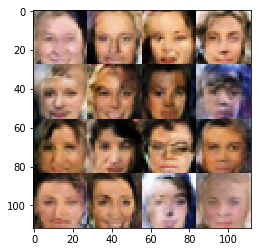

Epoch 0/1... Discriminator Loss: 1.4639... Generator Loss: 1.2917
Epoch 0/1... Discriminator Loss: 1.3407... Generator Loss: 1.1212
Epoch 0/1... Discriminator Loss: 1.3459... Generator Loss: 1.1719
Epoch 0/1... Discriminator Loss: 1.1291... Generator Loss: 1.2607
Epoch 0/1... Discriminator Loss: 1.3981... Generator Loss: 0.7842
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


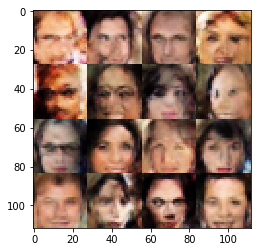

Epoch 0/1... Discriminator Loss: 1.4900... Generator Loss: 0.9410
Epoch 0/1... Discriminator Loss: 1.1191... Generator Loss: 1.1637
Epoch 0/1... Discriminator Loss: 1.1397... Generator Loss: 1.1724
Epoch 0/1... Discriminator Loss: 1.1946... Generator Loss: 0.9838
Epoch 0/1... Discriminator Loss: 1.2598... Generator Loss: 0.9062
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


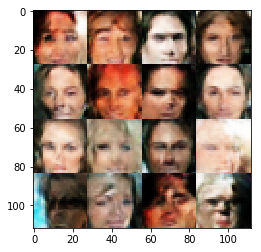

Epoch 0/1... Discriminator Loss: 1.1205... Generator Loss: 1.0899
Epoch 0/1... Discriminator Loss: 1.5355... Generator Loss: 1.2406
Epoch 0/1... Discriminator Loss: 1.1716... Generator Loss: 1.3456
Epoch 0/1... Discriminator Loss: 1.2956... Generator Loss: 0.8921
Epoch 0/1... Discriminator Loss: 1.1287... Generator Loss: 1.0551
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


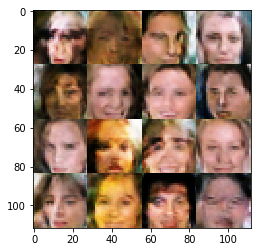

Epoch 0/1... Discriminator Loss: 1.0988... Generator Loss: 1.2869
Epoch 0/1... Discriminator Loss: 1.3568... Generator Loss: 1.0656
Epoch 0/1... Discriminator Loss: 1.2594... Generator Loss: 0.8556
Epoch 0/1... Discriminator Loss: 1.2998... Generator Loss: 0.6580
Epoch 0/1... Discriminator Loss: 1.5277... Generator Loss: 0.8028
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


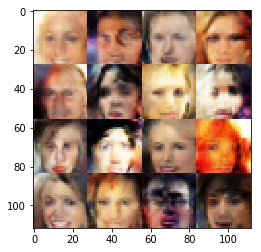

Epoch 0/1... Discriminator Loss: 1.2367... Generator Loss: 1.1496
Epoch 0/1... Discriminator Loss: 1.1349... Generator Loss: 1.4342
Epoch 0/1... Discriminator Loss: 1.1671... Generator Loss: 1.0054
Epoch 0/1... Discriminator Loss: 1.1330... Generator Loss: 1.0470
Epoch 0/1... Discriminator Loss: 1.0985... Generator Loss: 1.1172
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


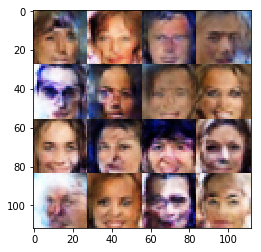

Epoch 0/1... Discriminator Loss: 1.0281... Generator Loss: 1.0895
Epoch 0/1... Discriminator Loss: 1.1803... Generator Loss: 1.2365
Epoch 0/1... Discriminator Loss: 1.3517... Generator Loss: 0.9812
Epoch 0/1... Discriminator Loss: 1.2148... Generator Loss: 0.9901
Epoch 0/1... Discriminator Loss: 0.9260... Generator Loss: 1.3849
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


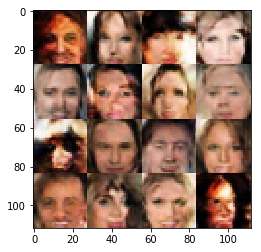

Epoch 0/1... Discriminator Loss: 1.0011... Generator Loss: 1.1985
Epoch 0/1... Discriminator Loss: 1.1476... Generator Loss: 0.9419
Epoch 0/1... Discriminator Loss: 1.3565... Generator Loss: 1.5176
Epoch 0/1... Discriminator Loss: 1.2697... Generator Loss: 1.0510
Epoch 0/1... Discriminator Loss: 1.2341... Generator Loss: 1.2154
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


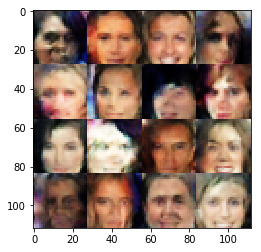

Epoch 0/1... Discriminator Loss: 1.0296... Generator Loss: 0.9391
Epoch 0/1... Discriminator Loss: 1.1591... Generator Loss: 1.0776
Epoch 0/1... Discriminator Loss: 1.0708... Generator Loss: 0.8288
Epoch 0/1... Discriminator Loss: 0.9988... Generator Loss: 0.7476
Epoch 0/1... Discriminator Loss: 1.0988... Generator Loss: 1.0972
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


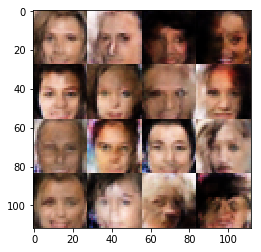

Epoch 0/1... Discriminator Loss: 1.0194... Generator Loss: 1.2705
Epoch 0/1... Discriminator Loss: 1.2712... Generator Loss: 1.1175
Epoch 0/1... Discriminator Loss: 1.2644... Generator Loss: 1.0625
Epoch 0/1... Discriminator Loss: 1.3718... Generator Loss: 1.3362
Epoch 0/1... Discriminator Loss: 1.0348... Generator Loss: 1.0495
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


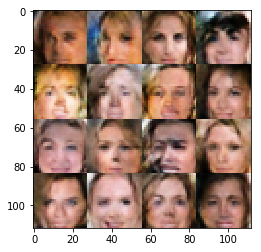

Epoch 0/1... Discriminator Loss: 1.2287... Generator Loss: 0.8043
Epoch 0/1... Discriminator Loss: 1.2321... Generator Loss: 1.1318
Epoch 0/1... Discriminator Loss: 0.9973... Generator Loss: 0.8993
Epoch 0/1... Discriminator Loss: 1.1522... Generator Loss: 1.0166
Epoch 0/1... Discriminator Loss: 1.2251... Generator Loss: 1.0380
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


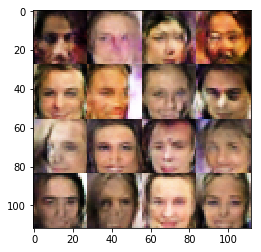

Epoch 0/1... Discriminator Loss: 1.3120... Generator Loss: 0.8057
Epoch 0/1... Discriminator Loss: 1.2141... Generator Loss: 1.2864
Epoch 0/1... Discriminator Loss: 1.3831... Generator Loss: 1.0773
Epoch 0/1... Discriminator Loss: 1.2685... Generator Loss: 1.1657
Epoch 0/1... Discriminator Loss: 1.2002... Generator Loss: 1.0891
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


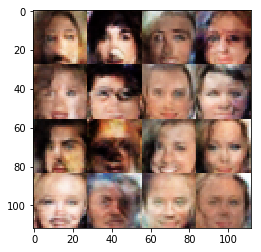

Epoch 0/1... Discriminator Loss: 1.3403... Generator Loss: 1.0199
Epoch 0/1... Discriminator Loss: 1.0817... Generator Loss: 1.2649
Epoch 0/1... Discriminator Loss: 1.3551... Generator Loss: 0.8975
Epoch 0/1... Discriminator Loss: 1.2699... Generator Loss: 1.0875
Epoch 0/1... Discriminator Loss: 1.2385... Generator Loss: 0.9260
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


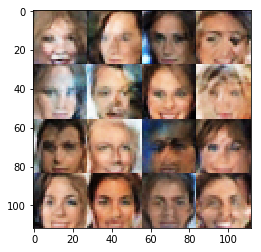

Epoch 0/1... Discriminator Loss: 1.3286... Generator Loss: 1.1769
Epoch 0/1... Discriminator Loss: 1.2569... Generator Loss: 1.0652
Epoch 0/1... Discriminator Loss: 1.3260... Generator Loss: 1.0059
Epoch 0/1... Discriminator Loss: 1.1947... Generator Loss: 0.7996
Epoch 0/1... Discriminator Loss: 1.1740... Generator Loss: 1.2343
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


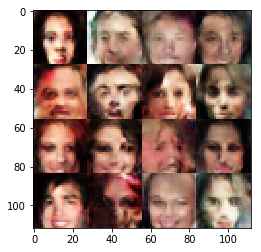

Epoch 0/1... Discriminator Loss: 1.2138... Generator Loss: 0.7874
Epoch 0/1... Discriminator Loss: 1.1810... Generator Loss: 0.9669
Epoch 0/1... Discriminator Loss: 1.2975... Generator Loss: 1.0017
Epoch 0/1... Discriminator Loss: 0.9402... Generator Loss: 1.2323
Epoch 0/1... Discriminator Loss: 1.2474... Generator Loss: 0.8725
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


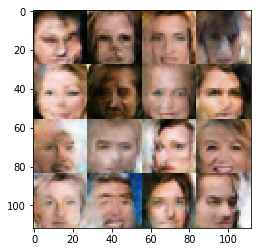

Epoch 0/1... Discriminator Loss: 1.0433... Generator Loss: 1.1278
Epoch 0/1... Discriminator Loss: 1.3238... Generator Loss: 0.8893
Epoch 0/1... Discriminator Loss: 1.2580... Generator Loss: 1.0804
Epoch 0/1... Discriminator Loss: 1.1394... Generator Loss: 0.8951
Epoch 0/1... Discriminator Loss: 1.1466... Generator Loss: 0.8513
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


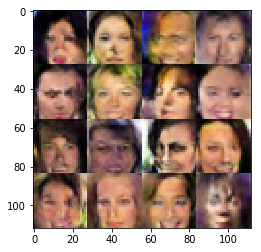

Epoch 0/1... Discriminator Loss: 1.3160... Generator Loss: 0.8483
Epoch 0/1... Discriminator Loss: 1.1558... Generator Loss: 1.0586
Epoch 0/1... Discriminator Loss: 1.1072... Generator Loss: 0.8017
Epoch 0/1... Discriminator Loss: 1.1475... Generator Loss: 1.0725
Epoch 0/1... Discriminator Loss: 1.4192... Generator Loss: 0.9556
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


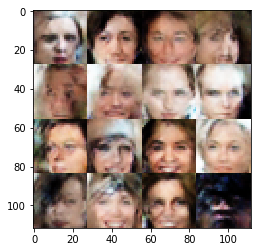

Epoch 0/1... Discriminator Loss: 1.3175... Generator Loss: 1.3170
Epoch 0/1... Discriminator Loss: 1.1194... Generator Loss: 1.1206
Epoch 0/1... Discriminator Loss: 1.0861... Generator Loss: 0.9539
Epoch 0/1... Discriminator Loss: 1.2829... Generator Loss: 0.8347
Epoch 0/1... Discriminator Loss: 1.2359... Generator Loss: 0.8892
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


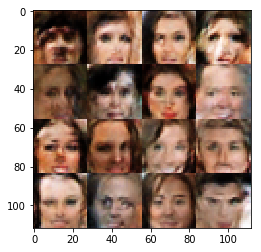

Epoch 0/1... Discriminator Loss: 1.2396... Generator Loss: 1.0532
Epoch 0/1... Discriminator Loss: 1.4673... Generator Loss: 1.0272
Epoch 0/1... Discriminator Loss: 1.3883... Generator Loss: 0.8455
Epoch 0/1... Discriminator Loss: 1.4761... Generator Loss: 0.7631
Epoch 0/1... Discriminator Loss: 1.0420... Generator Loss: 1.0644
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


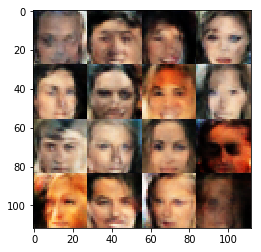

Epoch 0/1... Discriminator Loss: 1.0616... Generator Loss: 1.4411
Epoch 0/1... Discriminator Loss: 1.4132... Generator Loss: 1.3963
Epoch 0/1... Discriminator Loss: 1.0084... Generator Loss: 1.2136
Epoch 0/1... Discriminator Loss: 1.1847... Generator Loss: 1.1156
Epoch 0/1... Discriminator Loss: 1.2098... Generator Loss: 1.0304
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


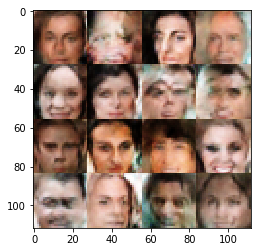

Epoch 0/1... Discriminator Loss: 1.2081... Generator Loss: 1.0109
Epoch 0/1... Discriminator Loss: 1.2429... Generator Loss: 1.0887
Epoch 0/1... Discriminator Loss: 1.1292... Generator Loss: 0.8210
Epoch 0/1... Discriminator Loss: 0.9694... Generator Loss: 1.0039
Epoch 0/1... Discriminator Loss: 1.4175... Generator Loss: 1.2560
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


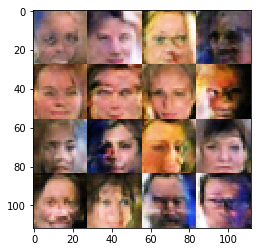

Epoch 0/1... Discriminator Loss: 1.1267... Generator Loss: 0.9299
Epoch 0/1... Discriminator Loss: 1.0389... Generator Loss: 1.4190
Epoch 0/1... Discriminator Loss: 1.1421... Generator Loss: 0.9362
Epoch 0/1... Discriminator Loss: 1.2977... Generator Loss: 0.8185
Epoch 0/1... Discriminator Loss: 1.4284... Generator Loss: 0.9889
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


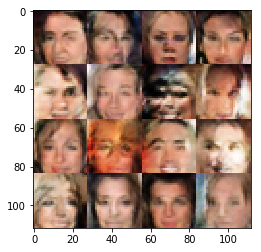

Epoch 0/1... Discriminator Loss: 1.3033... Generator Loss: 0.9805
Epoch 0/1... Discriminator Loss: 1.5376... Generator Loss: 0.5660
Epoch 0/1... Discriminator Loss: 1.2583... Generator Loss: 1.1188
Epoch 0/1... Discriminator Loss: 1.3446... Generator Loss: 0.8487
Epoch 0/1... Discriminator Loss: 0.9265... Generator Loss: 0.9890
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


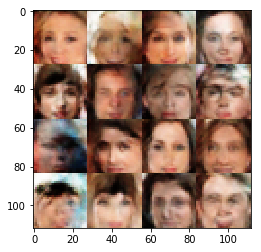

Epoch 0/1... Discriminator Loss: 1.0938... Generator Loss: 1.1185
Epoch 0/1... Discriminator Loss: 1.4622... Generator Loss: 0.8893
Epoch 0/1... Discriminator Loss: 1.0381... Generator Loss: 0.9847
Epoch 0/1... Discriminator Loss: 1.0274... Generator Loss: 1.3329
Epoch 0/1... Discriminator Loss: 1.3602... Generator Loss: 1.1538
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


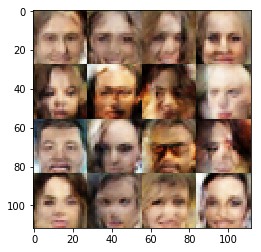

Epoch 0/1... Discriminator Loss: 1.0093... Generator Loss: 1.3757
Epoch 0/1... Discriminator Loss: 1.1004... Generator Loss: 1.0600
Epoch 0/1... Discriminator Loss: 1.2531... Generator Loss: 0.9892
Epoch 0/1... Discriminator Loss: 1.1117... Generator Loss: 1.1377
Epoch 0/1... Discriminator Loss: 1.2843... Generator Loss: 0.9058
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


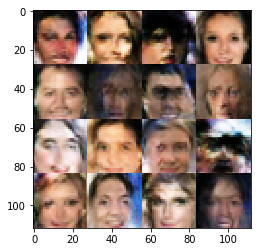

Epoch 0/1... Discriminator Loss: 1.4301... Generator Loss: 0.9277
Epoch 0/1... Discriminator Loss: 1.2492... Generator Loss: 1.3423
Epoch 0/1... Discriminator Loss: 1.1358... Generator Loss: 0.8467
Epoch 0/1... Discriminator Loss: 1.1698... Generator Loss: 0.9856
Epoch 0/1... Discriminator Loss: 1.1275... Generator Loss: 1.4211
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


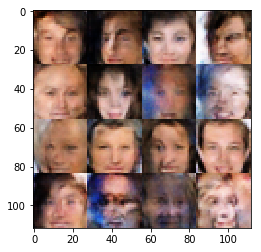

Epoch 0/1... Discriminator Loss: 1.0663... Generator Loss: 1.4570
Epoch 0/1... Discriminator Loss: 1.2807... Generator Loss: 1.2306
Epoch 0/1... Discriminator Loss: 1.3998... Generator Loss: 1.0085
Epoch 0/1... Discriminator Loss: 1.2654... Generator Loss: 0.9376
Epoch 0/1... Discriminator Loss: 1.0430... Generator Loss: 1.0219
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


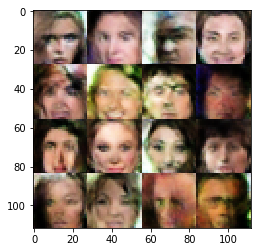

Epoch 0/1... Discriminator Loss: 1.1024... Generator Loss: 0.9809
Epoch 0/1... Discriminator Loss: 1.2757... Generator Loss: 1.0201
Epoch 0/1... Discriminator Loss: 1.0552... Generator Loss: 1.3065
Epoch 0/1... Discriminator Loss: 1.4477... Generator Loss: 0.8113
Epoch 0/1... Discriminator Loss: 1.2989... Generator Loss: 1.2736
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


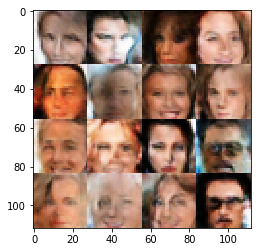

Epoch 0/1... Discriminator Loss: 1.0432... Generator Loss: 1.3001
Epoch 0/1... Discriminator Loss: 1.2902... Generator Loss: 1.0018
Epoch 0/1... Discriminator Loss: 1.2555... Generator Loss: 1.2096
Epoch 0/1... Discriminator Loss: 1.1753... Generator Loss: 1.1403
Epoch 0/1... Discriminator Loss: 1.1775... Generator Loss: 0.9454
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


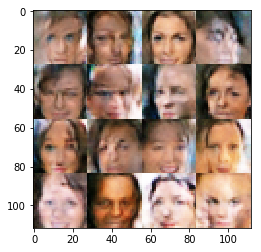

Epoch 0/1... Discriminator Loss: 1.2113... Generator Loss: 0.8634
Epoch 0/1... Discriminator Loss: 1.2373... Generator Loss: 0.7593
Epoch 0/1... Discriminator Loss: 1.3504... Generator Loss: 1.2348
Epoch 0/1... Discriminator Loss: 1.0874... Generator Loss: 1.3424
Epoch 0/1... Discriminator Loss: 1.0314... Generator Loss: 1.0487
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


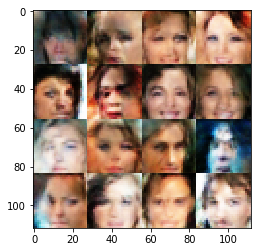

Epoch 0/1... Discriminator Loss: 0.9732... Generator Loss: 0.9580
Epoch 0/1... Discriminator Loss: 1.1727... Generator Loss: 1.0983
Epoch 0/1... Discriminator Loss: 1.3787... Generator Loss: 1.2726
Epoch 0/1... Discriminator Loss: 1.0583... Generator Loss: 1.1115
Epoch 0/1... Discriminator Loss: 1.0979... Generator Loss: 0.9015
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


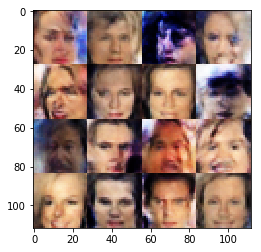

Epoch 0/1... Discriminator Loss: 1.1964... Generator Loss: 1.0571
Epoch 0/1... Discriminator Loss: 0.9722... Generator Loss: 1.1859
Epoch 0/1... Discriminator Loss: 1.3149... Generator Loss: 1.1689
Epoch 0/1... Discriminator Loss: 0.9593... Generator Loss: 1.2100
Epoch 0/1... Discriminator Loss: 1.0928... Generator Loss: 0.7529
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


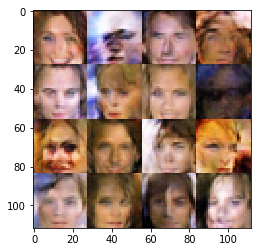

Epoch 0/1... Discriminator Loss: 1.4463... Generator Loss: 0.8182
Epoch 0/1... Discriminator Loss: 1.0742... Generator Loss: 1.1636
Epoch 0/1... Discriminator Loss: 1.3044... Generator Loss: 1.0532
Epoch 0/1... Discriminator Loss: 0.9490... Generator Loss: 1.0554
Epoch 0/1... Discriminator Loss: 1.0997... Generator Loss: 1.3177
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


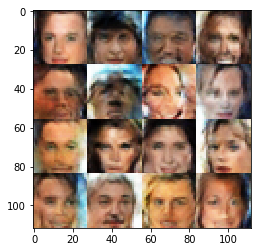

Epoch 0/1... Discriminator Loss: 1.1483... Generator Loss: 1.0187
Epoch 0/1... Discriminator Loss: 1.2441... Generator Loss: 1.0291
Epoch 0/1... Discriminator Loss: 1.2355... Generator Loss: 0.7233
Epoch 0/1... Discriminator Loss: 0.9918... Generator Loss: 0.9419
Epoch 0/1... Discriminator Loss: 1.2588... Generator Loss: 1.1069
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


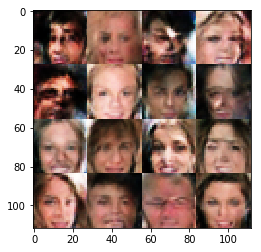

Epoch 0/1... Discriminator Loss: 1.3171... Generator Loss: 1.1388
Epoch 0/1... Discriminator Loss: 1.1232... Generator Loss: 0.9698
Epoch 0/1... Discriminator Loss: 1.3369... Generator Loss: 1.0855
Epoch 0/1... Discriminator Loss: 0.9822... Generator Loss: 1.4047
Epoch 0/1... Discriminator Loss: 1.3053... Generator Loss: 0.7619
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


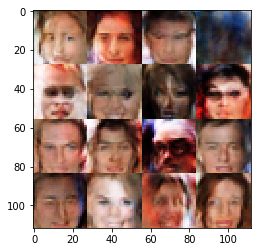

Epoch 0/1... Discriminator Loss: 1.4013... Generator Loss: 0.9922
Epoch 0/1... Discriminator Loss: 1.0520... Generator Loss: 1.0124
Epoch 0/1... Discriminator Loss: 1.1851... Generator Loss: 1.0785
Epoch 0/1... Discriminator Loss: 1.2154... Generator Loss: 1.0574
Epoch 0/1... Discriminator Loss: 1.0493... Generator Loss: 1.0623
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


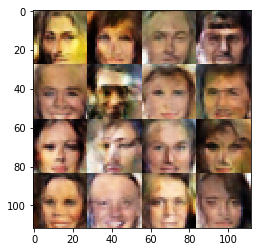

Epoch 0/1... Discriminator Loss: 1.3075... Generator Loss: 0.7942
Epoch 0/1... Discriminator Loss: 1.3177... Generator Loss: 0.8223
Epoch 0/1... Discriminator Loss: 1.1608... Generator Loss: 1.3342
Epoch 0/1... Discriminator Loss: 1.3421... Generator Loss: 0.9014
Epoch 0/1... Discriminator Loss: 1.3829... Generator Loss: 1.2087
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


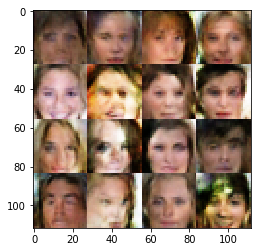

Epoch 0/1... Discriminator Loss: 1.2841... Generator Loss: 0.8806
Epoch 0/1... Discriminator Loss: 1.1627... Generator Loss: 0.8600
Epoch 0/1... Discriminator Loss: 1.3363... Generator Loss: 1.0100
Epoch 0/1... Discriminator Loss: 1.0571... Generator Loss: 1.0110
Epoch 0/1... Discriminator Loss: 1.2841... Generator Loss: 0.8407
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


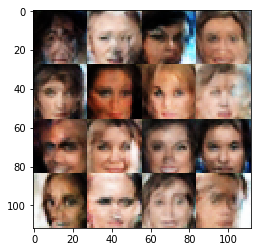

Epoch 0/1... Discriminator Loss: 1.2300... Generator Loss: 0.8913
Epoch 0/1... Discriminator Loss: 1.3044... Generator Loss: 1.1248
Epoch 0/1... Discriminator Loss: 1.1318... Generator Loss: 0.8700
Epoch 0/1... Discriminator Loss: 1.0273... Generator Loss: 0.8790
Epoch 0/1... Discriminator Loss: 1.1275... Generator Loss: 1.2785
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


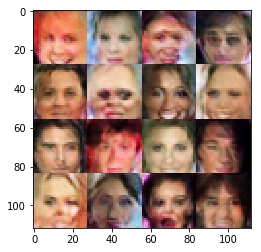

Epoch 0/1... Discriminator Loss: 1.1815... Generator Loss: 1.2303
Epoch 0/1... Discriminator Loss: 1.0929... Generator Loss: 1.3166
Epoch 0/1... Discriminator Loss: 1.3758... Generator Loss: 1.0282
Epoch 0/1... Discriminator Loss: 1.1869... Generator Loss: 0.7854
Epoch 0/1... Discriminator Loss: 1.2350... Generator Loss: 0.8770
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


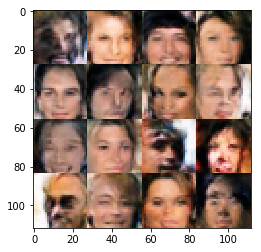

Epoch 0/1... Discriminator Loss: 1.1900... Generator Loss: 1.0491
Epoch 0/1... Discriminator Loss: 0.9811... Generator Loss: 0.9612
Epoch 0/1... Discriminator Loss: 1.1071... Generator Loss: 1.1522
Epoch 0/1... Discriminator Loss: 1.0884... Generator Loss: 0.9092
Epoch 0/1... Discriminator Loss: 1.1843... Generator Loss: 0.9941
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


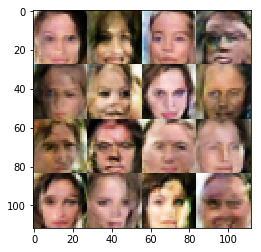

Epoch 0/1... Discriminator Loss: 1.2418... Generator Loss: 1.2905
Epoch 0/1... Discriminator Loss: 1.0706... Generator Loss: 1.0083
Epoch 0/1... Discriminator Loss: 1.2659... Generator Loss: 1.1251
Epoch 0/1... Discriminator Loss: 1.2503... Generator Loss: 0.9292
Epoch 0/1... Discriminator Loss: 1.5162... Generator Loss: 0.7717
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


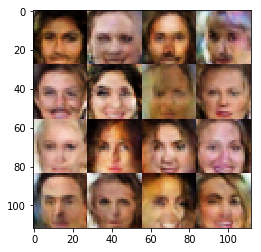

Epoch 0/1... Discriminator Loss: 0.9940... Generator Loss: 1.2495
Epoch 0/1... Discriminator Loss: 1.3736... Generator Loss: 0.8481
Epoch 0/1... Discriminator Loss: 0.9965... Generator Loss: 1.1283
Epoch 0/1... Discriminator Loss: 1.2390... Generator Loss: 1.1569
Epoch 0/1... Discriminator Loss: 1.2547... Generator Loss: 0.8284
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


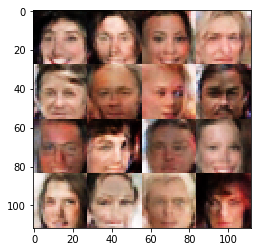

Epoch 0/1... Discriminator Loss: 1.5685... Generator Loss: 0.6968
Epoch 0/1... Discriminator Loss: 1.4729... Generator Loss: 1.0241
Epoch 0/1... Discriminator Loss: 1.1963... Generator Loss: 0.9798
Epoch 0/1... Discriminator Loss: 1.2497... Generator Loss: 1.1550
Epoch 0/1... Discriminator Loss: 1.3306... Generator Loss: 1.1075
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


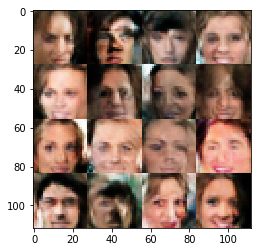

Epoch 0/1... Discriminator Loss: 1.4542... Generator Loss: 0.9071
Epoch 0/1... Discriminator Loss: 0.9865... Generator Loss: 0.9863
Epoch 0/1... Discriminator Loss: 1.0600... Generator Loss: 1.1057
Epoch 0/1... Discriminator Loss: 1.1407... Generator Loss: 1.3474
Epoch 0/1... Discriminator Loss: 1.1821... Generator Loss: 1.2099
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


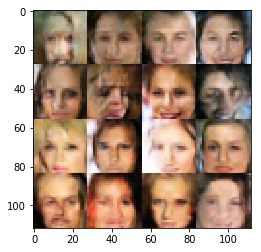

Epoch 0/1... Discriminator Loss: 1.2546... Generator Loss: 0.8485
Epoch 0/1... Discriminator Loss: 1.1067... Generator Loss: 0.9973
Epoch 0/1... Discriminator Loss: 1.3216... Generator Loss: 1.0078
Epoch 0/1... Discriminator Loss: 1.2061... Generator Loss: 1.4585
Epoch 0/1... Discriminator Loss: 1.3892... Generator Loss: 0.7173
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


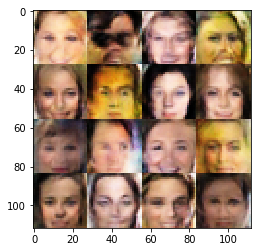

Epoch 0/1... Discriminator Loss: 1.2095... Generator Loss: 0.9689
Epoch 0/1... Discriminator Loss: 1.4414... Generator Loss: 0.8776
Epoch 0/1... Discriminator Loss: 1.1373... Generator Loss: 1.1028
Epoch 0/1... Discriminator Loss: 1.3187... Generator Loss: 0.8507
Epoch 0/1... Discriminator Loss: 1.3740... Generator Loss: 0.9585
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


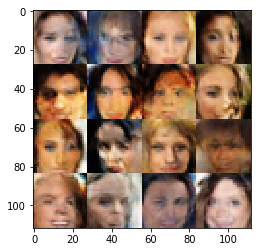

Epoch 0/1... Discriminator Loss: 1.5991... Generator Loss: 1.0750
Epoch 0/1... Discriminator Loss: 1.2100... Generator Loss: 1.2123
Epoch 0/1... Discriminator Loss: 1.0821... Generator Loss: 1.2367
Epoch 0/1... Discriminator Loss: 1.4910... Generator Loss: 0.9295
Epoch 0/1... Discriminator Loss: 1.1322... Generator Loss: 1.0455
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


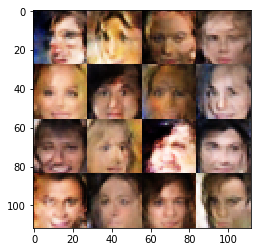

Epoch 0/1... Discriminator Loss: 1.1213... Generator Loss: 1.0494
Epoch 0/1... Discriminator Loss: 1.2798... Generator Loss: 1.0259
Epoch 0/1... Discriminator Loss: 1.2145... Generator Loss: 1.0482
Epoch 0/1... Discriminator Loss: 1.0946... Generator Loss: 0.9373
Epoch 0/1... Discriminator Loss: 1.3174... Generator Loss: 0.8130
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


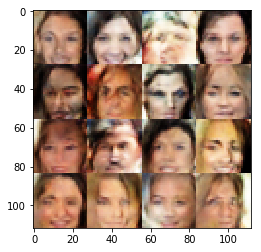

Epoch 0/1... Discriminator Loss: 1.2269... Generator Loss: 1.0952
Epoch 0/1... Discriminator Loss: 1.4358... Generator Loss: 1.1336
Epoch 0/1... Discriminator Loss: 1.0798... Generator Loss: 0.9860
Epoch 0/1... Discriminator Loss: 1.0468... Generator Loss: 1.2386
Epoch 0/1... Discriminator Loss: 1.2131... Generator Loss: 0.8118
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


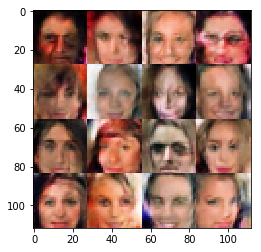

Epoch 0/1... Discriminator Loss: 0.8489... Generator Loss: 1.2837
Epoch 0/1... Discriminator Loss: 1.1267... Generator Loss: 1.1616
Epoch 0/1... Discriminator Loss: 1.3330... Generator Loss: 0.9586
Epoch 0/1... Discriminator Loss: 1.1321... Generator Loss: 1.1935
Epoch 0/1... Discriminator Loss: 0.9017... Generator Loss: 1.2636
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


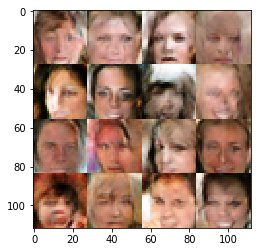

Epoch 0/1... Discriminator Loss: 1.2594... Generator Loss: 0.7990
Epoch 0/1... Discriminator Loss: 1.1427... Generator Loss: 1.0293
Epoch 0/1... Discriminator Loss: 1.3779... Generator Loss: 1.1743
Epoch 0/1... Discriminator Loss: 1.0611... Generator Loss: 1.1635
Epoch 0/1... Discriminator Loss: 1.4714... Generator Loss: 1.1185
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


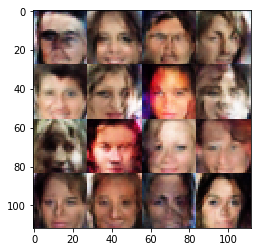

Epoch 0/1... Discriminator Loss: 1.1269... Generator Loss: 0.7612
Epoch 0/1... Discriminator Loss: 1.3189... Generator Loss: 0.9500
Epoch 0/1... Discriminator Loss: 1.2985... Generator Loss: 0.8713
Epoch 0/1... Discriminator Loss: 1.3062... Generator Loss: 0.8414
Epoch 0/1... Discriminator Loss: 1.1268... Generator Loss: 1.0352
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


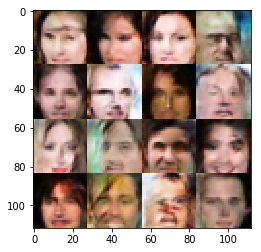

Epoch 0/1... Discriminator Loss: 1.3200... Generator Loss: 1.0713
Epoch 0/1... Discriminator Loss: 1.1746... Generator Loss: 1.0615
Epoch 0/1... Discriminator Loss: 1.2853... Generator Loss: 1.2363
Epoch 0/1... Discriminator Loss: 0.9764... Generator Loss: 1.2552
Epoch 0/1... Discriminator Loss: 0.9888... Generator Loss: 1.3101
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


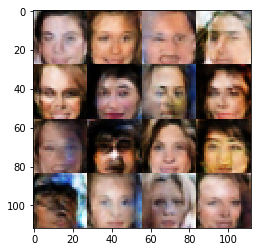

Epoch 0/1... Discriminator Loss: 1.4605... Generator Loss: 0.9016
Epoch 0/1... Discriminator Loss: 1.3166... Generator Loss: 1.3135
Epoch 0/1... Discriminator Loss: 1.1404... Generator Loss: 1.1075
Epoch 0/1... Discriminator Loss: 1.2782... Generator Loss: 1.1012
Epoch 0/1... Discriminator Loss: 1.2379... Generator Loss: 0.7712
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


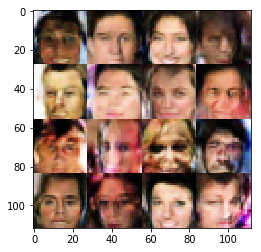

Epoch 0/1... Discriminator Loss: 1.1487... Generator Loss: 1.0323
Epoch 0/1... Discriminator Loss: 1.2268... Generator Loss: 1.2197
Epoch 0/1... Discriminator Loss: 1.3438... Generator Loss: 0.7845
Epoch 0/1... Discriminator Loss: 1.5086... Generator Loss: 1.0954
Epoch 0/1... Discriminator Loss: 1.0534... Generator Loss: 1.1225
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


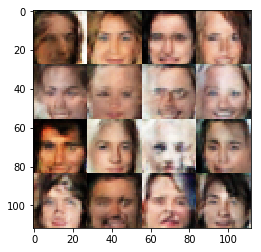

Epoch 0/1... Discriminator Loss: 1.4087... Generator Loss: 0.9991
Epoch 0/1... Discriminator Loss: 1.1783... Generator Loss: 1.3830
Epoch 0/1... Discriminator Loss: 1.2362... Generator Loss: 0.8539
Epoch 0/1... Discriminator Loss: 1.4208... Generator Loss: 0.9907
Epoch 0/1... Discriminator Loss: 1.2979... Generator Loss: 0.9539
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


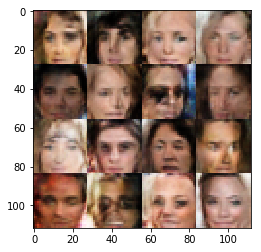

Epoch 0/1... Discriminator Loss: 1.4408... Generator Loss: 1.0838
Epoch 0/1... Discriminator Loss: 0.9034... Generator Loss: 1.1282
Epoch 0/1... Discriminator Loss: 1.4044... Generator Loss: 1.0113
Epoch 0/1... Discriminator Loss: 1.1942... Generator Loss: 0.9362
Epoch 0/1... Discriminator Loss: 0.9660... Generator Loss: 1.2244
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


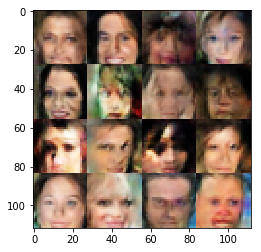

Epoch 0/1... Discriminator Loss: 1.1635... Generator Loss: 0.8005
Epoch 0/1... Discriminator Loss: 1.5783... Generator Loss: 0.8814
Epoch 0/1... Discriminator Loss: 1.0397... Generator Loss: 0.9783
Epoch 0/1... Discriminator Loss: 1.4554... Generator Loss: 0.8637
Epoch 0/1... Discriminator Loss: 1.2671... Generator Loss: 0.7661
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


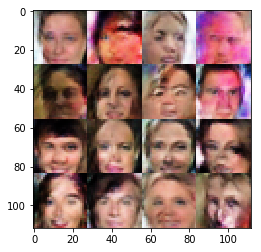

Epoch 0/1... Discriminator Loss: 1.1069... Generator Loss: 1.0752
Epoch 0/1... Discriminator Loss: 1.1587... Generator Loss: 0.8722
Epoch 0/1... Discriminator Loss: 1.2702... Generator Loss: 0.8633
Epoch 0/1... Discriminator Loss: 1.1915... Generator Loss: 1.0688
Epoch 0/1... Discriminator Loss: 1.3624... Generator Loss: 0.7986
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


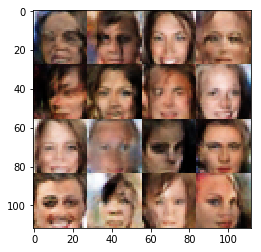

Epoch 0/1... Discriminator Loss: 1.0479... Generator Loss: 0.8974
Epoch 0/1... Discriminator Loss: 1.0594... Generator Loss: 1.1942
Epoch 0/1... Discriminator Loss: 1.3074... Generator Loss: 1.2415
Epoch 0/1... Discriminator Loss: 1.2218... Generator Loss: 0.7339
Epoch 0/1... Discriminator Loss: 1.2486... Generator Loss: 0.7419
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


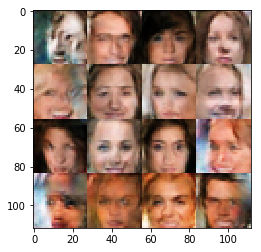

Epoch 0/1... Discriminator Loss: 0.9997... Generator Loss: 1.5106
Epoch 0/1... Discriminator Loss: 1.2363... Generator Loss: 0.9497
Epoch 0/1... Discriminator Loss: 1.1159... Generator Loss: 1.3656
Epoch 0/1... Discriminator Loss: 1.1119... Generator Loss: 0.9889
Epoch 0/1... Discriminator Loss: 1.0226... Generator Loss: 1.1358
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


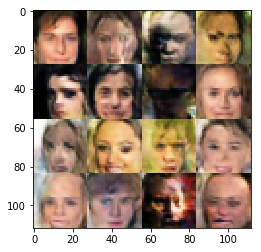

Epoch 0/1... Discriminator Loss: 1.2781... Generator Loss: 1.0750
Epoch 0/1... Discriminator Loss: 1.0578... Generator Loss: 1.3575
Epoch 0/1... Discriminator Loss: 1.2672... Generator Loss: 0.7098
Epoch 0/1... Discriminator Loss: 0.9557... Generator Loss: 0.9218
Epoch 0/1... Discriminator Loss: 1.0083... Generator Loss: 0.8750
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


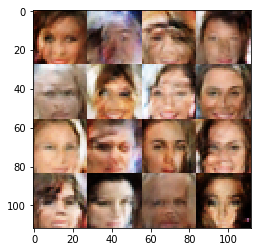

Epoch 0/1... Discriminator Loss: 1.4004... Generator Loss: 0.9966
Epoch 0/1... Discriminator Loss: 0.9816... Generator Loss: 1.1811
Epoch 0/1... Discriminator Loss: 1.1773... Generator Loss: 0.7438
Epoch 0/1... Discriminator Loss: 1.5153... Generator Loss: 0.6762
Epoch 0/1... Discriminator Loss: 1.2492... Generator Loss: 1.1573
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


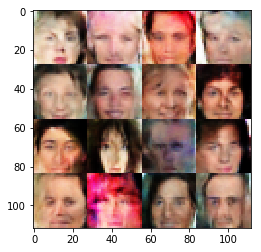

Epoch 0/1... Discriminator Loss: 1.3486... Generator Loss: 0.6437
Epoch 0/1... Discriminator Loss: 1.3211... Generator Loss: 0.8459
Epoch 0/1... Discriminator Loss: 1.3457... Generator Loss: 0.9091
Epoch 0/1... Discriminator Loss: 1.3423... Generator Loss: 0.7561
Epoch 0/1... Discriminator Loss: 1.2479... Generator Loss: 1.0744
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


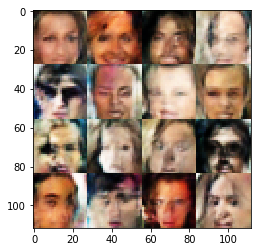

Epoch 0/1... Discriminator Loss: 1.0139... Generator Loss: 1.2748
Epoch 0/1... Discriminator Loss: 1.3564... Generator Loss: 1.1143
Epoch 0/1... Discriminator Loss: 1.2567... Generator Loss: 0.9680
Epoch 0/1... Discriminator Loss: 1.0381... Generator Loss: 1.1623
Epoch 0/1... Discriminator Loss: 1.1933... Generator Loss: 1.1242
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


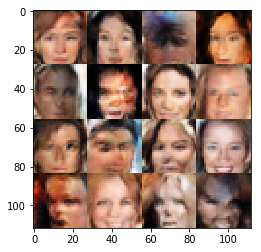

Epoch 0/1... Discriminator Loss: 0.9711... Generator Loss: 0.9942
Epoch 0/1... Discriminator Loss: 1.4260... Generator Loss: 1.2155
Epoch 0/1... Discriminator Loss: 0.9570... Generator Loss: 0.9480
Epoch 0/1... Discriminator Loss: 1.0967... Generator Loss: 1.2349
Epoch 0/1... Discriminator Loss: 1.1782... Generator Loss: 0.9989
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


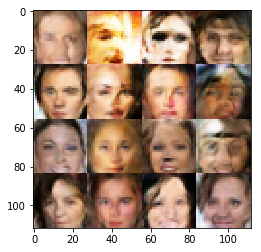

Epoch 0/1... Discriminator Loss: 1.4585... Generator Loss: 0.7776
Epoch 0/1... Discriminator Loss: 1.2965... Generator Loss: 0.6011
Epoch 0/1... Discriminator Loss: 1.1599... Generator Loss: 0.6872
Epoch 0/1... Discriminator Loss: 0.9146... Generator Loss: 1.0178
Epoch 0/1... Discriminator Loss: 1.1125... Generator Loss: 1.3332
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


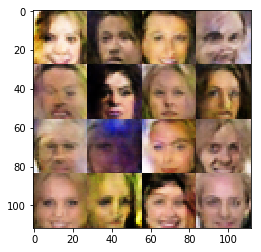

Epoch 0/1... Discriminator Loss: 1.2424... Generator Loss: 0.8530
Epoch 0/1... Discriminator Loss: 1.2756... Generator Loss: 0.6408
Epoch 0/1... Discriminator Loss: 1.4255... Generator Loss: 0.9293
Epoch 0/1... Discriminator Loss: 1.2046... Generator Loss: 1.2270
Epoch 0/1... Discriminator Loss: 1.1405... Generator Loss: 1.3362
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


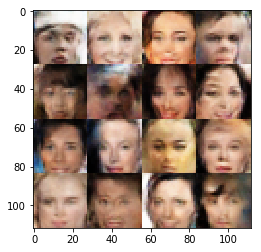

Epoch 0/1... Discriminator Loss: 1.0176... Generator Loss: 1.0343
Epoch 0/1... Discriminator Loss: 1.2385... Generator Loss: 0.9242
Epoch 0/1... Discriminator Loss: 1.1506... Generator Loss: 1.2126
Epoch 0/1... Discriminator Loss: 1.1957... Generator Loss: 1.1011
Epoch 0/1... Discriminator Loss: 1.1453... Generator Loss: 1.1513
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


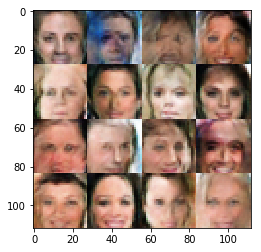

Epoch 0/1... Discriminator Loss: 0.9023... Generator Loss: 1.4412
Epoch 0/1... Discriminator Loss: 1.0130... Generator Loss: 0.9937
Epoch 0/1... Discriminator Loss: 1.2320... Generator Loss: 1.1834
Epoch 0/1... Discriminator Loss: 1.2853... Generator Loss: 1.2058
Epoch 0/1... Discriminator Loss: 1.3673... Generator Loss: 1.1082
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


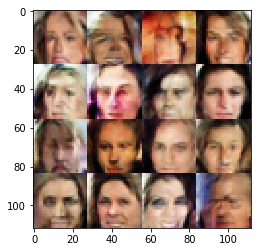

Epoch 0/1... Discriminator Loss: 0.9168... Generator Loss: 0.8480
Epoch 0/1... Discriminator Loss: 1.2973... Generator Loss: 1.0635
Epoch 0/1... Discriminator Loss: 1.1925... Generator Loss: 1.1660
Epoch 0/1... Discriminator Loss: 1.2273... Generator Loss: 1.0055
Epoch 0/1... Discriminator Loss: 1.4628... Generator Loss: 0.8537
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


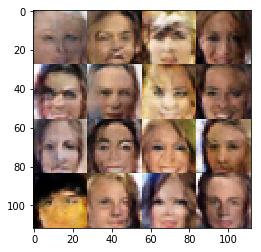

Epoch 0/1... Discriminator Loss: 1.1397... Generator Loss: 1.1033
Epoch 0/1... Discriminator Loss: 0.8512... Generator Loss: 1.3952
Epoch 0/1... Discriminator Loss: 1.2580... Generator Loss: 1.0499
Epoch 0/1... Discriminator Loss: 1.0478... Generator Loss: 1.2518
Epoch 0/1... Discriminator Loss: 1.5714... Generator Loss: 1.0060
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


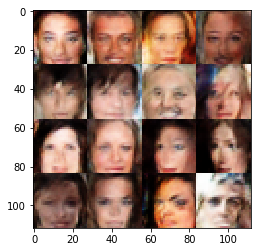

Epoch 0/1... Discriminator Loss: 1.0792... Generator Loss: 1.2905
Epoch 0/1... Discriminator Loss: 1.3051... Generator Loss: 1.0577
Epoch 0/1... Discriminator Loss: 1.0647... Generator Loss: 1.0349
Epoch 0/1... Discriminator Loss: 1.2882... Generator Loss: 1.1462
Epoch 0/1... Discriminator Loss: 1.0356... Generator Loss: 1.0550
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


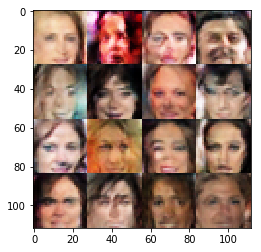

Epoch 0/1... Discriminator Loss: 1.1137... Generator Loss: 0.9567
Epoch 0/1... Discriminator Loss: 1.2183... Generator Loss: 1.1778
Epoch 0/1... Discriminator Loss: 0.9130... Generator Loss: 1.1591
Epoch 0/1... Discriminator Loss: 0.8746... Generator Loss: 1.3046
Epoch 0/1... Discriminator Loss: 1.5675... Generator Loss: 0.6555
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


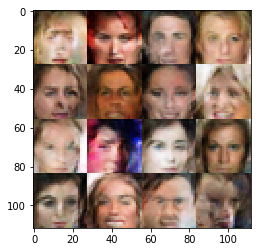

Epoch 0/1... Discriminator Loss: 0.9911... Generator Loss: 1.0226
Epoch 0/1... Discriminator Loss: 1.5126... Generator Loss: 1.3268
Epoch 0/1... Discriminator Loss: 1.3328... Generator Loss: 0.7538
Epoch 0/1... Discriminator Loss: 1.3155... Generator Loss: 1.0786
Epoch 0/1... Discriminator Loss: 1.3104... Generator Loss: 0.9050
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


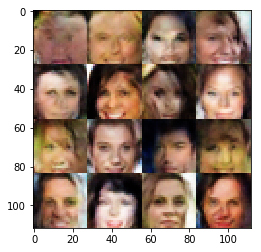

Epoch 0/1... Discriminator Loss: 1.2087... Generator Loss: 0.7868
Epoch 0/1... Discriminator Loss: 1.1085... Generator Loss: 1.0841
Epoch 0/1... Discriminator Loss: 1.2355... Generator Loss: 0.9895
Epoch 0/1... Discriminator Loss: 1.4607... Generator Loss: 0.9617
Epoch 0/1... Discriminator Loss: 1.1193... Generator Loss: 1.1437
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


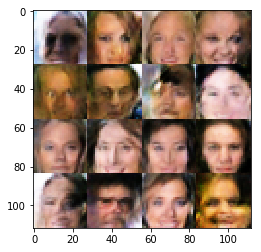

Epoch 0/1... Discriminator Loss: 1.1081... Generator Loss: 1.2849
Epoch 0/1... Discriminator Loss: 1.2116... Generator Loss: 1.1911
Epoch 0/1... Discriminator Loss: 1.5287... Generator Loss: 1.1950
Epoch 0/1... Discriminator Loss: 1.3005... Generator Loss: 0.9792
Epoch 0/1... Discriminator Loss: 1.3193... Generator Loss: 0.8168
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


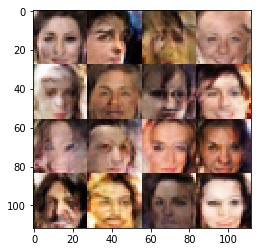

Epoch 0/1... Discriminator Loss: 1.1348... Generator Loss: 1.1054
Epoch 0/1... Discriminator Loss: 1.1710... Generator Loss: 1.2093
Epoch 0/1... Discriminator Loss: 1.2446... Generator Loss: 0.8132
Epoch 0/1... Discriminator Loss: 1.3136... Generator Loss: 0.9517
Epoch 0/1... Discriminator Loss: 1.2127... Generator Loss: 1.0307
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


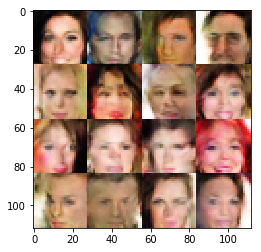

Epoch 0/1... Discriminator Loss: 1.7158... Generator Loss: 0.6016
Epoch 0/1... Discriminator Loss: 0.9414... Generator Loss: 0.9881
Epoch 0/1... Discriminator Loss: 1.0795... Generator Loss: 1.2281
Epoch 0/1... Discriminator Loss: 0.9681... Generator Loss: 1.2260
Epoch 0/1... Discriminator Loss: 1.2934... Generator Loss: 1.4148
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


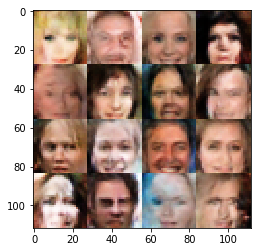

Epoch 0/1... Discriminator Loss: 1.1555... Generator Loss: 1.1759
Epoch 0/1... Discriminator Loss: 1.3396... Generator Loss: 0.8037
Epoch 0/1... Discriminator Loss: 1.1201... Generator Loss: 1.1639
Epoch 0/1... Discriminator Loss: 0.9710... Generator Loss: 1.0426
Epoch 0/1... Discriminator Loss: 1.1486... Generator Loss: 0.9453
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


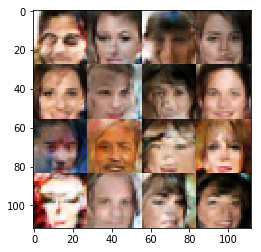

Epoch 0/1... Discriminator Loss: 1.0159... Generator Loss: 1.3701
Epoch 0/1... Discriminator Loss: 1.5303... Generator Loss: 0.8643
Epoch 0/1... Discriminator Loss: 1.2975... Generator Loss: 1.2988
Epoch 0/1... Discriminator Loss: 1.3145... Generator Loss: 1.2523
Epoch 0/1... Discriminator Loss: 1.0664... Generator Loss: 1.0872
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


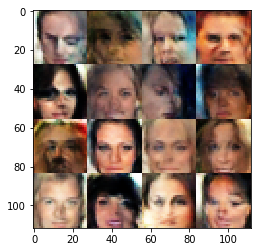

Epoch 0/1... Discriminator Loss: 1.3822... Generator Loss: 1.2110
Epoch 0/1... Discriminator Loss: 1.4767... Generator Loss: 0.9259
Epoch 0/1... Discriminator Loss: 1.3383... Generator Loss: 0.8647
Epoch 0/1... Discriminator Loss: 1.5072... Generator Loss: 0.8443
Epoch 0/1... Discriminator Loss: 1.2233... Generator Loss: 1.0907
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


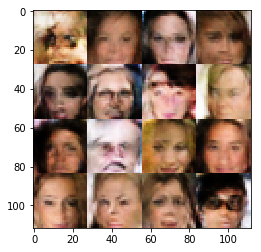

Epoch 0/1... Discriminator Loss: 1.0194... Generator Loss: 0.9276
Epoch 0/1... Discriminator Loss: 1.4057... Generator Loss: 1.1170
Epoch 0/1... Discriminator Loss: 1.3227... Generator Loss: 1.3082
Epoch 0/1... Discriminator Loss: 1.2377... Generator Loss: 1.0711
Epoch 0/1... Discriminator Loss: 1.1803... Generator Loss: 1.0247
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


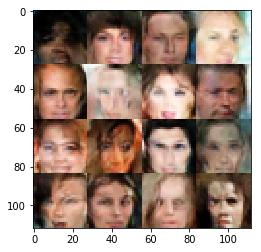

Epoch 0/1... Discriminator Loss: 1.0689... Generator Loss: 0.8204
Epoch 0/1... Discriminator Loss: 1.0059... Generator Loss: 1.4591
Epoch 0/1... Discriminator Loss: 0.9729... Generator Loss: 1.0233
Epoch 0/1... Discriminator Loss: 1.2045... Generator Loss: 0.9588
Epoch 0/1... Discriminator Loss: 1.1930... Generator Loss: 1.1513
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


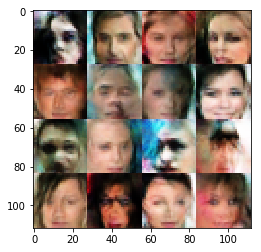

Epoch 0/1... Discriminator Loss: 1.4833... Generator Loss: 0.7302
Epoch 0/1... Discriminator Loss: 1.5263... Generator Loss: 1.1412
Epoch 0/1... Discriminator Loss: 1.2634... Generator Loss: 0.7769
Epoch 0/1... Discriminator Loss: 1.1268... Generator Loss: 1.2953
Epoch 0/1... Discriminator Loss: 1.1936... Generator Loss: 1.0433
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


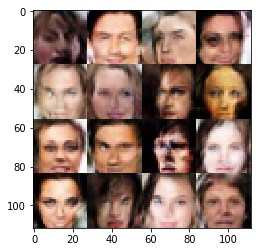

Epoch 0/1... Discriminator Loss: 1.2275... Generator Loss: 0.9735
Epoch 0/1... Discriminator Loss: 0.9705... Generator Loss: 1.0931
Epoch 0/1... Discriminator Loss: 1.3128... Generator Loss: 1.0501
Epoch 0/1... Discriminator Loss: 1.3113... Generator Loss: 1.1072
Epoch 0/1... Discriminator Loss: 1.1430... Generator Loss: 1.2972
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


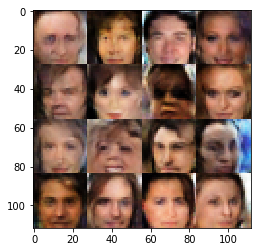

Epoch 0/1... Discriminator Loss: 1.1712... Generator Loss: 0.8084
Epoch 0/1... Discriminator Loss: 1.4036... Generator Loss: 1.1728
Epoch 0/1... Discriminator Loss: 1.4879... Generator Loss: 0.9097
Epoch 0/1... Discriminator Loss: 1.3752... Generator Loss: 0.8989
Epoch 0/1... Discriminator Loss: 1.2051... Generator Loss: 1.0397
x1 (?, 7, 7, 512)
x2 (?, 14, 14, 128)
x3 (?, 28, 28, 32)
logits (?, 28, 28, 3)


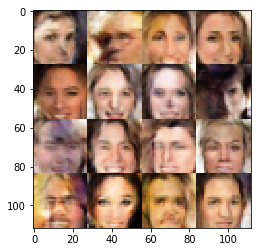

Epoch 0/1... Discriminator Loss: 1.2880... Generator Loss: 0.9097
Epoch 0/1... Discriminator Loss: 1.2153... Generator Loss: 0.8472
CPU times: user 14min 55s, sys: 4min 4s, total: 18min 59s
Wall time: 14min 50s


In [15]:
%%time
batch_size = 16
z_dim = 128
learning_rate = 0.0002
beta1 = 0.4
alpha=0.2

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
print("finished loading images.")

with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.